<a id="0"></a> <br>

# **Bachelor Thesis**

 *By Sandro Gogaladze*

### **Income Estimation Models Analysis: Balancing Accuracy with Regulatory Requirements in the Georgian Banking Sector**

<a id="agenda"></a>

## Agenda

1. [Setup and Data Loading](#setup-and-data-loading)
2. [Exploratory Data Analysis](#eda)
   - [Dataset Overview](#dataset-overview)
   - [Missing Value Analysis](#missing-value-analysis)
   - [Statistical Summary](#statistical-summary)
3. [Data Visualization and Analysis](#data-visualization)
   - [Distribution of Target Variable](#target-distribution)
   - [Univariate Analysis](#univariate-analysis)
   - [Zeros Analysis](#zeros-analysis)
   - [Multivariate Analysis](#multivariate-analysis)
     - [Correlation Matrix](#correlation-matrix)
     - [Feature Correlations with Target](#feature-target-correlations)
     - [Pairwise Relationships](#pairwise-relationships)
     - [Principal Component Analysis (PCA)](#pca)
4. [Data Preparation](#data-preparation)
   - [Data Loading](#data-loading)
   - [Preprocessing Strategy](#preprocessing-strategy)
   - [Implementation](#preprocessing-implementation)
5. [Modeling](#modeling)
   - [Setup and Evaluation Framework](#modeling-setup)
     - [Visualization Configuration](#libraries-configuration)
     - [Model Evaluation Toolkit](#evaluation-utilities)
     - [Data Loading and Preparation](#modeling-data-preparation)
   - [Baseline XGBoost Model](#baseline-xgboost)
     - [Model Training and Hyperparameter Tuning](#baseline-training)
     - [Detailed Model Evaluation](#baseline-evaluation)
   - [Post-hoc Calibrated XGBoost Model](#post-hoc-calibration)
     - [Helper Functions for Calibration](#calibration-helpers)
     - [Training Quantile Regressors](#quantile-regressors)
     - [Evaluating the Calibrated Model](#calibration-evaluation)
   - [Pre-hoc Adjusted XGBoost Model](#pre-hoc-adjustment)
     - [Modeling Toolkit](#modeling-toolkit)
     - [Model 1: Huber Loss + Threshold Penalty](#model-1)
     - [Model 2: Segment-Aware Huber + Threshold Penalty](#model-2)
     - [Pre-hoc Models Comparison](#prehoc-models-comparison)



<a id="setup-and-data-loading"></a>
# 1. Setup and Data Loading

Setting up our environment and loading the income dataset from BOG.

In [1]:
# === Import Required Libraries ===
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import random

# === Set Global Random Seeds for Reproducibility ===
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)
random.seed(RANDOM_STATE)  # Added for complete reproducibility

# === Visualization Settings ===
sns.set_style("whitegrid")  # Use white grid background for seaborn plots
plt.rcParams["figure.figsize"] = (10, 6)  # Default plot size

def load_income_data(filepath):
    """
    Load the income dataset from the specified Excel file.

    Parameters
    ----------
    filepath : str or pathlib.Path
        Path to the Excel file containing the income data.

    Returns
    -------
    pd.DataFrame
        Loaded income dataset from the 'income_data' sheet.
    """
    return pd.read_excel(filepath, sheet_name="income_data")

# === Load Dataset ===
data_path = Path("..") / "data" / "raw" / "income_data.xlsx"  # Define path to dataset
df = load_income_data(data_path)  # Read data from Excel

# === Display Dataset Info ===
print(f"Dataset Shape: {df.shape[0]} rows, {df.shape[1]} columns")
df.head()  # Show the first few rows

Dataset Shape: 100000 rows, 22 columns


,target,Inc_Past,Liab_Tot,Inc_in,Transfers_out,Payment_L,Min_transfer_In,Turnover,Transactions,Salary,...,Transfers_in,Trn_max,Balance,Loan,Payments,Inc_Past_avg,Inc_Past_max,Tot_in,Bal_Cur,Loan_Cnt
0,2181,2777.195785,44602.771367,2653.0275,4403.502844,1376.27,2665.9753,2034.681741,4791.205440,1818,...,2531,50122.787705,3340.0,739.314898,60467.242121,0.000000,1676.276897,43645.292490,2335.885221,0.0
1,2234,2990.621878,69743.054007,2846.3787,14301.294615,1273.84,757.6630,4533.526273,26399.439740,528,...,788,29988.399052,1109.0,3470.616261,314169.073224,3705.778804,8561.789769,194165.567817,9558.020208,0.0
2,550,0.000000,10204.333221,650.8682,1091.498280,378.60,0.0000,636.005285,634.152829,264,...,369,117251.845035,4226.0,0.000000,0.000000,1653.192006,0.000000,0.000000,0.000000,0.0
3,1998,5054.195547,26858.856944,2163.8332,6881.157648,1823.42,1910.0083,5390.744004,6555.062441,1490,...,821,31746.542498,668.0,0.000000,127750.487939,1613.766044,450.630630,119729.437108,4571.733008,7.0
4,1493,2308.910985,6290.469562,1072.9084,1907.841516,933.49,1052.4194,1288.780352,2222.979571,1564,...,1409,229239.551743,943.0,2911.261656,22783.555228,1241.377471,2630.575931,18645.055929,1969.973314,0.0


<a id="eda"></a>
# 2. Exploratory Data Analysis

<a id="dataset-overview"></a>
## 2.1 Dataset Overview

In [2]:
# === Display Dataset Structure and Data Types ===
print("Dataset Information:")
df.info()  # Output column names, non-null counts, and data types

Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 22 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   target           100000 non-null  int64  
 1   Inc_Past         97608 non-null   float64
 2   Liab_Tot         95843 non-null   float64
 3   Inc_in           100000 non-null  float64
 4   Transfers_out    99833 non-null   float64
 5   Payment_L        85850 non-null   float64
 6   Min_transfer_In  100000 non-null  float64
 7   Turnover         97682 non-null   float64
 8   Transactions     99794 non-null   float64
 9   Salary           100000 non-null  int64  
 10  Inc_6M           100000 non-null  int64  
 11  Acct_Trns        99745 non-null   float64
 12  Transfers_in     100000 non-null  int64  
 13  Trn_max          99769 non-null   float64
 14  Balance          99908 non-null   float64
 15  Loan             100000 non-null  float64
 16  Payments         9

Key observations:
- 100,000 records with 22 columns (21 features, 1 target)
- All variables are numerical
- Several columns have missing values
- Features include income history, liabilities, transactions, and loan data

<a id="missing-value-analysis"></a>
## 2.2 Missing Value Analysis

Missing Value Statistics:
                 Missing Count  Missing %
Payment_L                14150     14.150
Loan_Cnt                  6163      6.163
Liab_Tot                  4157      4.157
Inc_Past                  2392      2.392
Inc_Past_avg              2379      2.379
Inc_Past_max              2334      2.334
Turnover                  2318      2.318
Acct_Trns                  255      0.255
Tot_in                     239      0.239
Trn_max                    231      0.231
Transactions               206      0.206
Payments                   194      0.194
Transfers_out              167      0.167
Bal_Cur                    129      0.129
Balance                     92      0.092
Salary                       0      0.000
Inc_6M                       0      0.000
Min_transfer_In              0      0.000
Transfers_in                 0      0.000
Loan                         0      0.000
Inc_in                       0      0.000
target                       0      0.000


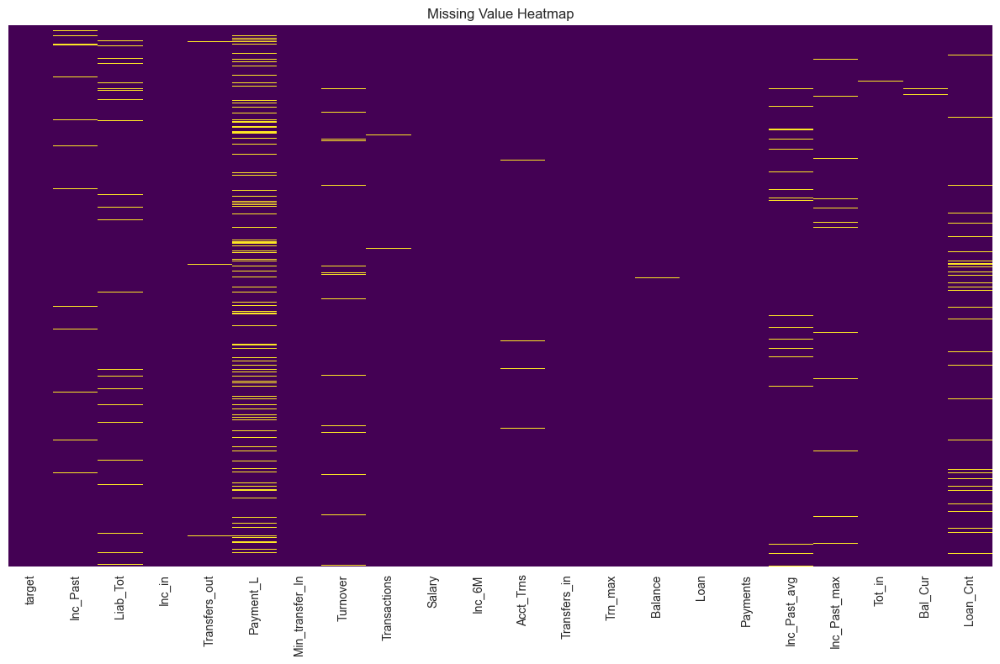

In [3]:
def analyze_missing_values(dataframe):
    """
    Analyze missing values in the dataset.

    Parameters
    ----------
    dataframe : pd.DataFrame
        The dataset to analyze.

    Returns
    -------
    pd.DataFrame
        DataFrame containing the count and percentage of missing values,
        sorted by descending percentage.
    """
    # Count missing values and calculate their percentage
    missing_stats = dataframe.isnull().sum().to_frame(name='Missing Count')
    missing_stats['Missing %'] = (missing_stats['Missing Count'] / len(dataframe)) * 100

    # Sort by percentage of missing values (descending)
    missing_stats = missing_stats.sort_values('Missing %', ascending=False)
    
    return missing_stats

# === Analyze Missing Values ===
missing_stats = analyze_missing_values(df)

print("Missing Value Statistics:")
print(missing_stats)

# === Visualize Missing Values ===
plt.figure(figsize=(12, 8))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis', yticklabels=False)
plt.title('Missing Value Heatmap')
plt.tight_layout()
plt.show()

The heatmap and statistics reveal the pattern of missing values in our dataset:

- `Payment_L` has the highest missing rate (14.15%)
- `Loan_Cnt`, `Liab_Tot`, and past income features (`Inc_Past`, `Inc_Past_avg`, `Inc_Past_max`) have missing rates between 2.3-6.2%
- Six features have no missing values, including the target variable
- Most features have manageable missing rates (<1%)

Missing value imputation will be required in preprocessing to maintain the full dataset size.

<a id="statistical-summary"></a>
## 2.3 Statistical Summary

In [4]:
# === Generate Descriptive Statistics ===
desc_stats = df.describe().T  # Transpose for easier readability

# Add additional statistics
desc_stats['range'] = desc_stats['max'] - desc_stats['min']               # Range = max - min
desc_stats['iqr'] = desc_stats['75%'] - desc_stats['25%']                 # IQR = Q3 - Q1
desc_stats['skew'] = df.skew(numeric_only=True)                           # Skewness of each numeric feature

# Display statistics summary
print("Descriptive Statistics:")
desc_stats

Descriptive Statistics:


,count,mean,std,min,25%,50%,75%,max,range,iqr,skew
target,100000.0,2541.772490,1929.361645,200.0,1167.000000,1982.000000,3285.000000,1.000000e+04,9.800000e+03,2118.000000,1.396658
Inc_Past,97608.0,2001.694825,1751.384647,0.0,873.460395,1587.822984,2541.163565,1.669317e+04,1.669317e+04,1667.703169,1.864503
Liab_Tot,95843.0,33654.667147,53118.870844,0.0,4283.784119,12967.501819,31857.706308,3.559312e+05,3.559312e+05,27573.922189,2.518320
Inc_in,100000.0,2564.976155,2429.019112,0.0,1124.697375,1742.877700,2904.602200,2.150360e+04,2.150360e+04,1779.904825,2.427768
Transfers_out,99833.0,8311.281146,11918.299548,0.0,2037.419947,3656.712295,10629.594016,9.131236e+04,9.131236e+04,8592.174069,3.336928
Payment_L,85850.0,1217.966961,1259.229461,0.0,375.055000,926.905000,1581.337500,8.718100e+03,8.718100e+03,1206.282500,2.452769
Min_transfer_In,100000.0,2067.810519,1971.503812,0.0,886.929800,1514.585300,2603.208825,1.286264e+04,1.286264e+04,1716.279025,1.981603
Turnover,97682.0,2337.345071,2430.448673,0.0,838.062207,1642.369908,2999.318811,1.941471e+04,1.941471e+04,2161.256604,2.352599
Transactions,99794.0,9241.563685,11874.888421,0.0,2270.432524,4964.548325,9704.132936,8.117316e+04,8.117316e+04,7433.700412,2.691648
Salary,100000.0,1763.163670,1748.085565,0.0,686.000000,1310.000000,2010.000000,1.185500e+04,1.185500e+04,1324.000000,1.936440


The statistical summary reveals key characteristics of our dataset:

- **Target variable**: Ranges from 200 to 10,000 with mean ~2,542, showing right-skew (1.4)
- **High skewness**: All features show positive skew (>1.5), indicating heavy right tails
- **Wide ranges**: Many features have extreme maximum values (e.g., Payments: 1.14M)
- **Outliers**: Large gaps between 75th percentile and maximum values suggest outliers
- **Zero values**: Features like `Loan` have 50th percentile of 0, indicating many customers without loans
- **Negative values**: `Balance` shows minimum of -453, representing overdrafts

These characteristics point to the need for transformation and robust modeling approaches.

<a id="data-visualization"></a>
# 3. Data Visualization and Analysis

<a id="target-distribution"></a>
## 3.1 Distribution of Target Variable

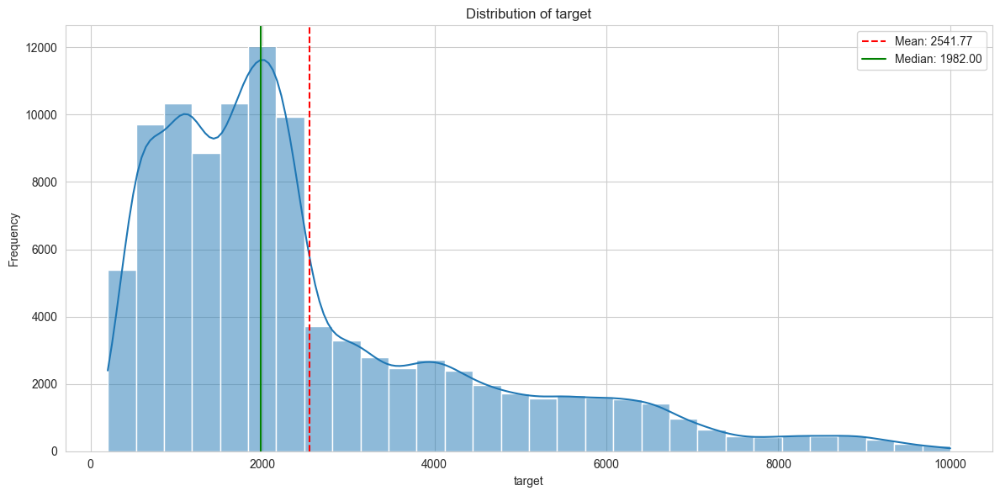


📊 Income Range Balance:
                   Count  Percentage
target                              
Low (200–1500)     34038       34.07
Mid (1500–2500)    32692       32.72
High (2500–10000)  33176       33.21


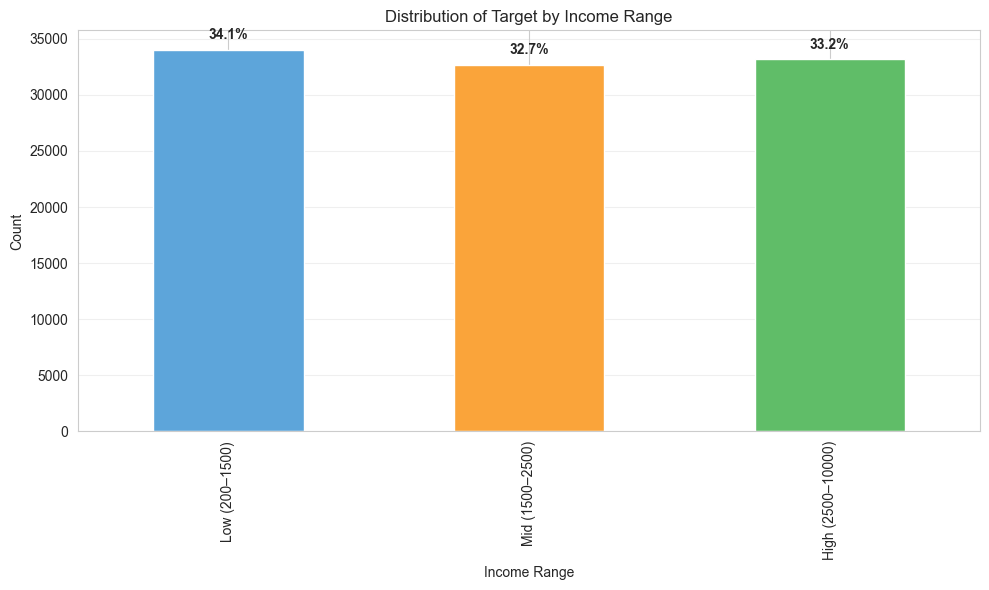

In [5]:
def plot_target_distribution(dataframe, target_col='target'):
    """
    Plot the distribution of the target variable with mean and median.

    Parameters
    ----------
    dataframe : pd.DataFrame
        The dataset containing the target variable.
    target_col : str, optional (default='target')
        The name of the target column.
    """
    plt.figure(figsize=(12, 6))
    
    # Histogram with KDE overlay
    sns.histplot(dataframe[target_col], kde=True, bins=30)
    
    # Add vertical lines for mean and median
    plt.axvline(dataframe[target_col].mean(), color='red', linestyle='--', 
                label=f'Mean: {dataframe[target_col].mean():.2f}')
    plt.axvline(dataframe[target_col].median(), color='green', linestyle='-', 
                label=f'Median: {dataframe[target_col].median():.2f}')
    
    plt.title(f'Distribution of {target_col}')
    plt.xlabel(target_col)
    plt.ylabel('Frequency')
    plt.legend()
    plt.tight_layout()
    plt.show()


def show_range_balance(y_values):
    """
    Analyze and display the balance of values across predefined income ranges.

    Parameters
    ----------
    y_values : pd.Series
        Target values to categorize and analyze.

    Returns
    -------
    pd.DataFrame
        DataFrame with counts and percentages for each income range.
    """
    # Define income ranges
    ranges = pd.cut(
        y_values,
        bins=[200, 1500, 2500, 10000],
        labels=["Low (200–1500)", "Mid (1500–2500)", "High (2500–10000)"]
    )

    # Compute counts and percentages
    counts = ranges.value_counts().sort_index()
    percentages = ranges.value_counts(normalize=True).sort_index() * 100

    # Create summary DataFrame
    balance_df = pd.DataFrame({
        "Count": counts,
        "Percentage": percentages.round(2)
    })

    print("\n📊 Income Range Balance:")
    print(balance_df)

    # Plot bar chart with percentage annotations
    plt.figure(figsize=(10, 6))
    ax = counts.plot(kind='bar', color=['#5DA5DA', '#FAA43A', '#60BD68'])

    for i, (count, percentage) in enumerate(zip(counts, percentages)):
        ax.text(i, count + (counts.max() * 0.02), f"{percentage:.1f}%", 
                ha='center', va='bottom', fontweight='bold')

    plt.title('Distribution of Target by Income Range')
    plt.xlabel('Income Range')
    plt.ylabel('Count')
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    return balance_df

# === Visualize Target Distribution ===
plot_target_distribution(df)

# === Analyze and Plot Target Balance Across Income Ranges ===
target_balance = show_range_balance(df.target)

The target variable analysis reveals key insights for our modeling approach:

1. **Right-skewed Distribution**: The histogram shows classic right-skew with mean (2542) significantly higher than median (1982), indicating concentration at lower values with a long tail toward higher incomes.

2. **Income Segments**: The dataset divides naturally into three balanced income ranges based on expert domain knowledge:
  - Low (200-1500): 34.1%
  - Mid (1500-2500): 32.7%
  - High (2500-10000): 33.2%

3. **Implications for Modeling**: 
  - These balanced segments will allow for segment-specific evaluation
  - The identified thresholds (1500, 2500) align with business requirements for different financial products (PTI)
  - Model performance will be evaluated both overall and within each income segment

<a id="univariate-analysis"></a>
## 3.2 Univariate Analysis

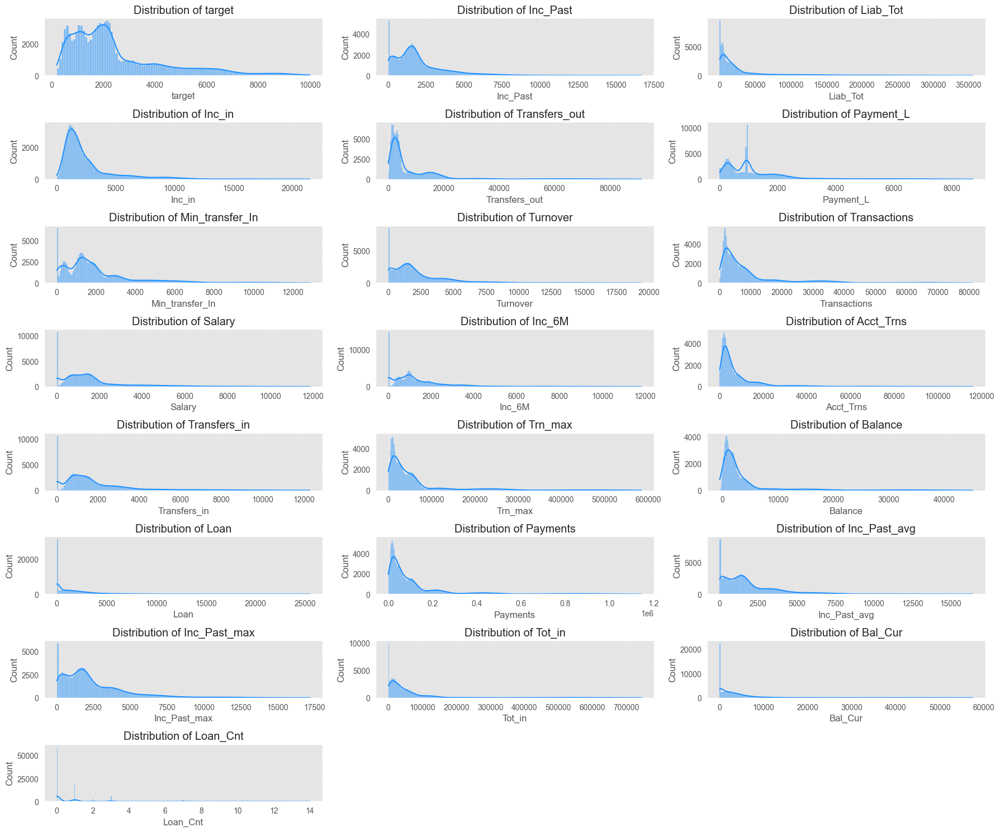

In [6]:
def plot_univariate_distributions(dataframe, n_cols=3, figsize=(18, 15)):
    """
    Plot the distribution of each variable in the dataset using subplots.

    Parameters
    ----------
    dataframe : pd.DataFrame
        The dataset containing the variables to visualize.
    n_cols : int, optional (default=3)
        Number of columns in the subplot grid.
    figsize : tuple, optional (default=(18, 15))
        Overall size of the figure (width, height) in inches.
    """
    # Set plot style
    plt.style.use('ggplot')

    # Calculate the number of rows needed
    n_rows = (len(dataframe.columns) + n_cols - 1) // n_cols

    # Create a grid of subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.flatten()  # Flatten to simplify iteration

    # Plot each column as a histogram with KDE
    for i, col in enumerate(dataframe.columns):
        sns.histplot(dataframe[col], kde=True, color='dodgerblue', ax=axes[i])
        axes[i].set_title(f"Distribution of {col}")
        axes[i].grid(True, linestyle='--', alpha=0.3)

    # Hide any unused subplots
    for j in range(len(dataframe.columns), len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# === Plot Univariate Distributions ===
plot_univariate_distributions(df)

The feature distributions reveal important characteristics that will influence our preprocessing and modeling approaches:

1. **Right-skewed distributions** are present across nearly all features, with varying degrees of severity:
  - Extremely skewed: `Liab_Tot`, `Trn_max`, `Payments`, `Tot_in`
  - Moderately skewed: `Inc_Past`, `Salary`, `Balance`, `Inc_Past_max`
  - Target variable shows right skew but less extreme than many features

2. **Zero-inflation** is common across multiple features:
  - Financial product features: `Loan`, `Loan_Cnt` (majority have no loans)
  - Income features: `Salary`, `Inc_Past`, `Inc_6M` (potentially unemployed or unreported income)
  - Transaction features: `Turnover`, `Min_transfer_In`, `Transfers_in`

3. **Interesting patterns**:
  - `Payment_L`: Bimodal with spike around 1000 (possible standard payment amount)
  - `Min_transfer_In`: Multi-peaked distribution suggesting different standard payment amounts
  - `Loan_Cnt`: Discrete values mostly 0-3 with outliers up to 14
  - `Target`: Main concentration in 1000-3000 range with long tail up to 10,000

These observations will guide our feature engineering approach, particularly for handling zeros, skewness, and outliers.

<a id="zeros-analysis"></a>
## 3.3 Zeros Analysis

**Exploring Zero Value Patterns**

This section investigates the presence of excessive zero values across many variables. The initial hypothesis was that these zeros might follow identifiable patterns or represent data entry errors or missing values in disguise.

However, after exploratory analysis, no systematic anomalies or replacement logic emerged. While some features contain a high proportion of zeros, there is insufficient business context or domain justification to assume these values are erroneous or should be imputed.

**Conclusion**: The zero values are treated as valid observations. No imputation or filtering is applied, as there is no strong evidence or domain rationale to justify altering them.


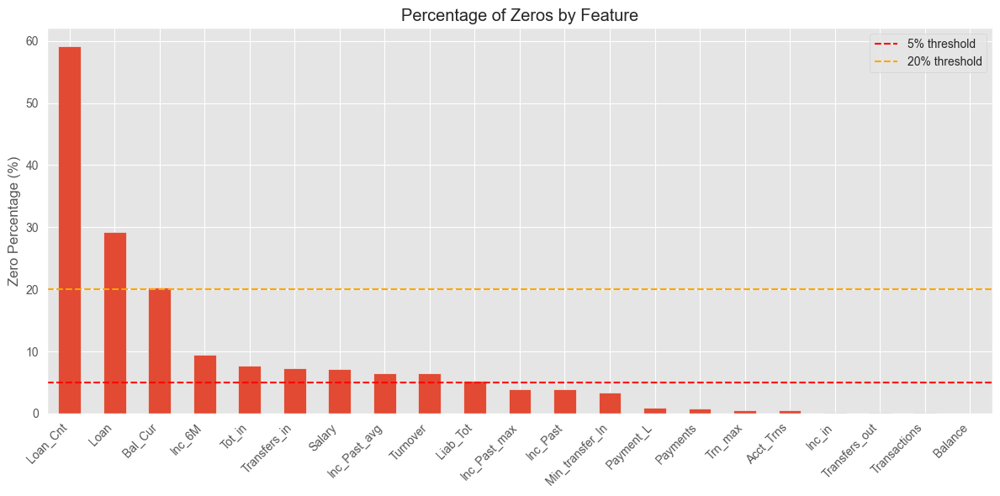

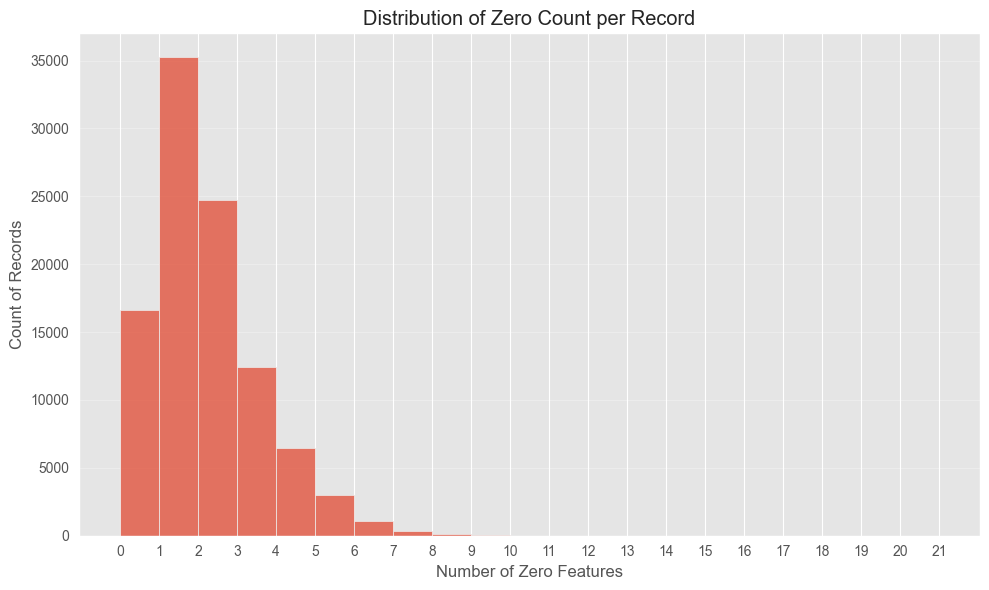

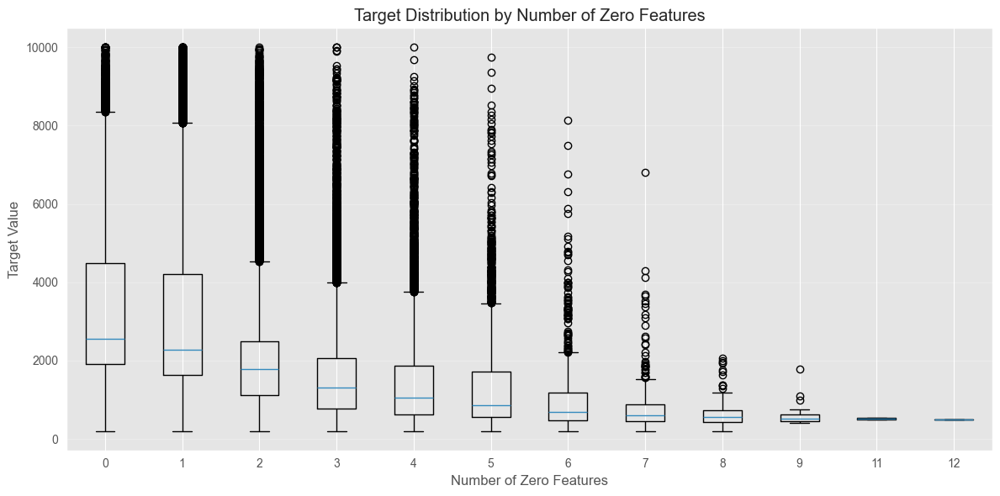

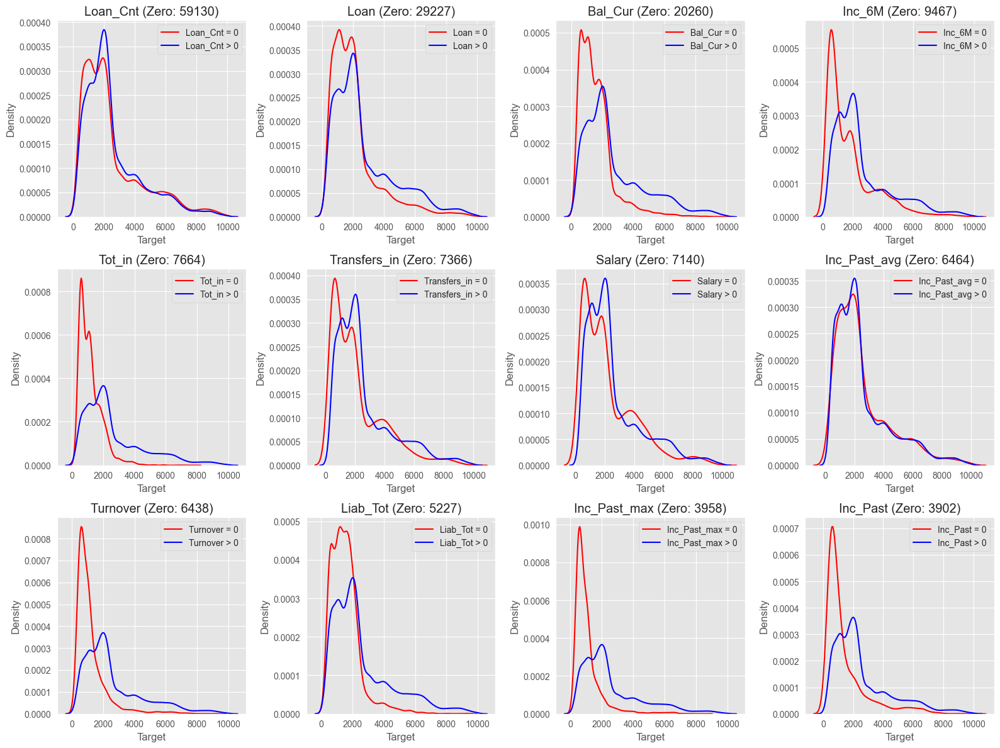

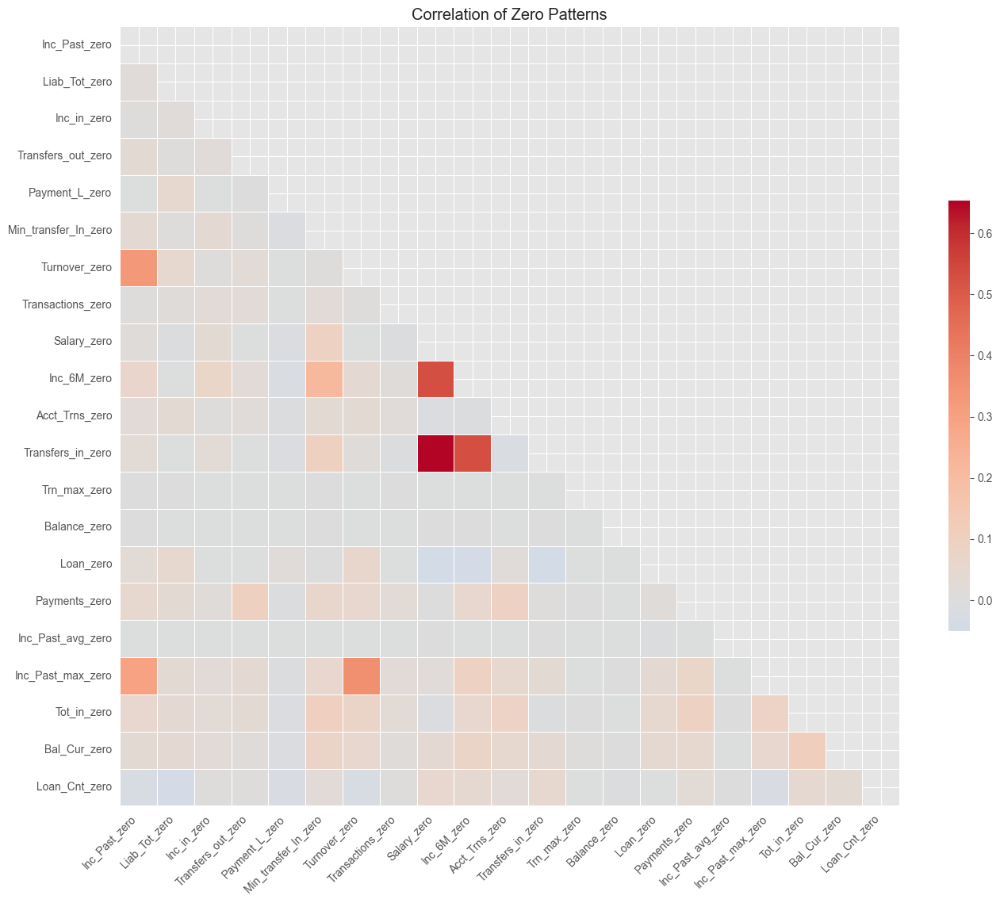

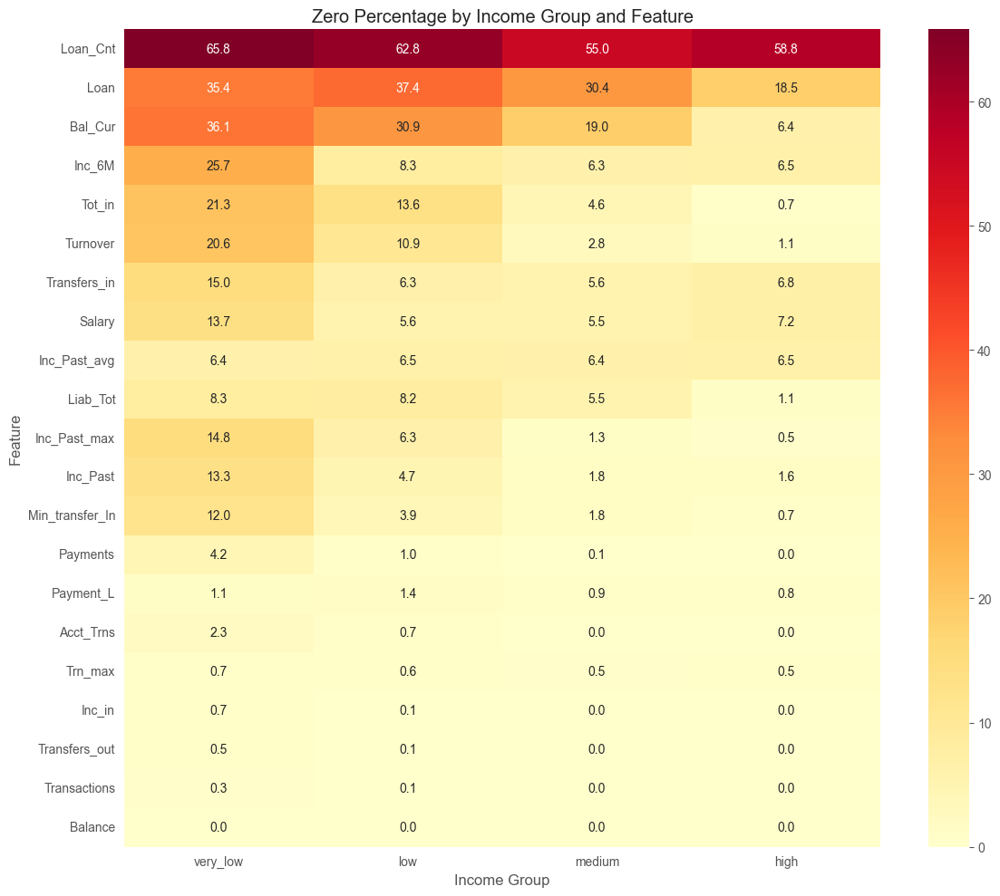

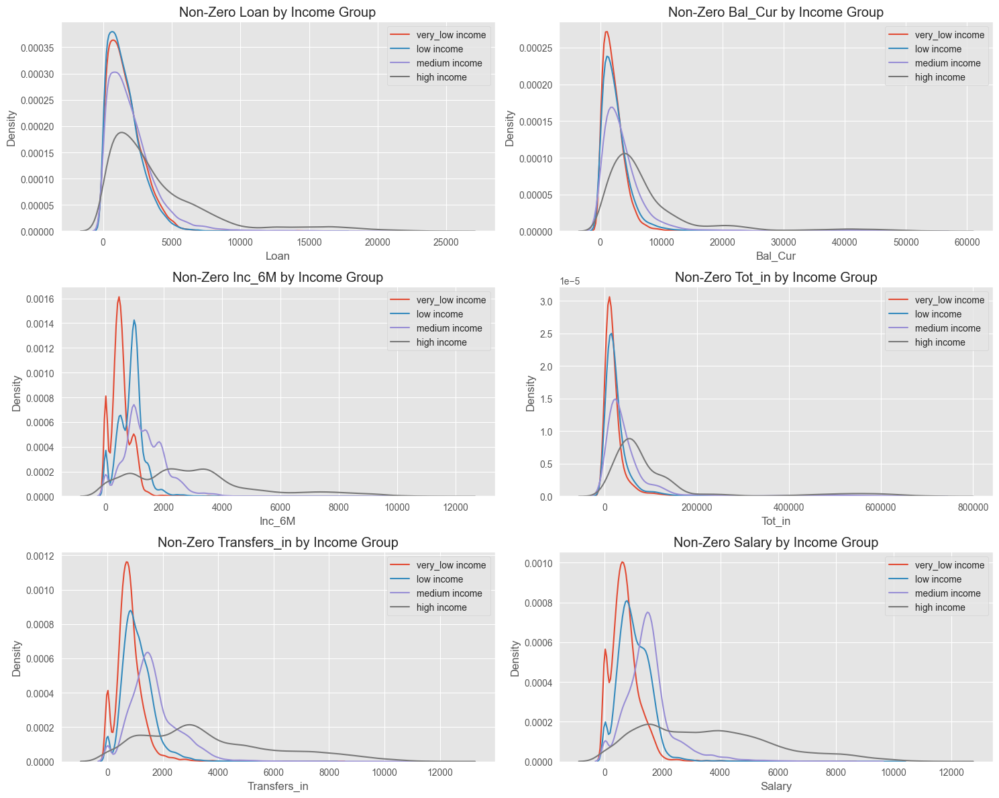

In [7]:
def analyze_zeros_eda(df, target_col='target'):
    """
    Perform a comprehensive exploratory data analysis on zero values in a dataset.

    Parameters
    ----------
    df : pandas.DataFrame
        The input dataset to analyze.
    target_col : str, default='target'
        The name of the target column to exclude from zero calculations.

    Returns
    -------
    dict
        Dictionary containing:
        - 'zero_percentages': Series of zero % per feature
        - 'feature_analysis': DataFrame comparing target stats for zero vs non-zero
        - 'income_zero_percentages': DataFrame of zero % by income group
        - 'non_zero_stats': Summary stats for non-zero values per income group
    """
    import matplotlib.pyplot as plt
    import seaborn as sns
    import numpy as np
    import pandas as pd

    # Split predictors and target
    X = df.drop(columns=[target_col])
    y = df[target_col]

    # --- 1. Basic Zero Statistics ---
    zero_percentages = (X == 0).mean() * 100

    plt.figure(figsize=(12, 6))
    zero_percentages.sort_values(ascending=False).plot(kind='bar')
    plt.title('Percentage of Zeros by Feature')
    plt.ylabel('Zero Percentage (%)')
    plt.xticks(rotation=45, ha='right')
    plt.axhline(y=5, color='r', linestyle='--', label='5% threshold')
    plt.axhline(y=20, color='orange', linestyle='--', label='20% threshold')
    plt.legend()
    plt.tight_layout()

    # --- 2. Zero Count Distribution ---
    zero_count = (X == 0).sum(axis=1)

    plt.figure(figsize=(10, 6))
    sns.histplot(zero_count, bins=range(0, X.shape[1] + 1), kde=False)
    plt.title('Distribution of Zero Count per Record')
    plt.xlabel('Number of Zero Features')
    plt.ylabel('Count of Records')
    plt.xticks(range(0, X.shape[1] + 1))
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()

    # --- 3. Target Distribution by Zero Count ---
    plt.figure(figsize=(12, 6))
    zero_count_values = zero_count.value_counts().sort_index().index
    data_to_plot = [y[zero_count == count] for count in zero_count_values]

    plt.boxplot(data_to_plot, tick_labels=zero_count_values)
    plt.title('Target Distribution by Number of Zero Features')
    plt.xlabel('Number of Zero Features')
    plt.ylabel('Target Value')
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()

    # --- 4. Feature-Specific Zero Analysis ---
    feature_zero_analysis = {}

    for col in X.columns:
        zero_mask = X[col] == 0
        if zero_mask.sum() > 0:
            target_zero = y[zero_mask]
            target_non_zero = y[~zero_mask]

            if len(target_zero) >= 10 and len(target_non_zero) >= 10:
                feature_zero_analysis[col] = {
                    'zero_count': zero_mask.sum(),
                    'zero_percentage': zero_mask.mean() * 100,
                    'target_mean_zero': target_zero.mean(),
                    'target_mean_non_zero': target_non_zero.mean(),
                    'target_median_zero': target_zero.median(),
                    'target_median_non_zero': target_non_zero.median(),
                    'target_ratio': target_zero.median() / target_non_zero.median()
                    if target_non_zero.median() != 0 else np.nan
                }

    feature_analysis_df = pd.DataFrame.from_dict(feature_zero_analysis, orient='index')
    feature_analysis_df = feature_analysis_df.sort_values('target_ratio')

    # --- 5. Target Distribution by Zero Status (Top Features) ---
    top_zero_features = zero_percentages.sort_values(ascending=False).head(12).index

    plt.figure(figsize=(16, 12))
    for i, feature in enumerate(top_zero_features):
        plt.subplot(3, 4, i + 1)
        zero_mask = X[feature] == 0

        sns.kdeplot(y[zero_mask], label=f"{feature} = 0", color='red')
        sns.kdeplot(y[~zero_mask], label=f"{feature} > 0", color='blue')

        plt.title(f"{feature} (Zero: {zero_mask.sum()})")
        plt.xlabel("Target")
        plt.legend()

    plt.tight_layout()

    # --- 6. Correlation of Zero Patterns ---
    zero_indicators = pd.DataFrame(index=X.index)

    for col in X.columns:
        zero_indicators[f"{col}_zero"] = (X[col] == 0).astype(int)

    zero_corr = zero_indicators.corr()

    plt.figure(figsize=(14, 12))
    mask = np.triu(np.ones_like(zero_corr, dtype=bool))
    sns.heatmap(zero_corr, mask=mask, cmap='coolwarm', center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=False)
    plt.title('Correlation of Zero Patterns')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()

    # --- 7. Income Stratified Zero Analysis ---
    income_bins = [0, 800, 1500, 3000, float('inf')]
    income_labels = ['very_low', 'low', 'medium', 'high']

    df_with_income = df.copy()
    df_with_income['income_group'] = pd.cut(df_with_income[target_col], bins=income_bins, labels=income_labels)

    income_zero_percentages = {}

    for col in X.columns:
        income_zero_percentages[col] = {}
        for group in income_labels:
            group_mask = df_with_income['income_group'] == group
            if group_mask.sum() > 0:
                zero_pct = (df_with_income.loc[group_mask, col] == 0).mean() * 100
                income_zero_percentages[col][group] = zero_pct

    income_zero_df = pd.DataFrame(income_zero_percentages).transpose()
    sorted_features = income_zero_df.mean(axis=1).sort_values(ascending=False).index
    income_zero_df_sorted = income_zero_df.loc[sorted_features]

    plt.figure(figsize=(12, 10))
    sns.heatmap(income_zero_df_sorted, annot=True, fmt='.1f', cmap='YlOrRd')
    plt.title('Zero Percentage by Income Group and Feature')
    plt.xlabel('Income Group')
    plt.ylabel('Feature')
    plt.tight_layout()

    # --- 8. Non-Zero Value Distribution by Income Group ---
    moderate_zero_features = zero_percentages[(zero_percentages > 5) & (zero_percentages < 40)] \
        .sort_values(ascending=False).head(6).index

    plt.figure(figsize=(15, 12))
    for i, feature in enumerate(moderate_zero_features):
        plt.subplot(3, 2, i + 1)
        for group in income_labels:
            group_mask = (df_with_income['income_group'] == group) & (df_with_income[feature] > 0)
            if group_mask.sum() > 10:
                sns.kdeplot(df_with_income.loc[group_mask, feature], label=f"{group} income")

        plt.title(f"Non-Zero {feature} by Income Group")
        plt.xlabel(feature)
        plt.legend()

    plt.tight_layout()

    # --- 9. Summary Statistics for Non-Zero Values by Income Group ---
    non_zero_stats = {}

    for feature in X.columns:
        non_zero_stats[feature] = {}
        for group in income_labels:
            group_mask = (df_with_income['income_group'] == group) & (df_with_income[feature] > 0)
            if group_mask.sum() >= 10:
                non_zero_stats[feature][f"{group}_median"] = df_with_income.loc[group_mask, feature].median()
                non_zero_stats[feature][f"{group}_mean"] = df_with_income.loc[group_mask, feature].mean()
                non_zero_stats[feature][f"{group}_p10"] = df_with_income.loc[group_mask, feature].quantile(0.1)

    non_zero_stats_df = pd.DataFrame.from_dict(non_zero_stats, orient='index')

    return {
        'zero_percentages': zero_percentages,
        'feature_analysis': feature_analysis_df,
        'income_zero_percentages': income_zero_df_sorted,
        'non_zero_stats': non_zero_stats_df
    }

# Run the analysis
results = analyze_zeros_eda(df, target_col='target')

The exploratory analysis of zero values revealed notable patterns in the dataset. However, based on domain feedback and the lack of strong business justification, **no zero-specific preprocessing was applied**. Zeros were treated as legitimate observations rather than missing or invalid data.

**Key observations from zero value analysis:**

1. **Prevalence of Zero Values**
   - A few features exhibit high rates of zero values:
     - `Loan_Cnt` (59.1%): Indicates most customers have no active loans
     - `Loan` (29.2%): Nearly one-third show no outstanding loan amount
     - `Bal_Cur` (20.3%): A sizable share has zero current account balance
   - These values likely reflect valid financial statuses rather than data errors.

2. **Association with Income**
   - Records with more zero-valued features generally correspond to lower income levels:
     - 0 zeros → median income = 2,548
     - 3 zeros → median income = 1,306
     - 6+ zeros → median income < 700
   - Suggests that zeros may capture reduced financial activity typical of low-income segments.

3. **Income Group Differences**
   - Zero distributions vary systematically across income brackets:
     - Very low income group has more zeros across nearly all financial indicators
     - Features like `Inc_in`, `Transfers_out`, and `Transactions` have very few zeros in medium/high income groups
     - The share of zero values in `Loan` steadily declines as income rises (from 35.4% to 18.5%)

4. **Inter-feature Correlations**
   - Some zero patterns are highly correlated:
     - `Inc_6M` and `Transfers_in` zeros often co-occur
     - `Turnover` and `Inc_Past` zeros are similarly aligned

**Interpretation and Decision**
- These patterns suggest that zeros reflect **meaningful financial behavior** rather than data quality issues.
- Given the absence of business-driven imputation rules or classification logic for zeros, they were retained **as-is** in the modeling process.
- This decision supports transparency and avoids injecting artificial assumptions into the data.

No synthetic replacement or binary flagging was used; all models built later will operate directly on the original feature distributions.


<a id="multivariate-analysis"></a>
## 3.4 Multivariate Analysis

<a id="correlation-matrix"></a>
### 3.4.1 Correlation Matrix

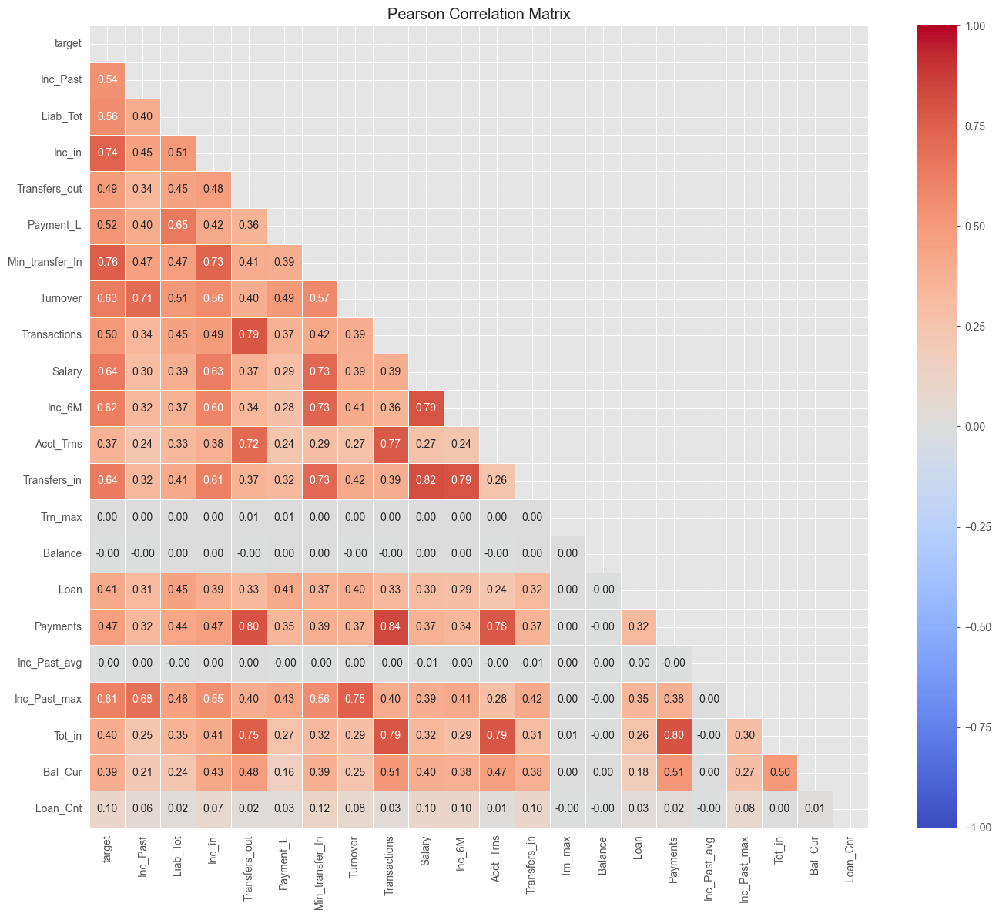

In [8]:
def plot_correlation_matrix(dataframe, method='pearson', figsize=(14, 12)):
    """
    Plot a correlation matrix heatmap for numerical variables in the dataset.

    Parameters
    ----------
    dataframe : pandas.DataFrame
        The dataset containing numerical variables.
    method : str, default='pearson'
        The correlation method to use: 'pearson', 'spearman', or 'kendall'.
    figsize : tuple, default=(14, 12)
        Size of the figure to display (width, height).

    Returns
    -------
    pandas.DataFrame
        The correlation matrix computed using the selected method.
    """
    # Compute the correlation matrix
    corr_matrix = dataframe.corr(method=method)

    # Mask the upper triangle for better readability
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

    # Plot heatmap
    plt.figure(figsize=figsize)
    sns.heatmap(
        corr_matrix,
        mask=mask,
        cmap='coolwarm',
        annot=True,
        fmt='.2f',
        linewidths=0.5,
        vmin=-1,
        vmax=1
    )
    plt.title(f'{method.capitalize()} Correlation Matrix')
    plt.tight_layout()
    plt.show()

    return corr_matrix

# Plot and retrieve the correlation matrix
correlation_matrix = plot_correlation_matrix(df)

The correlation matrix reveals important relationships between features:

1. **Strongest Target Correlations**:
  - `Min_transfer_In` (0.76) and `Inc_in` (0.74): Income-related features show strongest correlation with the target
  - `Salary` (0.64), `Transfers_in` (0.64), and `Inc_6M` (0.62): Also strong predictors
  - `Loan_Cnt` (0.10): Very weak correlation with target

2. **Feature Relationships**:
  - `Transfers_out` and `Transactions` (0.79): Strong correlation between transaction-related features
  - `Salary` and `Inc_6M` (0.79): High correlation between income indicators
  - `Payments` and `Transactions` (0.84): Payment activity strongly related to transaction count
  - `Transfers_in` and `Salary` (0.82): Strong relationship between incoming transfers and salary

3. **Feature Groups**:
  - Transaction metrics form a correlated cluster
  - Income metrics show moderate to strong correlations with each other
  - Loan-related features have weaker correlations overall

The matrix highlights not very high but potential multicollinearity issues and confirms the importance of income and transaction features for prediction.

<a id="feature-target-correlations"></a>
### 3.4.2 Feature Correlations with Target

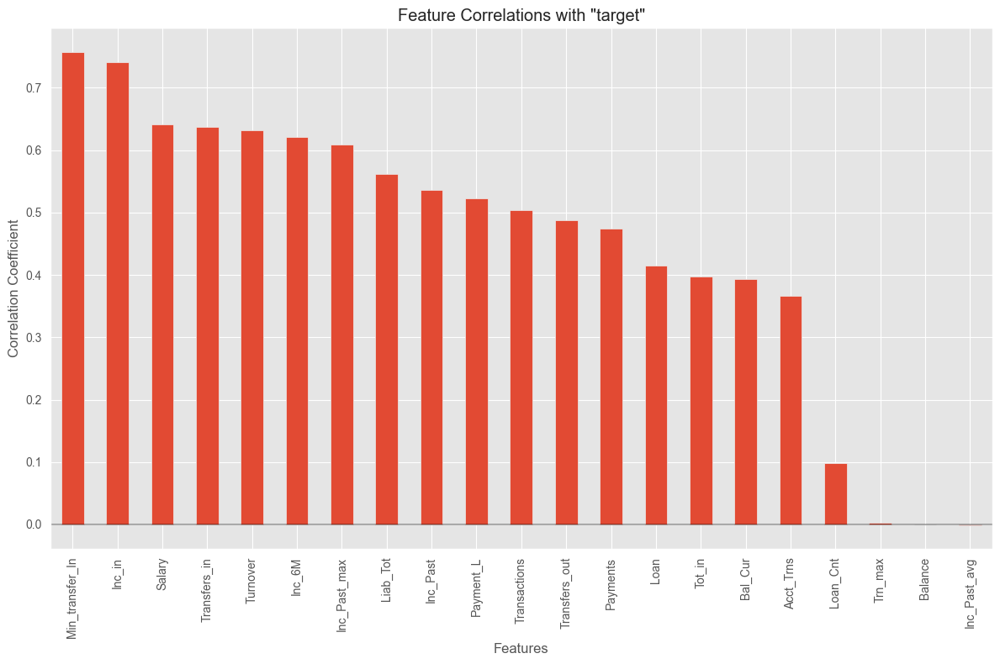

In [9]:
def plot_target_correlations(dataframe, target_col='target'):
    """
    Plot the correlation of all features with the target variable.

    Parameters
    ----------
    dataframe : pandas.DataFrame
        The dataset containing the features and target variable.
    target_col : str, default='target'
        The name of the target column.

    Returns
    -------
    pandas.Series
        A sorted series of feature correlations with the target variable.
    """
    # Compute correlation of all features with the target
    target_corrs = dataframe.corr()[target_col].sort_values(ascending=False)

    # Plot feature correlations excluding the target itself
    plt.figure(figsize=(12, 8))
    target_corrs.drop(target_col).plot(kind='bar')

    plt.title(f'Feature Correlations with "{target_col}"')
    plt.xlabel('Features')
    plt.ylabel('Correlation Coefficient')
    plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
    plt.tight_layout()
    plt.show()

    return target_corrs

# Plot and return target correlations
target_correlations = plot_target_correlations(df)

The bar chart highlights the features most predictive of the target income variable:

1. **Top Predictors** (r > 0.7):
  - `Min_transfer_In` (0.76): Minimum incoming transfer amount
  - `Inc_in` (0.74): Income inflow

2. **Strong Predictors** (0.6 < r < 0.7):
  - `Salary` (0.64)
  - `Transfers_in` (0.64)
  - `Turnover` (0.63)
  - `Inc_6M` (0.62)
  - `Inc_Past_max` (0.61)

3. **Moderate Predictors** (0.4 < r < 0.6):
  - `Liab_Tot` (0.56)
  - `Inc_Past` (0.54)
  - `Payment_L` (0.52)
  - `Transactions` (0.50)
  - Several others...

4. **Weak Predictors** (r < 0.4):
  - `Acct_Trns` (0.37)
  - `Loan_Cnt` (0.10)
  - `Trn_max`, `Balance`, `Inc_Past_avg` (near zero)

This ranking will guide importance analysis in our modeling phase, with particular attention to the top and strong predictors.

<a id="pairwise-relationships"></a>
### 3.4.3 Pairwise Relationships

Using a random sample of 1000 observations for the pairplot


<Figure size 1500x1500 with 0 Axes>

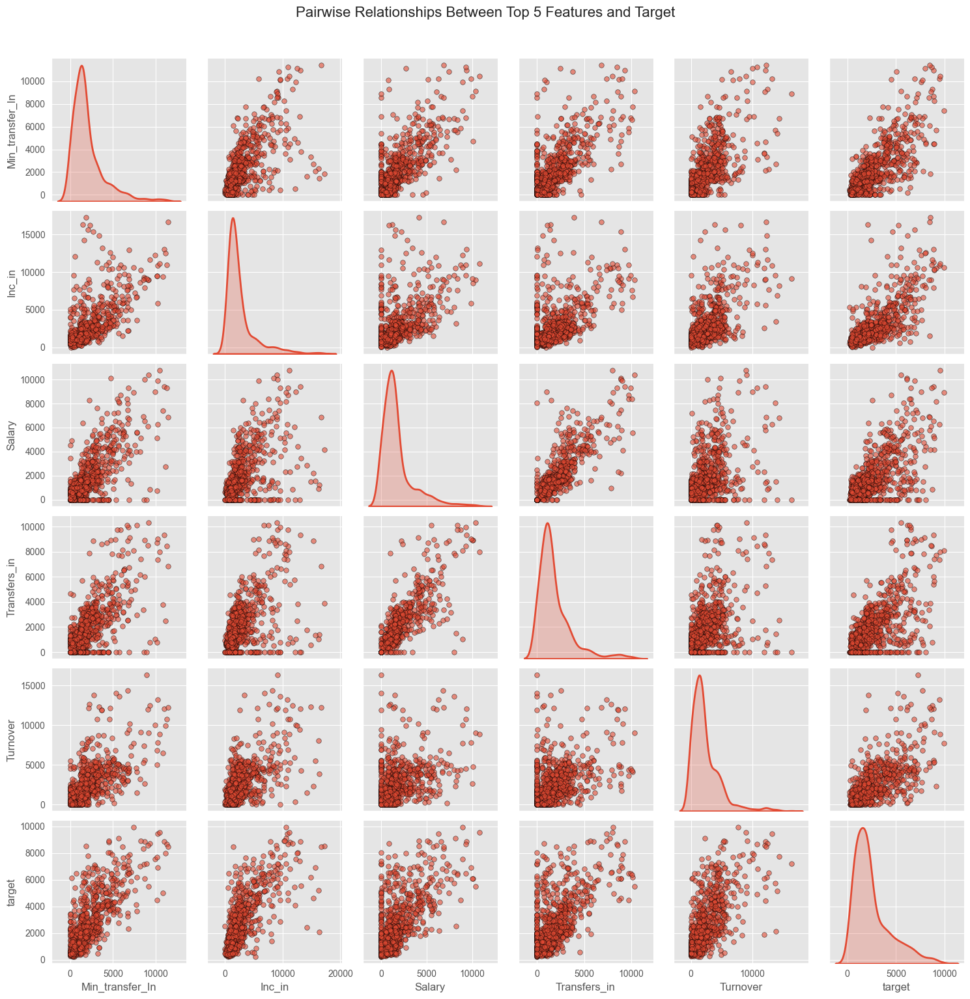


Correlation of selected features with target:
Min_transfer_In: 0.7578
Inc_in: 0.7404
Salary: 0.6406
Transfers_in: 0.6373
Turnover: 0.6315


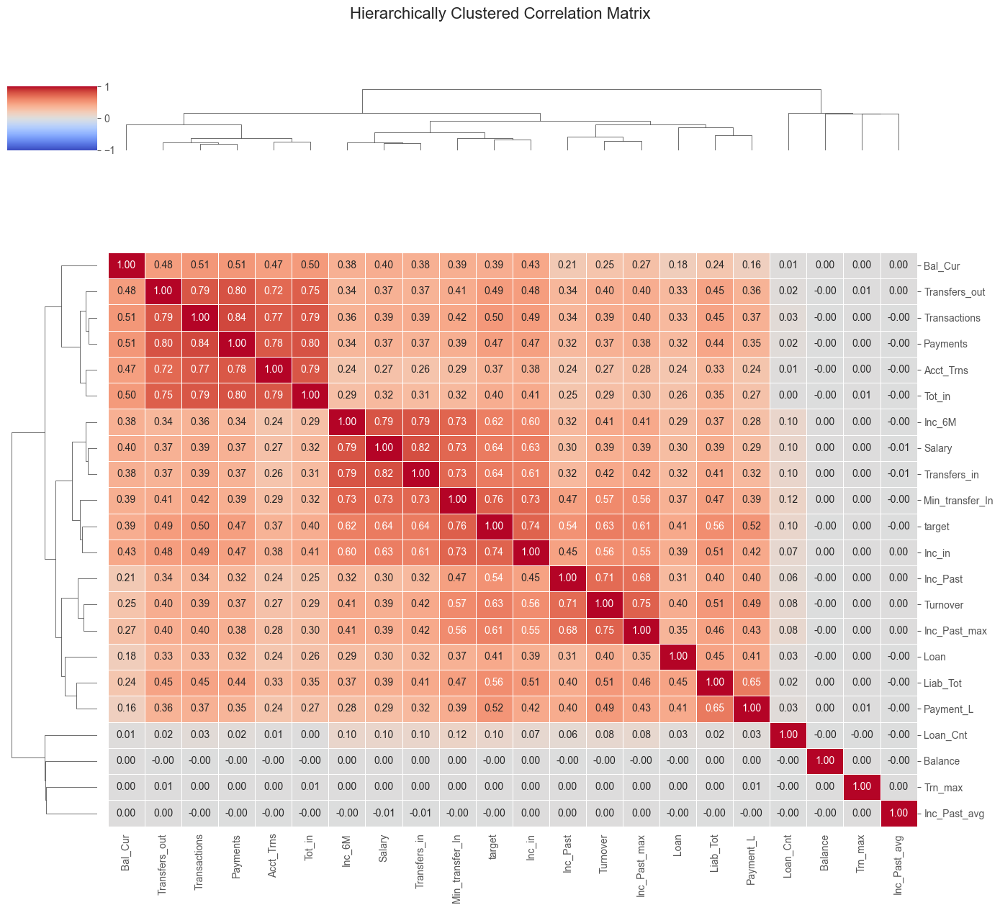

In [10]:
def plot_focused_pairwise_relationships(dataframe, target_col='target', n_features=5, sample_size=1000):
    """
    Plot a pairplot for the top correlated features with the target to reveal pairwise relationships.

    Parameters
    ----------
    dataframe : pandas.DataFrame
        The input dataset.
    target_col : str, default='target'
        Name of the target column.
    n_features : int, default=5
        Number of top features to include (based on absolute correlation with the target).
    sample_size : int, default=1000
        Maximum number of samples to plot to avoid clutter in large datasets.

    Returns
    -------
    None
    """
    # Compute absolute correlations with the target and select top features (excluding target itself)
    correlations = dataframe.corr()[target_col].abs().sort_values(ascending=False)
    top_features = correlations[1:n_features + 1].index.tolist()
    selected_columns = top_features + [target_col]

    # Sample the data if it's too large
    if len(dataframe) > sample_size:
        sample_df = dataframe[selected_columns].sample(sample_size, random_state= RANDOM_STATE)
        print(f"Using a random sample of {sample_size} observations for the pairplot")
    else:
        sample_df = dataframe[selected_columns]

    # Define figure size
    figsize = (n_features * 3, n_features * 3)

    # Generate the pairplot
    plt.figure(figsize=figsize)
    pairplot = sns.pairplot(
        sample_df,
        diag_kind="kde",
        plot_kws={'alpha': 0.6, 's': 30, 'edgecolor': 'k', 'linewidth': 0.5},
        diag_kws={'linewidth': 2}
    )
    pairplot.fig.suptitle(
        f"Pairwise Relationships Between Top {n_features} Features and Target",
        y=1.02, fontsize=16
    )
    plt.tight_layout()
    plt.show()

    # Display correlation context
    print("\nCorrelation of selected features with target:")
    for feature in top_features:
        print(f"{feature}: {correlations[feature]:.4f}")


def plot_clustered_correlations(dataframe, figsize=(14, 12)):
    """
    Plot a heatmap with hierarchical clustering on the correlation matrix.

    Parameters
    ----------
    dataframe : pandas.DataFrame
        The input dataset containing numerical variables.
    figsize : tuple, default=(14, 12)
        Size of the figure (width, height) in inches.

    Returns
    -------
    sns.matrix.ClusterGrid
        The seaborn ClusterGrid object (for further customization if needed).
    """
    # Compute the correlation matrix
    corr_matrix = dataframe.corr()

    # Plot the clustered heatmap
    clustergrid = sns.clustermap(
        corr_matrix,
        cmap='coolwarm',
        annot=True,
        fmt='.2f',
        linewidths=0.5,
        vmin=-1,
        vmax=1,
        figsize=figsize,
        dendrogram_ratio=0.1,
        cbar_pos=(0.02, 0.8, 0.05, 0.18)
    )
    clustergrid.fig.suptitle("Hierarchically Clustered Correlation Matrix", fontsize=16, y=1.05)
    plt.tight_layout()
    plt.show()

    return clustergrid


# Execute the visualizations
plot_focused_pairwise_relationships(df, n_features=5)
clustergrid = plot_clustered_correlations(df)

The pairwise analysis reveals several important patterns in our dataset:

1. **Feature-Target Relationships**:
  - All top 5 features show positive correlations with the target with non-linear patterns
  - `Min_transfer_In` displays a distinctive triangular pattern, suggesting it may establish a lower bound on income
  - Income features (Inc_in, Salary, Transfers_in) exhibit similar patterns with the target, indicating they capture related aspects of financial status

2. **Distribution Characteristics**:
  - All variables show right-skewed distributions in the diagonal KDE plots
  - Higher concentration of points at lower values creates density clusters
  - More scatter at higher values indicates increased variability for higher-income individuals

3. **Feature Clusters**:
  - The hierarchical clustering identifies natural groupings:
    - Transaction-related cluster (Transfers_out, Transactions, Payments)
    - Income-related cluster (Inc_6M, Salary, Transfers_in)
    - Liability-related cluster (Liab_Tot, Payment_L)
  - Target variable clusters with income metrics, confirming its nature as an income measure

4. **Correlation Structure**:
  - Strongest correlations (0.76-0.82) occur within similar feature types
  - Near-zero correlations for several features (Balance, Trn_max, Inc_Past_avg)
  - Target placement in the dendrogram confirms income metrics as most predictive

These relationships suggest modeling approaches that account for non-linear patterns and leverage the natural feature groupings identified in the hierarchical clustering.

<a id="pca"></a>
### 3.4.4 Principal Component Analysis (PCA)

PCA analysis using 69091 complete rows (dropped 30909 rows with missing values)


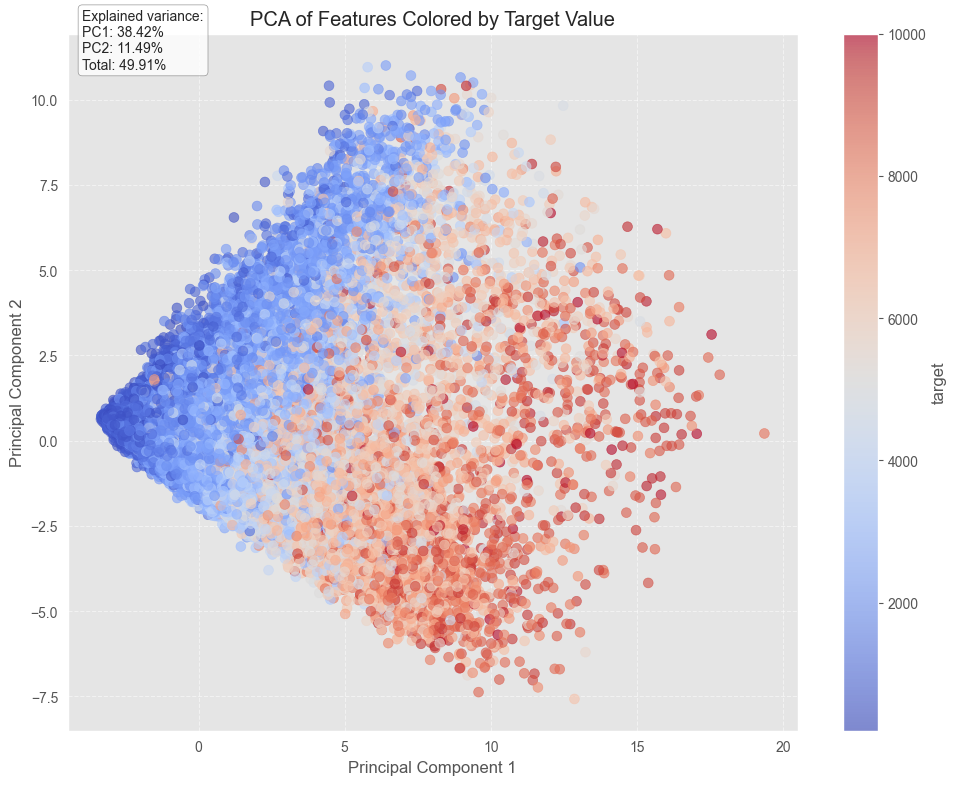


Top feature contributions to PC1:
Inc_in             0.276859
Transactions       0.274757
Min_transfer_In    0.273206
Payments           0.268654
Transfers_out      0.267592
Transfers_in       0.251539
Salary             0.248982
Turnover           0.244975
Tot_in             0.243196
Inc_6M             0.242109
Name: PC1, dtype: float64

Top feature contributions to PC2:
Acct_Trns          0.392490
Tot_in             0.379370
Payments           0.336234
Transactions       0.306295
Transfers_out      0.295144
Min_transfer_In    0.251028
Inc_6M             0.245302
Transfers_in       0.235729
Salary             0.221884
Turnover           0.198653
Name: PC2, dtype: float64


In [11]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

def perform_pca_analysis(dataframe, target_col='target', n_components=2):
    """
    Perform Principal Component Analysis (PCA) and visualize the first two components.

    Parameters
    ----------
    dataframe : pandas.DataFrame
        Input dataset containing features and target.
    target_col : str, default='target'
        Name of the target column to exclude from PCA.
    n_components : int, default=2
        Number of principal components to extract.

    Returns
    -------
    tuple
        - pca_result : ndarray
            The PCA-transformed feature matrix.
        - pca : sklearn.decomposition.PCA
            The trained PCA model object.
    """
    # --- Step 1: Exclude target and handle missing values ---
    features = dataframe.drop(columns=[target_col])
    temp_df = features.copy()
    temp_df[target_col] = dataframe[target_col]
    temp_df = temp_df.dropna()

    print(f"PCA analysis using {len(temp_df)} complete rows "
          f"(dropped {len(dataframe) - len(temp_df)} rows with missing values)")

    # --- Step 2: Scale features ---
    scaler = StandardScaler()
    scaled = scaler.fit_transform(temp_df.drop(columns=[target_col]))

    # --- Step 3: Apply PCA ---
    pca = PCA(n_components=n_components)
    pca_result = pca.fit_transform(scaled)

    # --- Step 4: Plot PCA result ---
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(
        pca_result[:, 0],
        pca_result[:, 1],
        c=temp_df[target_col],
        cmap='coolwarm',
        alpha=0.6,
        s=50
    )
    cbar = plt.colorbar(scatter)
    cbar.set_label(target_col)

    # Annotate with explained variance
    explained_var = pca.explained_variance_ratio_
    plt.annotate(
        f"Explained variance:\n"
        f"PC1: {explained_var[0]:.2%}\n"
        f"PC2: {explained_var[1]:.2%}\n"
        f"Total: {sum(explained_var):.2%}",
        xy=(0.02, 0.95),
        xycoords='axes fraction',
        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8)
    )

    plt.title("PCA of Features Colored by Target Value")
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

    # --- Step 5: Show feature contributions to components ---
    component_df = pd.DataFrame(
        pca.components_.T,
        columns=[f'PC{i + 1}' for i in range(n_components)],
        index=features.columns
    )

    print("\nTop feature contributions to PC1:")
    print(component_df['PC1'].abs().sort_values(ascending=False).head(10))

    print("\nTop feature contributions to PC2:")
    print(component_df['PC2'].abs().sort_values(ascending=False).head(10))

    return pca_result, pca

# Run PCA analysis
pca_result, pca_model = perform_pca_analysis(df)

The PCA visualization reveals clear structure in the data and strong relationships with income:

1. **Variance Explained**: The first two principal components explain nearly 50% of the total variance:
  - PC1: 38.42% of variance
  - PC2: 11.49% of variance
  - This suggests substantial correlation structure in the dataset

2. **Income Gradient**: There is a clear diagonal gradient of target values:
  - Lower income individuals (blue) concentrated in the left region
  - Higher income individuals (red) spread across the right side
  - The progression from left to right primarily follows PC1

3. **Feature Contributions**:
  - **PC1**: Primarily driven by transaction and income variables:
    - Inc_in (0.28), Transactions (0.27), Min_transfer_In (0.27)
    - Represents overall financial activity level
  - **PC2**: Heavily influenced by account activity metrics:
    - Acct_Trns (0.39), Tot_in (0.38), Payments (0.34)
    - May represent types of financial behavior (saving vs. spending)

4. **Data Structure**: The triangular shape of the scatter plot suggests:
  - Increased variability in financial patterns as income rises
  - Multiple pathways to higher income
  - Potential subgroups within income bands

This dimensional reduction confirms the presence of strong predictive structure in the data and provides a foundation for modeling approaches.

<a id="data-preparation"></a>
# 4. Data Preparation

The data preparation phase transforms the raw dataset into a format suitable for modeling, addressing missing values, creating meaningful features, and handling outliers identified in earlier analysis.

<a id="data-loading"></a>
## 4.1 Data Loading

This section imports the necessary libraries for data processing and loads our income dataset.

In [12]:
# === Import Required Libraries ===
import os
from pathlib import Path
from typing import List

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline

# === Set Global Visualization Styles ===
sns.set_style("whitegrid")
plt.rcParams["figure.figsize"] = (10, 6)

# === Define Path to Dataset ===
data_path = Path("..") / "data" / "raw" / "income_data.xlsx"

# === Load Dataset ===
df = load_income_data(data_path)  # Assumes load_income_data is already defined

In [13]:
df.head()

,target,Inc_Past,Liab_Tot,Inc_in,Transfers_out,Payment_L,Min_transfer_In,Turnover,Transactions,Salary,...,Transfers_in,Trn_max,Balance,Loan,Payments,Inc_Past_avg,Inc_Past_max,Tot_in,Bal_Cur,Loan_Cnt
0,2181,2777.195785,44602.771367,2653.0275,4403.502844,1376.27,2665.9753,2034.681741,4791.205440,1818,...,2531,50122.787705,3340.0,739.314898,60467.242121,0.000000,1676.276897,43645.292490,2335.885221,0.0
1,2234,2990.621878,69743.054007,2846.3787,14301.294615,1273.84,757.6630,4533.526273,26399.439740,528,...,788,29988.399052,1109.0,3470.616261,314169.073224,3705.778804,8561.789769,194165.567817,9558.020208,0.0
2,550,0.000000,10204.333221,650.8682,1091.498280,378.60,0.0000,636.005285,634.152829,264,...,369,117251.845035,4226.0,0.000000,0.000000,1653.192006,0.000000,0.000000,0.000000,0.0
3,1998,5054.195547,26858.856944,2163.8332,6881.157648,1823.42,1910.0083,5390.744004,6555.062441,1490,...,821,31746.542498,668.0,0.000000,127750.487939,1613.766044,450.630630,119729.437108,4571.733008,7.0
4,1493,2308.910985,6290.469562,1072.9084,1907.841516,933.49,1052.4194,1288.780352,2222.979571,1564,...,1409,229239.551743,943.0,2911.261656,22783.555228,1241.377471,2630.575931,18645.055929,1969.973314,0.0


<a id="preprocessing-strategy"></a>
## 4.2 Preprocessing Strategy

The preprocessing pipeline focuses on three core transformations that directly impact model performance while preserving data integrity and interpretability. These steps were selected after empirical evaluation to balance effectiveness with simplicity and deployment feasibility.

**1. Missing Value Imputation**
- Method: **k-Nearest Neighbors (KNN)** imputation with *k=5*
- Motivation:
  - Preserves local structure and relationships in the data
  - Avoids oversimplification seen with mean/median imputation
  - Retains the full sample size without introducing synthetic bias
- Assumption: Missingness is **randomly distributed**, based on exploratory analysis

**2. Feature-Specific Outlier Treatment**
- Applied to features with extreme values that could distort model learning
- Strategy varies by distributional shape:
  - **IQR-based capping**: For features with long-tailed skewness
  - **Robust Z-score (MAD-based)**: For moderately skewed variables
  - **Percentile capping**: Used for business-critical features to limit impact of extreme values (e.g., top 1%)
- All thresholds are computed **feature-by-feature**, and capping is applied independently

**3. Domain-Driven Feature Generation**
- Derived financial ratios to capture borrower behavior and risk signals:
  - `Loan_to_Income`: Measures debt burden relative to income
  - `Balance_to_Liab`: Proxy for liquidity versus outstanding obligations
  - `Income_Growth`: Recent income trend (change over time)
  - `Income_to_Liability`: Indicates ability to service debt
- These features were selected in collaboration with domain experts and reflect meaningful relationships aligned with credit evaluation logic

This streamlined preprocessing pipeline provides a reliable foundation for supervised learning in financial settings while remaining interpretable, efficient, and regulation-friendly.


<a id="preprocessing-implementation"></a>
## 4.3 Implementation

The preprocessing pipeline is implemented using `scikit-learn`'s `Pipeline`.

**1. Outlier Strategy Map Configuration**
- Features are assigned to appropriate outlier handling strategies based on distribution shape:
  - **Extremely skewed features** (e.g., `Liab_Tot`, `Trn_max`, `Tot_in`, `Payments`) use aggressive **IQR-based capping** to reduce the influence of extreme upper tails.
  - **Moderately skewed features** are processed using the **modified Z-score method** (based on median and MAD), which is more robust than standard Z-scores.
  - **Business-critical variables** are capped at **conservative upper percentiles** (e.g., 99th percentile) to maintain integrity while limiting distortion.

**2. Missing Value Imputation**
- Missing values are filled using **k-Nearest Neighbors (k=5)** imputation.
- This preserves the multivariate relationships between features and avoids bias introduced by simplistic imputation strategies (like mean or median).

**3. Feature Generation**
- A set of **financial ratios** is engineered to capture borrower behavior and economic logic:
  - `Loan_to_Income`: Reflects debt burden relative to income
  - `Balance_to_Liab`: Proxy for liquidity versus liabilities
  - `Income_Growth`: Measures momentum in recent income changes
  - `Income_to_Liability`: Proxy for repayment capacity

**4. Additional (Disabled) Transformations**
The pipeline codebase includes configurable options for:
- **FinancialInconsistencyFilter**
- **EnhancedContextAwareZeroHandler**

> These transformations are **disabled in the final pipeline**

**Execution Results**
- The pipeline ran successfully across all datasets.
- Outlier treatment applied **feature-specific thresholds**, capping extreme values while preserving useful signal.
- KNN imputation produced **context-aware replacements** that align with local patterns in the data.
- Feature generation completed without introducing multicollinearity or redundancy.

This implementation delivers a streamlined yet powerful preprocessing foundation that supports both **predictive accuracy** and **regulatory interpretability**, making it suitable for use in sensitive financial modeling tasks.


In [14]:
# # === Zero Flagger ===
# class ZeroFlagger(BaseEstimator, TransformerMixin):
#     """
#     Creates binary flags for features with zero values.
    
#     Parameters:
#     -----------
#     zero_cols : List[str]
#         List of column names to check for zeros and create flags
#     """
#     def __init__(self, zero_cols: List[str]):
#         self.zero_cols = zero_cols
#         self.feature_names_in_ = None

#     def fit(self, X, y=None):
#         self.feature_names_in_ = X.columns.tolist() if isinstance(X, pd.DataFrame) else None
#         return self

#     def transform(self, X):
#         if isinstance(X, np.ndarray):
#             X = pd.DataFrame(X, columns=self.feature_names_in_)
#         X = X.copy()
#         for col in self.zero_cols:
#             if col in X.columns:
#                 X[f"{col}_zero"] = (X[col] == 0).astype(int)
#         return X


# === KNN Imputer Transformer ===

class KNNImputerTransformer(BaseEstimator, TransformerMixin):
    """
    Imputes missing values using K-Nearest Neighbors algorithm while preserving
    the pandas DataFrame structure.

    Parameters
    ----------
    n_neighbors : int, default=5
        Number of neighbors to use for imputation.
    """
    def __init__(self, n_neighbors=5):
        self.n_neighbors = n_neighbors
        self.imputer = KNNImputer(n_neighbors=n_neighbors)
        self.feature_names_in_ = None

    def fit(self, X, y=None):
        """
        Fits the KNNImputer to the input data.

        Parameters
        ----------
        X : pandas.DataFrame or array-like of shape (n_samples, n_features)
            Training data.

        y : array-like of shape (n_samples,), default=None
            Target values. Ignored.

        Returns
        -------
        self : object
            Returns the instance itself.
        """
        if isinstance(X, pd.DataFrame):
            self.feature_names_in_ = X.columns.tolist()
        self.imputer.fit(X)
        return self

    def transform(self, X):
        """
        Imputes missing values in X using the fitted KNNImputer.

        Parameters
        ----------
        X : pandas.DataFrame or array-like of shape (n_samples, n_features)
            Data to impute. If a numpy array, column names from the training
            data (if available) will be used in the output DataFrame.

        Returns
        -------
        X_imputed : pandas.DataFrame of shape (n_samples, n_features)
            The imputed data as a pandas DataFrame, preserving the original
            index and column names.
        """
        if isinstance(X, np.ndarray):
            X = pd.DataFrame(X, columns=self.feature_names_in_)
        X_imputed = self.imputer.transform(X)
        return pd.DataFrame(X_imputed, columns=self.feature_names_in_, index=X.index)

# === Financial Inconsistency Filter ===

class FinancialInconsistencyFilter(BaseEstimator, TransformerMixin):
    """
    Filters out training data rows exhibiting extreme financial inconsistencies
    based on predefined rules. Test data is passed through unchanged.

    Parameters
    ----------
    is_training : bool, default=True
        A flag indicating whether the transformer is being applied to training
        data. If False, no filtering will be performed.
    """
    def __init__(self, is_training=True):
        self.is_training = is_training
        self.feature_names_in_ = None
        self.n_filtered_rows_ = 0
        self.filtered_indices_ = []

    def fit(self, X, y=None):
        """
        Identifies financially inconsistent cases in the training data based on
        a set of heuristic rules involving financial ratios and the target variable.

        Parameters
        ----------
        X : pandas.DataFrame of shape (n_samples, n_features)
            Training data to be filtered.

        y : array-like of shape (n_samples,), default=None
            Target values corresponding to the training data. Used in the
            inconsistency rules.

        Returns
        -------
        self : object
            Returns the instance itself.
        """
        self.feature_names_in_ = X.columns.tolist()

        # Only apply filtering to training data
        if not self.is_training:
            return self

        # Store original data shape for reporting
        original_shape = X.shape

        # Calculate financial ratios for filtering
        data = X.copy()

        if y is not None:
            data['target'] = y

        if 'target' in data.columns:
            # Calculate all ratios
            if 'Inc_in' in data.columns:
                data['Inc_in_ratio'] = data['Inc_in'] / (data['target'] + 1)
            if 'Payments' in data.columns:
                data['Payments_ratio'] = data['Payments'] / (data['target'] + 1)
            if 'Inc_Past' in data.columns:
                data['Inc_Past_ratio'] = data['Inc_Past'] / (data['target'] + 1)
            if 'Transfers_out' in data.columns:
                data['Transfers_out_ratio'] = data['Transfers_out'] / (data['target'] + 1)
            if 'Turnover' in data.columns:
                data['Turnover_ratio'] = data['Turnover'] / (data['target'] + 1)
            if 'Liab_Tot' in data.columns:
                data['Liab_Tot_ratio'] = data['Liab_Tot'] / (data['target'] + 1)

            # Identify inconsistent cases
            inconsistent_mask = (
                # === Existing Rules ===

                # Rule 1: Extreme Inc_in vs. target
                (data.get('Inc_in_ratio', pd.Series([0])) > 15) |

                # Rule 2: Extreme Payments vs. target
                (data.get('Payments_ratio', pd.Series([0])) > 300) |

                # Rule 3: Extreme Transfers_out vs. target
                (data.get('Transfers_out_ratio', pd.Series([0])) > 40) |

                # Rule 4: Multiple moderate income inconsistencies
                ((data.get('Inc_in_ratio', pd.Series([0])) > 5) &
                 (data.get('Inc_Past_ratio', pd.Series([0])) > 5) &
                 (data['target'] < 500)) |

                # Rule 5: High liabilities with low income
                ((data.get('Liab_Tot_ratio', pd.Series([0])) > 100) & (data['target'] < 500)) |

                # Rule 6: Past income too high for current low income
                ((data.get('Inc_Past_ratio', pd.Series([0])) > 15) & (data['target'] < 1000)) |

                # Rule 7: High incoming inflow & turnover, but low target
                ((data.get('Inc_in_ratio', pd.Series([0])) > 10) &
                 (data.get('Turnover_ratio', pd.Series([0])) > 10) &
                 (data['target'] < 800)) |

                # === New Rules ===

                # Rule 8: Payments disproportionately high compared to target
                (((data['Payments'] / (data['target'] + 1)) > 40) & (data['target'] < 800)) |

                # Rule 9: Total liabilities + payments highly disproportionate to target
                (((data['Liab_Tot'] + data['Payments']) / (data['target'] + 1)) > 150) & (data['target'] < 500)
            )


            # Store the indices of filtered rows for reporting
            self.filtered_indices_ = list(data[inconsistent_mask].index)
            self.n_filtered_rows_ = len(self.filtered_indices_)

            # Report filtering results
            if self.n_filtered_rows_ > 0:
                filter_percent = (self.n_filtered_rows_ / len(data)) * 100
                print(f"Financial inconsistency filter: Removed {self.n_filtered_rows_} rows ({filter_percent:.2f}%) from training data")

                # Analyze characteristics of filtered cases
                filtered_data = data[inconsistent_mask]
                if len(filtered_data) > 0:
                    print(f"  Average target value in filtered cases: {filtered_data['target'].mean():.2f}")

                    # Report top triggers
                    trigger_counts = {
                        "Inc_in_ratio > 15": (filtered_data.get('Inc_in_ratio', pd.Series(0)) > 15).sum(),
                        "Payments_ratio > 300": (filtered_data.get('Payments_ratio', pd.Series(0)) > 300).sum(),
                        "Transfers_out_ratio > 40": (filtered_data.get('Transfers_out_ratio', pd.Series(0)) > 40).sum(),
                        "Inc_in & Inc_Past > 5 with target < 500": (
                            ((filtered_data.get('Inc_in_ratio', pd.Series(0)) > 5) &
                            (filtered_data.get('Inc_Past_ratio', pd.Series(0)) > 5) &
                            (filtered_data['target'] < 500)).sum()
                        ),
                        "Liab_Tot_ratio > 100 with target < 500": (
                            ((filtered_data.get('Liab_Tot_ratio', pd.Series(0)) > 100) &
                            (filtered_data['target'] < 500)).sum()
                        ),
                        "Inc_Past_ratio > 15 with target < 1000": (
                            ((filtered_data.get('Inc_Past_ratio', pd.Series(0)) > 15) &
                            (filtered_data['target'] < 1000)).sum()
                        ),
                        "Inc_in_ratio > 10 and Turnover_ratio > 10 with target < 800": (
                            ((filtered_data.get('Inc_in_ratio', pd.Series(0)) > 10) &
                            (filtered_data.get('Turnover_ratio', pd.Series(0)) > 10) &
                            (filtered_data['target'] < 800)).sum()
                        ),
                        "Payments > 40x target & target < 800": (
                            ((filtered_data['Payments'] / (filtered_data['target'] + 1)) > 40).sum()
                        ),
                        "Liabilities + Payments > 150x target & target < 500": (
                            (((filtered_data['Liab_Tot'] + filtered_data['Payments']) / (filtered_data['target'] + 1)) > 150).sum()
                        )
                    }

                    top_triggers = sorted(trigger_counts.items(), key=lambda x: x[1], reverse=True)
                    top_triggers = [f"{k}: {v} cases" for k, v in top_triggers if v > 0]

                    if top_triggers:
                        print("  Top triggers: " + "; ".join(top_triggers[:5]))

        return self

    def transform(self, X):
        """
        Removes the identified financially inconsistent cases from the training data.
        Test data is returned without modification.

        Parameters
        ----------
        X : pandas.DataFrame of shape (n_samples, n_features)
            Data to be transformed.

        Returns
        -------
        X_filtered : pandas.DataFrame of shape (n_samples - n_filtered, n_features)
            Filtered data with inconsistent cases removed (only if applied to
            training data). If applied to test data, the original DataFrame is returned.
        """
        if not self.is_training:
            # Don't filter test data
            return X

        # Filter out inconsistent cases from training data
        if self.filtered_indices_:
            return X.drop(index=self.filtered_indices_)
        else:
            return X

    def get_feature_names_out(self, input_features=None):
        """
        Returns the output feature names.

        Parameters
        ----------
        input_features : list of str, default=None
            Input feature names.

        Returns
        -------
        feature_names_out : list of str
            The same as the input feature names, as this transformer does not
            change the set of features.
        """
        return self.feature_names_in_

# === EnhancedContextAwareZeroHandler Transformer ===

class EnhancedContextAwareZeroHandler(BaseEstimator, TransformerMixin):
    """
    Handles zero values in financial features based on their predefined
    categories and their relationship with the target variable.

    This transformer creates binary flags indicating the presence of zero
    values and replaces these zeros with meaningful, small non-zero values
    derived from the distribution of non-zero values within each feature category.

    Parameters
    ----------
    account_status_features : list of str
        Features where zero is a valid and meaningful state (e.g., 'account_open').
        Zeros in these features will be preserved.

    strong_target_impact_features : list of str
        Features where zero values are hypothesized to have a strong relationship
        with the target variable. Zeros will be flagged and replaced with 50%
        of the 10th percentile of the non-zero values per target quantile.

    moderate_target_impact_features : list of str
        Features where zero values are hypothesized to have a moderate relationship
        with the target variable. Zeros will be flagged and replaced with 20%
        of the 10th percentile of the non-zero values per target quantile.

    minimal_target_impact_features : list of str
        Features where zero values are hypothesized to have a minimal relationship
        with the target variable. Zeros will be flagged and replaced with a
        fixed small value (50.0).

    low_prevalence_features : list of str
        Features where zero values are very rare (<1% prevalence). Zeros will be
        replaced with a small constant value (1.0) without creating a flag.

    income_column : str, default=None
        Column name to use for stratification (if different from target).
        If None, the target variable will be used for stratification.

    n_quantiles : int, default=5
        Number of quantiles to use for target stratification when calculating
        replacement values for zeros.
    """
    def __init__(self,
                 account_status_features,
                 strong_target_impact_features,
                 moderate_target_impact_features,
                 minimal_target_impact_features,
                 low_prevalence_features,
                 income_column=None,
                 n_quantiles=5):
        self.account_status_features = account_status_features
        self.strong_target_impact_features = strong_target_impact_features
        self.moderate_target_impact_features = moderate_target_impact_features
        self.minimal_target_impact_features = minimal_target_impact_features
        self.low_prevalence_features = low_prevalence_features
        self.income_column = income_column
        self.n_quantiles = n_quantiles

        # Storage for fitted parameters
        self.minimums_ = {}
        self.feature_names_in_ = None

    def fit(self, X, y=None):
        """
        Computes the minimum replacement values for zero handling based on the
        distribution of non-zero values in the training data, stratified by
        target quantiles.

        Parameters
        ----------
        X : pandas.DataFrame of shape (n_samples, n_features)
            Training data to fit the transformer.

        y : array-like of shape (n_samples,), default=None
            Target values used for stratification when computing quantile-specific
            replacement values.

        Returns
        -------
        self : object
            Returns the instance itself.
        """
        # Store feature names
        self.feature_names_in_ = X.columns.tolist()
        self.minimums_ = {}

        # Use target for quantile stratification if provided
        if y is not None:
            # Create quantile bins from the target variable
            quantile_bins = pd.qcut(y, self.n_quantiles, labels=False, duplicates='drop')
            quantile_bins = quantile_bins.loc[X.index] 

            # Calculate per-quantile minimums for each feature category
            for feature_list, factor in [
                (self.strong_target_impact_features, 0.5),  # 50% of 10th percentile
                (self.moderate_target_impact_features, 0.2)  # 20% of 10th percentile
            ]:
                for feature in feature_list:
                    if feature in X.columns:
                        self.minimums_[feature] = {}
                        
                        # Calculate separate minimum for each target quantile
                        for q in range(self.n_quantiles):
                            # Get subset of data for this quantile
                            subset = X.loc[quantile_bins[quantile_bins == q].index]
                            
                            # Get non-zero values for this feature in this quantile
                            non_zero = subset[subset[feature] > 0][feature]
                            
                            # Calculate replacement value (minimum of 1.0)
                            if len(non_zero) > 0:
                                min_value = non_zero.quantile(0.1) * factor
                                value = max(min_value, 1.0)
                            else:
                                value = 1.0
                                
                            self.minimums_[feature][q] = value
        else:
            # Without target, use global calculation (fallback)
            for feature_list, factor in [
                (self.strong_target_impact_features, 0.5),
                (self.moderate_target_impact_features, 0.2)
            ]:
                for feature in feature_list:
                    if feature in X.columns:
                        # Get non-zero values for this feature
                        non_zero = X[X[feature] > 0][feature]
                        
                        # Calculate replacement value (minimum of 1.0)
                        if len(non_zero) > 0:
                            min_value = non_zero.quantile(0.1) * factor
                            value = max(min_value, 1.0)
                        else:
                            value = 1.0
                            
                        # Store as single quantile for compatibility
                        self.minimums_[feature] = {0: value}

        return self

    def transform(self, X, y=None):
        """
        Transforms the data by handling zero values based on the predefined
        feature categories and target quantiles. Creates binary flags for zero values 
        in relevant categories and replaces these zeros with the calculated 
        quantile-specific minimums or predefined constants.

        Parameters
        ----------
        X : pandas.DataFrame of shape (n_samples, n_features)
            Data to transform.

        y : array-like of shape (n_samples,), default=None
            Target values used to determine which quantile-specific replacement
            value to use for each sample.

        Returns
        -------
        X_transformed : pandas.DataFrame of shape (n_samples, n_features + n_flag_features)
            Transformed data with zero values handled. New binary flag columns
            are added for features in the strong, moderate, and minimal impact
            categories.
        """
        X_transformed = X.copy()

        # Create quantile bins if target is provided, otherwise use a single bin
        if y is not None and self.n_quantiles > 1:
            quantile_bins = pd.qcut(y, self.n_quantiles, labels=False, duplicates='drop')
            quantile_bins = quantile_bins.loc[X.index]
            quantile_bins.index = X.index
        else:
            # Default all rows to quantile 0 if no target provided
            quantile_bins = pd.Series([0] * len(X), index=X.index)

        # Create flags for zeros for relevant categories
        for feature in (
            self.strong_target_impact_features +
            self.moderate_target_impact_features +
            self.minimal_target_impact_features
        ):
            if feature in X_transformed.columns:
                X_transformed[f"{feature}_zero"] = (X_transformed[feature] == 0).astype(int)

        # Replace zeros with quantile-specific minimums for strong and moderate impact features
        for feature in self.strong_target_impact_features + self.moderate_target_impact_features:
            if feature in X_transformed.columns and feature in self.minimums_:
                for q in range(self.n_quantiles):
                    # Create mask for zeros in this quantile
                    zero_mask = (X_transformed[feature] == 0) & (quantile_bins == q)
                    
                    # Apply replacement if any zeros found
                    if zero_mask.sum() > 0:
                        # Get replacement value for this feature and quantile (default to 1.0)
                        value = self.minimums_[feature].get(q, 1.0)
                        X_transformed.loc[zero_mask, feature] = value

        # Category 4: Minimal target impact features: Small global minimum of 50
        for feature in self.minimal_target_impact_features:
            if feature in X_transformed.columns:
                zero_mask = X_transformed[feature] == 0
                if zero_mask.sum() > 0:
                    X_transformed.loc[zero_mask, feature] = 50.0  # Fixed small value as specified

        # Category 5: Low prevalence features: Constant minimum of 1.0
        for feature in self.low_prevalence_features:
            if feature in X_transformed.columns:
                zero_mask = X_transformed[feature] == 0
                if zero_mask.sum() > 0:
                    X_transformed.loc[zero_mask, feature] = 1.0  # Small constant

        return X_transformed

    def get_feature_names_out(self, input_features=None):
        """
        Returns the output feature names after transformation.

        For features in 'strong_target_impact_features',
        'moderate_target_impact_features', and 'minimal_target_impact_features',
        a new binary feature with the suffix '_zero' is added.

        Parameters
        ----------
        input_features : list of str, default=None
            Input feature names.

        Returns
        -------
        feature_names_out : list of str
            List of output feature names, including the original features and
            the newly created '_zero' flag features.
        """
        output_features = list(self.feature_names_in_)
        for feature in self.strong_target_impact_features:
            if feature in self.feature_names_in_:
                output_features.append(f"{feature}_zero")
        for feature in self.moderate_target_impact_features:
            if feature in self.feature_names_in_:
                output_features.append(f"{feature}_zero")
        for feature in self.minimal_target_impact_features:
            if feature in self.feature_names_in_:
                output_features.append(f"{feature}_zero")
        return output_features

# === Feature Generator ===

class FeatureGenerator(BaseEstimator, TransformerMixin):
    """
    Generates new features, primarily financial ratios, from the existing features
    in the dataset.
    """
    def fit(self, X, y=None):
        """
        Fits the transformer to the input data. In this case, it simply stores
        the input feature names if the input is a pandas DataFrame.

        Parameters
        ----------
        X : pandas.DataFrame or array-like of shape (n_samples, n_features)
            Training data.

        y : array-like of shape (n_samples,), default=None
            Target values. Ignored.

        Returns
        -------
        self : object
            Returns the instance itself.
        """
        self.feature_names_in_ = X.columns.tolist() if isinstance(X, pd.DataFrame) else None
        return self

    def transform(self, X):
        """
        Generates new financial ratio features and adds them to the DataFrame.
        Handles potential division by zero by adding a small epsilon.

        Parameters
        ----------
        X : pandas.DataFrame or array-like of shape (n_samples, n_features)
            Data to transform. If a numpy array, column names from the training
            data (if available) will be used.

        Returns
        -------
        X_transformed : pandas.DataFrame of shape (n_samples, n_features + n_new_features)
            The DataFrame with the newly generated features appended.
        """
        if isinstance(X, np.ndarray):
            X = pd.DataFrame(X, columns=self.feature_names_in_)
        X_transformed = X.copy()
        eps = 1e-6  # Small epsilon to avoid division by zero

        # Create financial ratio features
        if {'Loan', 'Inc_Past'}.issubset(X_transformed.columns):
            X_transformed['Loan_to_Income'] = X_transformed['Loan'] / (X_transformed['Inc_Past'] + eps)
        if {'Balance', 'Liab_Tot'}.issubset(X_transformed.columns):
            X_transformed['Balance_to_Liab'] = X_transformed['Balance'] / (X_transformed['Liab_Tot'] + eps)
        if {'Inc_6M', 'Inc_Past'}.issubset(X_transformed.columns):
            X_transformed['Income_Growth'] = (X_transformed['Inc_6M'] / 6) / (X_transformed['Inc_Past'] / 12 + eps) - 1
        if {'Tot_in', 'Liab_Tot'}.issubset(X_transformed.columns):
            X_transformed['Income_to_Liability'] = X_transformed['Tot_in'] / (X_transformed['Liab_Tot'] + eps)
        return X_transformed

    def get_feature_names_out(self, input_features=None):
        """
        Returns the output feature names after feature generation.

        Parameters
        ----------
        input_features : list of str, default=None
            Input feature names.

        Returns
        -------
        feature_names_out : list of str
            List of output feature names, including the original features and
            the newly generated features.
        """
        output_features = list(self.feature_names_in_) if self.feature_names_in_ else list(input_features) if input_features else []
        if {'Loan', 'Inc_Past'}.issubset(output_features):
            output_features.append('Loan_to_Income')
        if {'Balance', 'Liab_Tot'}.issubset(output_features):
            output_features.append('Balance_to_Liab')
        if {'Inc_6M', 'Inc_Past'}.issubset(output_features):
            output_features.append('Income_Growth')
        if {'Tot_in', 'Liab_Tot'}.issubset(output_features):
            output_features.append('Income_to_Liability')
        return output_features

# === OutlierCapper Transformer ===

class EnhancedOutlierHandler(BaseEstimator, TransformerMixin):
    """
    Handles outliers in numerical features using a variety of strategies
    based on the specified `strategy_map`. It can cap outliers based on
    the Interquartile Range (IQR), percentiles, or a modified Z-score method
    (using Median Absolute Deviation). Optionally, it can create binary flags
    indicating the presence of outliers before capping.

    Parameters
    ----------
    strategy_map : dict, default=None
        A dictionary specifying the outlier handling strategy for each feature.
        Keys are feature names (str), and values are the strategy to use
        ('iqr', 'percentile', or 'zscore'). Features not in this map will
        not have outlier handling applied.

    iqr_params : dict, default={'multiplier': 1.5}
        Parameters for the 'iqr' strategy.
        'multiplier' (float): The factor multiplied by the IQR to determine
                              the upper and lower bounds (upper only is used here).

    percentile_params : dict, default={'upper_quantile': 0.99}
        Parameters for the 'percentile' strategy.
        'upper_quantile' (float): The upper percentile to use for capping.

    zscore_params : dict, default={'threshold': 3.0}
        Parameters for the 'zscore' strategy (modified Z-score using MAD).
        'threshold' (float): The number of Median Absolute Deviations from
                             the median to consider a point an outlier (upper bound).

    create_flags : bool, default=True
        Whether to create binary flag features (e.g., 'feature_outlier')
        indicating if a value was an outlier before capping.
    """
    def __init__(self, strategy_map=None, iqr_params=None, percentile_params=None,
                 zscore_params=None, create_flags=True):
        self.strategy_map = strategy_map or {}
        self.iqr_params = iqr_params or {'multiplier': 1.5}
        self.percentile_params = percentile_params or {'upper_quantile': 0.99}
        self.zscore_params = zscore_params or {'threshold': 3.0}
        self.create_flags = create_flags
        self.thresholds_ = {}
        self.feature_names_in_ = None

    def fit(self, X, y=None):
        """
        Calculates the upper capping thresholds for each feature based on the
        specified strategy in `strategy_map` using the training data.

        Parameters
        ----------
        X : pandas.DataFrame of shape (n_samples, n_features)
            Training data.

        y : array-like of shape (n_samples,), default=None
            Target values. Ignored.

        Returns
        -------
        self : object
            Returns the instance itself.
        """
        if isinstance(X, pd.DataFrame):
            self.feature_names_in_ = X.columns.tolist()

            for col, strategy in self.strategy_map.items():
                if col in X.columns:
                    if strategy == 'iqr':
                        # IQR method (robust to extreme outliers)
                        q1 = X[col].quantile(0.25)
                        q3 = X[col].quantile(0.75)
                        iqr = q3 - q1
                        multiplier = self.iqr_params.get('multiplier', 1.5)
                        upper_bound = q3 + (multiplier * iqr)
                        self.thresholds_[col] = upper_bound

                    elif strategy == 'percentile':
                        # Percentile-based capping
                        upper_quantile = self.percentile_params.get('upper_quantile', 0.99)
                        upper_bound = X[col].quantile(upper_quantile)
                        self.thresholds_[col] = upper_bound

                    elif strategy == 'zscore':
                        # Modified Z-score method (using median and MAD)
                        median = X[col].median()
                        # MAD = median absolute deviation
                        mad = (X[col] - median).abs().median() * 1.4826  # Scale factor for normal distribution
                        threshold = self.zscore_params.get('threshold', 3.0)
                        upper_bound = median + (threshold * mad)
                        self.thresholds_[col] = upper_bound

        return self

    def transform(self, X):
        """
        Caps the outlier values in the specified features of the input data
        using the thresholds calculated during the `fit` stage. Optionally,
        creates binary outlier flags before capping.

        Parameters
        ----------
        X : pandas.DataFrame or array-like of shape (n_samples, n_features)
            Data to transform. If a numpy array, column names from the training
            data (if available) will be used.

        Returns
        -------
        X_transformed : pandas.DataFrame of shape (n_samples, n_features + n_flag_features)
            The transformed DataFrame with outliers capped. If `create_flags`
            is True, new binary flag columns are added for each capped feature.
        """
        if isinstance(X, np.ndarray):
            X = pd.DataFrame(X, columns=self.feature_names_in_)

        X_transformed = X.copy()

        # Apply thresholds and create flags
        for col, threshold in self.thresholds_.items():
            if col in X_transformed.columns:
                # Create flag before capping if requested
                if self.create_flags:
                    X_transformed[f"{col}_outlier"] = (X_transformed[col] > threshold).astype(int)

                # Apply capping
                X_transformed[col] = X_transformed[col].clip(upper=threshold)

        return X_transformed

    def get_feature_names_out(self, input_features=None):
        """
        Returns the output feature names after outlier handling.

        If `create_flags` is True, new binary features with the suffix '_outlier'
        are added for each feature where outlier capping was applied.

        Parameters
        ----------
        input_features : list of str, default=None
            Input feature names.

        Returns
        -------
        feature_names_out : list of str
            List of output feature names, including the original features and
            the newly created '_outlier' flag features (if `create_flags` is True).
        """
        output_features = list(self.feature_names_in_) if self.feature_names_in_ else list(input_features) if input_features else []
        if self.create_flags:
            for col in self.thresholds_.keys():
                if col in output_features:
                    output_features.append(f"{col}_outlier")
        return output_features

# Build pipeline with proper ordering

def build_pipeline(account_status_features=None, strong_target_impact_features=None,
                   moderate_target_impact_features=None, minimal_target_impact_features=None,
                   low_prevalence_features=None, strategy_map=None, iqr_params=None,
                   zscore_params=None, percentile_params=None, n_quantiles=5,
                   enable_filtering=True, enable_zero_handling=True, random_state=RANDOM_STATE):
    """
    Constructs the preprocessing pipeline with the following steps (that can be toggled on/off) in order:
    1. Filter out financial inconsistencies (training data only)
    2. Impute missing values using KNN
    3. Handle zero values with an enhanced context-aware approach
    4. Handle outliers using specified strategies
    5. Generate new features

    Parameters
    ----------
    account_status_features : list of str
        Features where zeros are valid states.
    strong_target_impact_features : list of str
        Features where zeros have a strong relationship with the target.
    moderate_target_impact_features : list of str
        Features where zeros have a moderate relationship with the target.
    minimal_target_impact_features : list of str
        Features where zeros have a minimal relationship with the target.
    low_prevalence_features : list of str
        Features with very few zeros (<1%).
    strategy_map : dict, default=None
        Mapping of features to outlier handling strategies ('iqr', 'percentile', 'zscore').
    iqr_params : dict, default=None
        Parameters for the IQR outlier handling strategy.
    zscore_params : dict, default=None
        Parameters for the Z-score outlier handling strategy.
    percentile_params : dict, default=None
        Parameters for the percentile-based outlier handling strategy.
    n_quantiles : int, default=5
        Number of quantiles for zero handling (currently not used).
    is_training : bool, default=True
        Flag indicating if the pipeline is for training data (enables financial filter).
     enable_filtering : bool, default=True
        Whether to include financial inconsistency filtering in the pipeline.
    enable_zero_handling : bool, default=True
        Whether to include zero handling in the pipeline.

    Returns
    -------
    pipeline : sklearn.pipeline.Pipeline
        The constructed preprocessing pipeline.
    """
    steps = []
    
    # Step 1: Filter out financial inconsistencies (optional)
    if enable_filtering:
        steps.append(("financial_filter", FinancialInconsistencyFilter(is_training=True)))
    
    # Step 2: Impute missing values using KNN (always included)
    steps.append(("imputer", KNNImputerTransformer(n_neighbors=5)))
    
    # Step 3: Handle zero values (optional)
    if enable_zero_handling:
        steps.append(("zero_handler", EnhancedContextAwareZeroHandler(
            account_status_features=account_status_features or [],
            strong_target_impact_features=strong_target_impact_features or [],
            moderate_target_impact_features=moderate_target_impact_features or [],
            minimal_target_impact_features=minimal_target_impact_features or [],
            low_prevalence_features=low_prevalence_features or [],
            n_quantiles=n_quantiles
        )))
    
    # Step 4: Handle outliers (always included)
    steps.append(("outlier_handler", EnhancedOutlierHandler(
        strategy_map=strategy_map,
        iqr_params=iqr_params,
        zscore_params=zscore_params,
        percentile_params=percentile_params,
        create_flags=False
    )))
    
    # Step 5: Generate new features (always included)
    steps.append(("features", FeatureGenerator()))
    
    return Pipeline(steps=steps)

# Process and save with enhanced preprocessing

def process_and_save(df, target_col, account_status_features=None, strong_target_impact_features=None,
                     moderate_target_impact_features=None, minimal_target_impact_features=None,
                     low_prevalence_features=None, strategy_map=None, iqr_params=None,
                     zscore_params=None, percentile_params=None, n_quantiles=5,
                     test_size=0.2, random_state=RANDOM_STATE, enable_filtering=True, enable_zero_handling=True):
    """
    Processes the dataset using a customizable preprocessing pipeline with toggleable steps.


    Parameters
    ----------
    df : pandas.DataFrame
        The input DataFrame containing features and the target variable.
    target_col : str
        The name of the target variable column.
    account_status_features : list of str
        Features where zeros are valid states.
    strong_target_impact_features : list of str
        Features where zeros have a strong relationship with the target.
    moderate_target_impact_features : list of str
        Features where zeros have a moderate relationship with the target.
    minimal_target_impact_features : list of str
        Features where zeros have a minimal relationship with the target.
    low_prevalence_features : list of str
        Features with very few zeros (<1%).
    strategy_map : dict,
        default=None
            Mapping of features to outlier handling strategies.
    iqr_params : dict, default=None
        Parameters for the IQR outlier handling strategy.
    zscore_params : dict, default=None
        Parameters for the Z-score outlier handling strategy.
    percentile_params : dict, default=None
        Parameters for the percentile-based outlier handling strategy.
    n_quantiles : int, default=5
        Number of quantiles for zero handling (currently not used).
    test_size : float, default=0.2
        The proportion of the dataset to include in the test split.
    random_state : int, default=42
        Random seed for the train-test split to ensure reproducibility.
    enable_filtering : bool, default=True
        Whether to enable financial inconsistency filtering.
    enable_zero_handling : bool, default=True
        Whether to enable zero handling.
    """
    X = df.drop(columns=target_col)
    y = df[target_col]

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Store original training data size for comparison
    original_train_size = len(X_train)

    # Build training pipeline (with toggleable steps)
    train_pipeline = build_pipeline(
        account_status_features=account_status_features,
        strong_target_impact_features=strong_target_impact_features,
        moderate_target_impact_features=moderate_target_impact_features,
        minimal_target_impact_features=minimal_target_impact_features,
        low_prevalence_features=low_prevalence_features,
        strategy_map=strategy_map,
        iqr_params=iqr_params,
        zscore_params=zscore_params,
        percentile_params=percentile_params,
        n_quantiles=n_quantiles,
        enable_filtering=enable_filtering,
        enable_zero_handling=enable_zero_handling
    )

    # # Build test pipeline (with toggleable steps, filtering always disabled for test)
    # test_pipeline = build_pipeline(
    #     account_status_features=account_status_features,
    #     strong_target_impact_features=strong_target_impact_features,
    #     moderate_target_impact_features=moderate_target_impact_features,
    #     minimal_target_impact_features=minimal_target_impact_features,
    #     low_prevalence_features=low_prevalence_features,
    #     strategy_map=strategy_map,
    #     iqr_params=iqr_params,
    #     zscore_params=zscore_params,
    #     percentile_params=percentile_params,
    #     n_quantiles=n_quantiles,
    #     enable_filtering=False,  # Never filter test data
    #     enable_zero_handling=enable_zero_handling
    # )

    # Process training data
    X_train_processed = train_pipeline.fit_transform(X_train, y_train)

    # Process test data
    X_test_processed = train_pipeline.transform(X_test)

    # Calculate how many training rows were removed (if filtering is enabled)
    filtered_train_size = len(X_train_processed)
    filtered_rows = original_train_size - filtered_train_size
    filtered_percentage = (filtered_rows / original_train_size) * 100 if filtered_rows > 0 else 0

    # Ensure column names after final transformer
    # Get feature names from the appropriate step in the pipeline
    if enable_zero_handling and "zero_handler" in train_pipeline.named_steps:
        final_cols_train = train_pipeline.named_steps["zero_handler"].get_feature_names_out()
        final_cols_test = test_pipeline.named_steps["zero_handler"].get_feature_names_out()
    else:
        # If zero_handler is not used, get columns from another step
        final_cols_train = X_train_processed.columns if isinstance(X_train_processed, pd.DataFrame) else None
        final_cols_test = X_test_processed.columns if isinstance(X_test_processed, pd.DataFrame) else None
        
        # If columns not available, try to get from features step
        if final_cols_train is None and "features" in train_pipeline.named_steps:
            final_cols_train = train_pipeline.named_steps["features"].get_feature_names_out()
            final_cols_test = test_pipeline.named_steps["features"].get_feature_names_out()

    # Convert to DataFrame if not already
    if final_cols_train is not None:
        X_train_processed = pd.DataFrame(X_train_processed, columns=final_cols_train, index=X_train_processed.index)
    if final_cols_test is not None:
        X_test_processed = pd.DataFrame(X_test_processed, columns=final_cols_test, index=X_test.index)

    # Merge and save
    train = X_train_processed.copy()
    train[target_col] = y_train.loc[train.index]  # Only include target for rows that weren't filtered

    test = X_test_processed.copy()
    test[target_col] = y_test

    output_dir = os.path.abspath("../data/processed")
    os.makedirs(output_dir, exist_ok=True)
    train.to_csv(os.path.join(output_dir, "train.csv"), index=False)
    test.to_csv(os.path.join(output_dir, "test.csv"), index=False)

    # Print summary
    print("\n=== PREPROCESSING SUMMARY ===")
    print(f"✅ Saved to data/processed/train.csv and test.csv")
    print(f"Original training data: {original_train_size} rows")
    
    # Only show filtering info if filtering was enabled
    if enable_filtering:
        print(f"Filtered training data: {filtered_train_size} rows ({filtered_rows} rows removed, {filtered_percentage:.2f}%)")
    else:
        print(f"Filtering disabled: All {original_train_size} rows retained")
        
    print(f"Test data: {len(X_test)} rows")

     # Report details about filtered cases only if filtering was enabled
    if enable_filtering and "financial_filter" in train_pipeline.named_steps and \
       train_pipeline.named_steps["financial_filter"].n_filtered_rows_ > 0:
        
        filtered_indices = train_pipeline.named_steps["financial_filter"].filtered_indices_

        # If there are filtered cases, show a few examples
        if len(filtered_indices) > 0:
            print("\n=== EXAMPLES OF FILTERED CASES ===")

            # Create a temporary dataframe with both features and target
            temp_df = X_train.copy()
            temp_df[target_col] = y_train

            # Calculate ratios for the examples
            temp_df['Inc_in_ratio'] = temp_df['Inc_in'] / (temp_df[target_col] + 1) if 'Inc_in' in temp_df.columns else 0
            temp_df['Payments_ratio'] = temp_df['Payments'] / (temp_df[target_col] + 1) if 'Payments' in temp_df.columns else 0
            temp_df['Transfers_out_ratio'] = temp_df['Transfers_out'] / (temp_df[target_col] + 1) if 'Transfers_out' in temp_df.columns else 0
            temp_df['Inc_Past_ratio'] = temp_df['Inc_Past'] / (temp_df[target_col] + 1) if 'Inc_Past' in temp_df.columns else 0
            temp_df['Liab_Tot_ratio'] = temp_df['Liab_Tot'] / (temp_df[target_col] + 1) if 'Liab_Tot' in temp_df.columns else 0

            # Show up to 5 examples
            for i, idx in enumerate(filtered_indices[:5]):
                if idx in temp_df.index:
                    row = temp_df.loc[idx]
                    print(f"\nCase {i+1} (Index {idx}):")
                    print(f"  Target: {row[target_col]:.2f}")

                    for feature in ['Inc_in', 'Payments', 'Transfers_out', 'Inc_Past', 'Liab_Tot']:
                        if feature in row and f"{feature}_ratio" in row:
                            print(f"  {feature}: {row[feature]:.2f} (ratio: {row[f'{feature}_ratio']:.2f}x)")

    # Report on zero handling only if enabled
    if enable_zero_handling and "zero_handler" in train_pipeline.named_steps:
        print("\nMinimums Used for Zero Handling:")
        for feature, q_map in train_pipeline.named_steps["zero_handler"].minimums_.items():
            print(f"{feature}:")
            for q, v in q_map.items():
                print(f"  Q{q}: {v:.2f}")
    else:
        print("\nZero handling disabled: Original zero values retained")


In [15]:
"""
# === Define feature categories for zero-value handling ===
# Category 1: Zeros are valid states (preserved as-is)
account_status_features = []

# Category 2: Zeros strongly affect target (to be flagged + replaced)
strong_target_impact_features = [
    "Inc_Past", "Salary", "Inc_6M", "Inc_Past_avg", "Inc_Past_max"
]

# Category 3: Zeros moderately affect target (to be flagged + replaced)
moderate_target_impact_features = [
    "Liab_Tot", "Loan", "Tot_in", "Bal_Cur"
]

# Category 4: Zeros have minimal target relationship (to be replaced with constant)
minimal_target_impact_features = [
    "Min_transfer_In", "Turnover", "Transfers_in"
]

# Category 5: Very few zeros (<1%) → safe to replace with small constant
low_prevalence_features = [
    "Loan_Cnt"
]
"""

# === Define outlier handling strategies based on feature characteristics ===
strategy_map = {
    # Features with extreme skew and long upper tails → use IQR (aggressive)
    "Liab_Tot": "iqr",       # Skew: 2.52, Max: 355,931
    "Trn_max": "iqr",        # Skew: 2.86, Max: 584,598
    "Tot_in": "iqr",         # Skew: 3.64, Max: 743,784
    "Payments": "iqr",       # Skew: 3.21, Extremely high values

    # Features with high but manageable skew → use Z-score (balanced)
    "Inc_in": "zscore",         # Skew: 2.43
    "Transfers_out": "zscore", # Skew: 3.34
    "Acct_Trms": "zscore",     # Skew: 3.52
    "Balance": "zscore",       # Skew: 3.33 (may include negatives)
    "Bal_Cur": "zscore",       # Skew: 3.92
    "Transactions": "zscore",  # Skew: 2.69

    # Moderately skewed or business-critical → use Percentile (conservative)
    "Inc_Past": "percentile",       # Skew: 1.86
    "Min_transfer_In": "percentile",# Skew: 1.98
    "Turnover": "percentile",       # Skew: 2.35
    "Salary": "percentile",         # Skew: 1.94
    "Inc_6M": "percentile",         # Skew: 2.30
    "Loan": "percentile",           # Skew: 3.24
    "Inc_Past_avg": "percentile",   # Skew: 2.03
    "Inc_Past_max": "percentile"    # Skew: 1.88
}

# === Define parameters for each outlier handling strategy ===
iqr_params = {
    'multiplier': 1.5  # Standard multiplier for upper bound (Q3 + 1.5 * IQR)
}

zscore_params = {
    'threshold': 3.0  # Standard modified Z-score threshold (median + 3 * MAD)
}

percentile_params = {
    'upper_quantile': 0.99  # Cap values at the 99th percentile
}

# === Execute processing and save the cleaned datasets ===
process_and_save(
    df=df,
    target_col="target", # Column to predict — must exist in df
    # account_status_features=account_status_features,
    # strong_target_impact_features=strong_target_impact_features,
    # moderate_target_impact_features=moderate_target_impact_features,
    # minimal_target_impact_features=minimal_target_impact_features,
    # low_prevalence_features=low_prevalence_features,
    strategy_map=strategy_map,
    iqr_params=iqr_params,
    zscore_params=zscore_params,
    percentile_params=percentile_params,
    n_quantiles=5, # Use 5 bins for quantile-based analysis in zero handling
    enable_filtering=False,  # Set to False to disable filtering
    enable_zero_handling=False,  # Set to False to disable zero handling
    random_state=RANDOM_STATE  # Ensure reproducibility
)


=== PREPROCESSING SUMMARY ===
✅ Saved to data/processed/train.csv and test.csv
Original training data: 80000 rows
Filtering disabled: All 80000 rows retained
Test data: 20000 rows

Zero handling disabled: Original zero values retained


The preprocessing pipeline successfully transformed the raw data, addressing the key challenges identified in our exploratory analysis.

<a id="modeling"></a>
# 5. Modeling

This section develops and evaluates various machine learning models for income estimation using structured financial data. The goal is twofold:

1. **Maximize predictive accuracy** to support lending decisions from a commercial standpoint.
2. **Ensure regulatory compliance**, specifically minimizing overestimation errors beyond defined supervisory thresholds.

We implement three categories of models:

- **Baseline Model (XGBoost):**  
  A standard tree-based regression model focused purely on predictive performance without considering regulatory limits.

- **Post-hoc Calibrated Model:**  
  A quantile regression-based adjustment is applied to baseline predictions to conservatively shift outputs and reduce regulatory violations, without retraining the model.

- **Pre-hoc Regulation-Aware Models:**  
  Custom objective functions are introduced that penalize threshold exceedance during training. These include:
    - **Huber + Threshold Loss**
    - **Segment-Aware Huber + Threshold Loss** with group-specific penalties and tolerances.

Each model is evaluated on a held-out test set using both traditional metrics (MAE, RMSE, R²) and regulatory indicators (threshold violation rate), with additional analysis by income segment. SHAP values are used for interpretability throughout.

Scroll below to see the implementation, training outputs, and comparative evaluation of all approaches.

<a id="modeling-setup"></a>
## 5.1 Setup and Evaluation Framework

<a id="libraries-configuration"></a>
### 5.1.1 Visualization Configuration

The following cell imports necessary libraries and establishes a comprehensive visualization framework. The `Theme` class provides consistent styling across all visualizations, offering multiple color palettes and standardized plot formatting.

In [16]:
# --- Visualization Settings ---

# Imports for data handling, modeling, visualization, and explainability
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    r2_score,
    mean_absolute_percentage_error
)
from sklearn.inspection import PartialDependenceDisplay
import shap
from IPython.display import display

class Theme:
    """
    A utility class for managing consistent visualization themes and styling
    across plots using seaborn and matplotlib.

    Attributes:
    -----------
    THEMES : dict
        Predefined color palettes for multiple visual themes.

    Methods:
    --------
    set_palette()
        Apply seaborn color palette based on the selected theme.
    apply_figure_style(fig)
        Apply consistent styling to a matplotlib figure and its axes.
    get_colors()
        Return the current theme's color dictionary.
    __str__()
        String representation of the selected theme.
    """
    
    # Predefined color themes with primary, secondary, and gradient options
    THEMES = {
        'blue': {
            'primary': '#1f77b4',
            'secondary': '#aec7e8',
            'accent': '#2c3e50',
            'error': '#e74c3c',
            'success': '#2ecc71',
            'gradient': ['#d4ebf2', '#8cc6df', '#4292c6', '#08519c', '#08306b'],
            'categorical': ['#1f77b4', '#7bafd2', '#c6dbef', '#2171b5', '#08419c', '#6baed6', '#9ecae1']
        },
        'green': {
            'primary': '#2ecc71',
            'secondary': '#a1f4c1',
            'accent': '#27ae60',
            'error': '#e74c3c',
            'success': '#2ecc71',
            'gradient': ['#edf8e9', '#bae4b3', '#74c476', '#31a354', '#006d2c'],
            'categorical': ['#2ecc71', '#74c476', '#a1d99b', '#31a354', '#006d2c', '#c7e9c0', '#e5f5e0']
        },
        'purple': {
            'primary': '#9b59b6',
            'secondary': '#d2b4de',
            'accent': '#8e44ad',
            'error': '#e74c3c',
            'success': '#2ecc71',
            'gradient': ['#f2f0f7', '#dadaeb', '#bcbddc', '#9e9ac8', '#756bb1', '#54278f'],
            'categorical': ['#9b59b6', '#8064a2', '#c39bd3', '#7a378b', '#5c2d91', '#d5cabd', '#e4d2f4']
        },
        'orange': {
            'primary': '#e67e22',
            'secondary': '#f5cba7',
            'accent': '#d35400',
            'error': '#e74c3c',
            'success': '#2ecc71',
            'gradient': ['#feedde', '#fdbe85', '#fd8d3c', '#e6550d', '#a63603'],
            'categorical': ['#e67e22', '#fd8d3c', '#fdae6b', '#e6550d', '#a63603', '#fdd0a2', '#fee6ce']
        },
        'teal': {
            'primary': '#1abc9c',
            'secondary': '#a3e4d7',
            'accent': '#16a085',
            'error': '#e74c3c',
            'success': '#2ecc71',
            'gradient': ['#e5f5f9', '#ccece6', '#99d8c9', '#66c2a4', '#41ae76', '#238b45', '#005824'],
            'categorical': ['#1abc9c', '#66c2a4', '#a1d3c9', '#17a589', '#138d75', '#d1f2eb', '#a3e4d7']
        }
    }

    def __init__(self, color_theme='blue', style='whitegrid'):
        """
        Initialize and apply the specified theme and seaborn style.

        Parameters:
        -----------
        color_theme : str
            Name of the theme to use (default is 'blue').
        style : str
            Seaborn style to apply (e.g., 'whitegrid', 'darkgrid').
        """
        if color_theme not in self.THEMES:
            print(f"Warning: Theme '{color_theme}' not found. Using 'blue' instead.")
            color_theme = 'blue'

        self.colors = self.THEMES[color_theme]
        self.theme_name = color_theme

        # Apply seaborn styling
        sns.set_style(style)

        # Set global matplotlib visual settings
        plt.rcParams['axes.edgecolor'] = '#333333'
        plt.rcParams['axes.labelcolor'] = '#333333'
        plt.rcParams['xtick.color'] = '#333333'
        plt.rcParams['ytick.color'] = '#333333'
        plt.rcParams['text.color'] = '#333333'
        plt.rcParams['font.size'] = 11
        plt.rcParams['axes.titlesize'] = 14
        plt.rcParams['axes.labelsize'] = 12

    def set_palette(self):
        """
        Set seaborn color palette to match the current theme.
        """
        sns.set_palette(self.colors['categorical'])

    def apply_figure_style(self, fig):
        """
        Apply background, grid, and spine styling to all axes in a figure.

        Parameters:
        -----------
        fig : matplotlib.figure.Figure
            The figure to style.
        """
        fig.patch.set_facecolor('#f8f9fa')  # Light background for the figure

        for ax in fig.axes:
            ax.set_facecolor('#ffffff')  # White background for plots
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ax.spines['left'].set_color('#333333')
            ax.spines['bottom'].set_color('#333333')
            ax.grid(color='#dddddd', linestyle='-', linewidth=0.5, alpha=0.5)

    def get_colors(self):
        """
        Retrieve the current theme's color dictionary.

        Returns:
        --------
        dict : Color definitions for current theme.
        """
        return self.colors

    def __str__(self):
        """
        Return a string representation of the theme.
        """
        return f"Theme: {self.theme_name}"

# Instantiate and apply the blue theme globally for visualizations
CURRENT_THEME = Theme('blue')
COLORS = CURRENT_THEME.get_colors()

/Users/sandrogogaladze/Desktop/BA_Thesis/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


<a id="evaluation-utilities"></a>
### 5.1.2 Model Evaluation Toolkit

In [17]:
class ModelEvaluator:
    """
    A class for evaluating regression model performance with rich visualizations,
    metrics summaries, and SHAP/PDP-based explainability tools. 

    Supports theming via the Theme class and dynamic threshold analysis
    to assess conservative prediction behavior.
    """
    
    def __init__(self, theme='blue', dynamic_threshold_absolute=200, dynamic_threshold_percentage=20):
        """
        Initialize the ModelEvaluator with a visual theme and threshold parameters.

        Parameters:
        -----------
        theme : str or Theme
            The theme to use for visualizations.
        dynamic_threshold_absolute : float
            The minimum threshold for overestimation detection.
        dynamic_threshold_percentage : float
            The percentage-based threshold for overestimation detection.
        """
        # Set theme
        if isinstance(theme, str):
            self.theme = Theme(theme)
        elif isinstance(theme, Theme):
            self.theme = theme
        else:
            print("Warning: Invalid theme type. Using default 'blue' theme.")
            self.theme = Theme('blue')
        
        # Set dynamic threshold parameters
        self.dynamic_threshold_absolute = dynamic_threshold_absolute
        self.dynamic_threshold_percentage = dynamic_threshold_percentage
        
        # Apply theme palette to seaborn
        self.theme.set_palette()
    
    def create_analysis_dataframe(self, y_true, y_pred, dynamic_threshold=True):
        """
        Create a DataFrame that contains true/predicted values, errors,
        segmented income ranges, and error bucket labels.

        Optionally computes dynamic thresholds for conservative predictions.

        Returns:
        --------
        pd.DataFrame
            Enriched DataFrame for downstream analysis.
        """
        df = pd.DataFrame({
            "true": y_true,
            "pred": y_pred,
            "error": y_pred - y_true,
            "error_pct": (y_pred - y_true) / (y_true + 1e-6) * 100,
            "abs_error_pct": abs((y_pred - y_true) / (y_true + 1e-6) * 100)
        })
        
        # Create income ranges for segmented analysis
        df["range"] = pd.cut(
            df["true"],
            bins=[0, 1500, 2500, float('inf')],
            labels=["Low (≤1500)", "Mid (1500-2500)", "High (>2500)"]
        )
        
        # Error buckets
        bins = [-np.inf, -30, -20, -10, 0, 10, 20, 30, np.inf]
        labels = [
            "Under 30%+", "Under 20–30%", "Under 10–20%", "Under 0–10%",
            "Over 0–10%", "Over 10–20%", "Over 20–30%", "Over 30%+"
        ]
        df["bucket"] = pd.cut(df["error_pct"], bins=bins, labels=labels)
        
        # Add dynamic threshold calculations if requested
        if dynamic_threshold:
            # Calculate the dynamic threshold for each prediction
            df["dynamic_threshold"] = np.maximum(
                self.dynamic_threshold_absolute,
                df["true"] * (self.dynamic_threshold_percentage / 100)
            )
            
            # Flag overestimations and threshold exceedances
            df["is_overestimation"] = df["error"] > 0
            df["exceeds_threshold"] = df["error"] > df["dynamic_threshold"]
        
        return df

    def calculate_basic_metrics(self, y_true, y_pred, df=None):
        """
        Compute standard regression evaluation metrics and threshold-aware stats.

        Returns:
        --------
        dict
            Dictionary of metrics such as RMSE, MAE, R², MAPE, and threshold-based metrics.
        """
        # If no DataFrame is provided, create one
        if df is None:
            df = self.create_analysis_dataframe(y_true, y_pred, dynamic_threshold=True)
        
        metrics = {
            "rmse": np.sqrt(mean_squared_error(y_true, y_pred)),
            "mae": mean_absolute_error(y_true, y_pred),
            "mape": np.mean(np.abs((y_true - y_pred) / (y_true + 1e-6))) * 100,
            "r2": r2_score(y_true, y_pred),
            "within_10pct": (df["abs_error_pct"] <= 10).mean() * 100,
            "within_20pct": (df["abs_error_pct"] <= 20).mean() * 100,
            "within_30pct": (df["abs_error_pct"] <= 30).mean() * 100
        }
        
        # Add threshold metrics if available
        if "is_overestimation" in df.columns and "exceeds_threshold" in df.columns:
            threshold_metrics = {
                "overestimation_pct": df["is_overestimation"].mean() * 100,
                "overestimation_20plus_pct": (df["error_pct"] > 20).mean() * 100,
                "exceeds_threshold_pct": df["exceeds_threshold"].mean() * 100,
                "avg_dynamic_threshold": df["dynamic_threshold"].mean() if "dynamic_threshold" in df.columns else 0
            }
            metrics.update(threshold_metrics)
        
        return metrics

    def calculate_segment_metrics(self, df, include_threshold_metrics=True):
        """
        Calculate error metrics per income range segment and the whole dataset.

        Parameters:
        -----------
        df : pd.DataFrame
            DataFrame with evaluation metrics from create_analysis_dataframe.
        include_threshold_metrics : bool
            Whether to include threshold-related metrics in segment evaluation.

        Returns:
        --------
        pd.DataFrame
            Metrics by segment in tabular form.
        """
        segments = []
        
        for segment in df["range"].unique():
            segment_data = df[df["range"] == segment]
            
            if len(segment_data) > 0:
                # Basic metrics
                segment_metrics = {
                    "segment": segment,
                    "count": len(segment_data),
                    "r2": r2_score(segment_data["true"], segment_data["pred"]),
                    "rmse": np.sqrt(mean_squared_error(segment_data["true"], segment_data["pred"])),
                    "within_10pct": (segment_data["abs_error_pct"] <= 10).mean() * 100,
                    "within_20pct": (segment_data["abs_error_pct"] <= 20).mean() * 100,
                    "within_30pct": (segment_data["abs_error_pct"] <= 30).mean() * 100
                }
                
                # Add threshold metrics if requested and available
                if include_threshold_metrics and "is_overestimation" in df.columns:
                    threshold_metrics = {
                        "overestimation_pct": segment_data["is_overestimation"].mean() * 100,
                        "overestimation_20plus_pct": (segment_data["error_pct"] > 20).mean() * 100
                    }
                    segment_metrics.update(threshold_metrics)
                    
                    if "exceeds_threshold" in df.columns:
                        dynamic_metrics = {
                            "exceeds_threshold_pct": segment_data["exceeds_threshold"].mean() * 100,
                            "avg_dynamic_threshold": segment_data["dynamic_threshold"].mean() if "dynamic_threshold" in df.columns else 0
                        }
                        segment_metrics.update(dynamic_metrics)
                
                segments.append(segment_metrics)
        
        # Add all data segment
        all_metrics = {
            "segment": "All Data",
            "count": len(df),
            "r2": r2_score(df["true"], df["pred"]),
            "rmse": np.sqrt(mean_squared_error(df["true"], df["pred"])),
            "within_10pct": (df["abs_error_pct"] <= 10).mean() * 100,
            "within_20pct": (df["abs_error_pct"] <= 20).mean() * 100,
            "within_30pct": (df["abs_error_pct"] <= 30).mean() * 100
        }
        
        # Add threshold metrics for all data if requested and available
        if include_threshold_metrics and "is_overestimation" in df.columns:
            all_threshold_metrics = {
                "overestimation_pct": df["is_overestimation"].mean() * 100,
                "overestimation_20plus_pct": (df["error_pct"] > 20).mean() * 100
            }
            all_metrics.update(all_threshold_metrics)
            
            if "exceeds_threshold" in df.columns:
                all_dynamic_metrics = {
                    "exceeds_threshold_pct": df["exceeds_threshold"].mean() * 100,
                    "avg_dynamic_threshold": df["dynamic_threshold"].mean() if "dynamic_threshold" in df.columns else 0
                }
                all_metrics.update(all_dynamic_metrics)
        
        segments.append(all_metrics)
        
        return pd.DataFrame(segments)

    def print_metrics_table(self, train_metrics, test_metrics):
        """
        Pretty-print model performance metrics for train and test sets side by side.

        Parameters:
        -----------
        train_metrics : dict
        test_metrics : dict
            Output from calculate_basic_metrics for respective datasets.
        """
        colors = self.theme.get_colors()
        title_color = colors['accent']
        
        print(f"\n\033[1;38;2;{int(title_color[1:3], 16)};{int(title_color[3:5], 16)};{int(title_color[5:7], 16)}m📊 Model Performance and Threshold Metrics\033[0m")
        print("-" * 60)
        print(f"{'Metric':<30} {'Train':<15} {'Test':<15}")
        print("-" * 60)
        print(f"{'Standard Metrics:'}")
        print(f"{'RMSE':<30} {train_metrics['rmse']:<15.4f} {test_metrics['rmse']:<15.4f}")
        print(f"{'MAE':<30} {train_metrics['mae']:<15.4f} {test_metrics['mae']:<15.4f}")
        print(f"{'MAPE (%)':<30} {train_metrics['mape']:<15.4f} {test_metrics['mape']:<15.4f}")
        print(f"{'R²':<30} {train_metrics['r2']:<15.4f} {test_metrics['r2']:<15.4f}")
        print("\n{'Prediction Accuracy:'}")
        print(f"{'Within 10% (%)':<30} {train_metrics['within_10pct']:<14.2f} {test_metrics['within_10pct']:<14.2f}")
        print(f"{'Within 20% (%)':<30} {train_metrics['within_20pct']:<14.2f} {test_metrics['within_20pct']:<14.2f}")
        print(f"{'Within 30% (%)':<30} {train_metrics['within_30pct']:<14.2f} {test_metrics['within_30pct']:<14.2f}")
        
        # Print threshold metrics if available
        if "exceeds_threshold_pct" in train_metrics and "exceeds_threshold_pct" in test_metrics:
            print("\n{'Threshold Metrics:'}")
            print(f"{'Overestimations (%)':<30} {train_metrics['overestimation_pct']:<14.2f} {test_metrics['overestimation_pct']:<14.2f}")
            print(f"{'Overestimations >20% (%)':<30} {train_metrics['overestimation_20plus_pct']:<14.2f} {test_metrics['overestimation_20plus_pct']:<14.2f}")
            thresh_str = f"Exceeds max({self.dynamic_threshold_absolute},{self.dynamic_threshold_percentage}%) (%)"
            print(f"{thresh_str:<30} {train_metrics['exceeds_threshold_pct']:<14.2f} {test_metrics['exceeds_threshold_pct']:<14.2f}")

    def format_and_display_segment_metrics(self, segment_df, columns=None, rename_dict=None):
        """
        Clean and format segment metrics DataFrame for display.

        Parameters:
        -----------
        segment_df : pd.DataFrame
        columns : list
            Columns to include in formatted output.
        rename_dict : dict
            Optional column renaming.

        Returns:
        --------
        pd.DataFrame
            Formatted metrics table.
        """
        if columns is None:
            columns = ["segment", "count", "rmse", "r2", "within_10pct", 
                      "within_20pct", "exceeds_threshold_pct"]
        
        if rename_dict is None:
            rename_dict = {
                "rmse": "RMSE",
                "r2": "R²",
                "within_10pct": "Within 10% (%)",
                "within_20pct": "Within 20% (%)",
                "exceeds_threshold_pct": f"Exceeds max({self.dynamic_threshold_absolute},{self.dynamic_threshold_percentage}%) (%)"
            }
        
        # Create display DataFrame
        display_df = segment_df[columns].copy()
        display_df = display_df.rename(columns=rename_dict)
        
        # Round numeric columns
        for col in display_df.columns:
            if col != "segment" and col != "count":
                display_df[col] = display_df[col].round(2)
        
        return display_df
    
    def plot_calibration(self, df, ax=None, enhanced=True):
        """
        Plot a scatter of actual vs. predicted values colored by absolute error percentage.

        Parameters:
        -----------
        df : pd.DataFrame
            DataFrame from create_analysis_dataframe.
        ax : matplotlib.axes._subplots.AxesSubplot
            Axes to plot on. If None, creates a new one.
        enhanced : bool
            Whether to apply themed styling and color bar.

        Returns:
        --------
        matplotlib.axes.Axes
        """
        if ax is None:
            _, ax = plt.subplots(figsize=(8, 6))
        
        colors = self.theme.get_colors()
        
        # Get the specific gradient colors for the current theme
        gradient_colors = colors['gradient']
        
        # Create a custom colormap based on the theme's gradient
        from matplotlib.colors import LinearSegmentedColormap
        theme_cmap = LinearSegmentedColormap.from_list("theme_cmap", gradient_colors, N=256)
        
        if enhanced:
            # Use the theme-specific colormap
            scatter = ax.scatter(
                df["true"], 
                df["pred"], 
                alpha=0.8,
                c=df["abs_error_pct"],
                cmap=theme_cmap,  # Use theme-specific colormap
                s=30,
                edgecolor='none'
            )
            
            # Add colorbar
            cbar = plt.colorbar(scatter, ax=ax)
            cbar.set_label("Absolute % Error")
            
            max_val = max(df["true"].max(), df["pred"].max()) * 1.05
            min_val = min(df["true"].min(), df["pred"].min()) * 0.95
        else:
            scatter = ax.scatter(
                df["true"], 
                df["pred"], 
                alpha=0.7, 
                c=df["abs_error_pct"],
                cmap=theme_cmap,
                s=30
            )
        
        max_val = max(df["true"].max(), df["pred"].max()) * 1.05
        min_val = min(df["true"].min(), df["pred"].min()) * 0.95
        
        # Perfect prediction line
        ax.plot([min_val, max_val], [min_val, max_val], '--', 
                color='#333333', alpha=0.6, linewidth=1.5)
        
        ax.set_xlabel("Actual Values", fontsize=12)
        ax.set_ylabel("Predicted Values", fontsize=12)
        ax.set_title("Prediction Calibration", fontsize=14)
        
        # Add grid and styling
        ax.grid(True, linestyle='--', alpha=0.3)
        
        return ax

    def plot_error_distribution(self, df, ax=None, enhanced=True):
        """
        Visualize the distribution of raw prediction errors.

        Enhanced mode includes mean/std deviation annotations.
        """
        if ax is None:
            _, ax = plt.subplots(figsize=(8, 6))
        
        colors = self.theme.get_colors()
        
        if enhanced:
            # Enhanced distribution plot - fix kde_kws parameter
            kde_kws = {'color': colors['accent'], 'linewidth': 2}
            
            sns.histplot(
                df["error"], 
                bins=30, 
                kde=True, 
                ax=ax, 
                color=colors['primary'],
                kde_kws=kde_kws,  # Pass the correctly formatted kde_kws
                alpha=0.7
            )
            
            # Add a vertical line at 0 (no error)
            ax.axvline(0, color=colors['error'], linestyle='--', alpha=0.8, linewidth=2)
            
            # Add annotations for mean and standard deviation
            mean_error = df["error"].mean()
            std_error = df["error"].std()
            
            ax.axvline(mean_error, color=colors['secondary'], linestyle='-', 
                    alpha=0.8, label=f"Mean Error: {mean_error:.1f}")
            
            # Add annotation boxes
            # Calculate y positions dynamically
            y_height = ax.get_ylim()[1]
            
            ax.annotate(f'Mean: {mean_error:.1f}', 
                    xy=(mean_error, y_height*0.9),
                    xytext=(mean_error + std_error, y_height*0.9),
                    arrowprops=dict(arrowstyle="->", connectionstyle="arc3", color=colors['accent']),
                    bbox=dict(boxstyle="round,pad=0.3", fc="white", ec=colors['accent'], alpha=0.7))
            
            ax.annotate(f'Std Dev: {std_error:.1f}', 
                    xy=(mean_error + std_error, y_height*0.75),
                    xytext=(mean_error + std_error*1.5, y_height*0.75),
                    arrowprops=dict(arrowstyle="->", connectionstyle="arc3", color=colors['accent']),
                    bbox=dict(boxstyle="round,pad=0.3", fc="white", ec=colors['accent'], alpha=0.7))
            
            ax.legend()
        else:
            sns.histplot(df["error"], bins=30, kde=True, ax=ax, color=colors['primary'])
            ax.axvline(0, color=colors['error'], linestyle='--', alpha=0.8)
        
        ax.set_xlabel("Prediction Error", fontsize=12)
        ax.set_ylabel("Frequency", fontsize=12)
        ax.set_title("Error Distribution", fontsize=14)
        
        return ax

    def plot_error_buckets_by_range(self, df, ax=None, enhanced=True):
        """
        Visualize distribution of errors across income ranges using labeled error buckets.

        Adds annotations for under- and over-estimation regions in enhanced mode.
        """
        if ax is None:
            _, ax = plt.subplots(figsize=(12, 6))
        
        colors = self.theme.get_colors()
        
        # Prepare data for error buckets
        income_ranges = sorted(df["range"].unique())
        bucket_order = [
            "Under 30%+", "Under 20–30%", "Under 10–20%", "Under 0–10%",
            "Over 0–10%", "Over 10–20%", "Over 20–30%", "Over 30%+"
        ]
        
        # Calculate percentage in each bucket for each range
        bucket_data = []
        for income_range in income_ranges:
            range_data = df[df["range"] == income_range]
            for bucket in bucket_order:
                bucket_data.append({
                    "range": income_range,
                    "bucket": bucket,
                    "percentage": (range_data["bucket"] == bucket).mean() * 100
                })
        
        # Add "All Data"
        for bucket in bucket_order:
            bucket_data.append({
                "range": "All Data",
                "bucket": bucket,
                "percentage": (df["bucket"] == bucket).mean() * 100
            })
        
        bucket_df = pd.DataFrame(bucket_data)
        
        if enhanced:
            # Enhanced bar plot
            palette = colors['categorical']
            
            # First, add the shaded regions before plotting the bars
            # Add under/over estimation regions with theme-appropriate colors
            middle_idx = len(bucket_order) // 2
            
            # Use primary color with alpha for under-estimation regions
            under_color = colors['primary']
            # Use error color with alpha for over-estimation regions
            over_color = colors['error']
            
            for i, bucket in enumerate(bucket_order):
                if i < middle_idx:  # Under estimation buckets
                    ax.axvspan(i-0.4, i+0.4, color=under_color, alpha=0.05, zorder=0)
                else:  # Over estimation buckets
                    ax.axvspan(i-0.4, i+0.4, color=over_color, alpha=0.05, zorder=0)
            
            # Now plot the bar chart on top
            sns.barplot(
                data=bucket_df,
                x="bucket",
                y="percentage",
                hue="range",
                ax=ax,
                palette=palette,
                alpha=0.8,
                edgecolor='white',
                linewidth=1,
                zorder=1  # Ensure bars are plotted above the shaded regions
            )
            
            # Add value labels with rounded percentages and smaller font
            for i, bar_container in enumerate(ax.containers):
                ax.bar_label(bar_container, 
                            fmt='%.0f%%',  # Round to integers
                            fontsize=7,    # Smaller font size
                            padding=3)     # Less padding
            
            # Get the current y-axis limits
            y_max = ax.get_ylim()[1]
            
            # Add labels with high zorder to bring them to the front, using theme colors
            # Use theme primary color for UNDER-ESTIMATION
            ax.annotate("UNDER-ESTIMATION", 
                    xy=(1.5, y_max * 0.6),
                    xytext=(1.5, y_max * 0.6),
                    ha='center', 
                    color=colors['primary'],  # Use theme primary color
                    fontsize=14,
                    fontweight='bold',
                    bbox=dict(boxstyle="round,pad=0.3", fc="white", ec=colors['primary'], alpha=0.9),
                    zorder=10)
            
            # Use theme error color for OVER-ESTIMATION
            ax.annotate("OVER-ESTIMATION", 
                    xy=(5.5, y_max * 0.6),
                    xytext=(5.5, y_max * 0.6),
                    ha='center', 
                    color=colors['error'],  # Use theme error color
                    fontsize=14,
                    fontweight='bold',
                    bbox=dict(boxstyle="round,pad=0.3", fc="white", ec=colors['error'], alpha=0.9),
                    zorder=10)
        else:
            sns.barplot(
                data=bucket_df,
                x="bucket",
                y="percentage",
                hue="range",
                ax=ax
            )
        
        ax.set_title("Error Distribution by Income Range", fontsize=14)
        ax.set_xlabel("Error Bucket", fontsize=12)
        ax.set_ylabel("Percentage (%)", fontsize=12)
        ax.tick_params(axis='x', rotation=45)
        
        # Move legend to the top-left corner and make it more compact
        ax.legend(title="Income Range", fontsize=9, title_fontsize=10, loc='upper left')
        
        return ax

    def plot_error_vs_actual(self, df, ax=None, enhanced=True):
        """
        Scatter plot of error percentage vs. true value.

        Helpful to observe systematic over- or under-predictions.
        """
        if ax is None:
            _, ax = plt.subplots(figsize=(8, 6))
        
        colors = self.theme.get_colors()
        
        # Get the specific gradient colors for the current theme
        gradient_colors = colors['gradient']
        
        # Create a custom colormap based on the theme's gradient
        from matplotlib.colors import LinearSegmentedColormap
        theme_cmap = LinearSegmentedColormap.from_list("theme_cmap", gradient_colors, N=256)
        
        if enhanced:
            # Use the theme-specific colormap
            scatter = ax.scatter(
                df["true"], 
                df["error_pct"], 
                alpha=0.8,
                c=np.abs(df["error_pct"]),
                cmap=theme_cmap,  # Use theme-specific colormap
                s=30,
                edgecolor='none'
            )
            
            # Add colorbar
            cbar = plt.colorbar(scatter, ax=ax)
            cbar.set_label("Absolute % Error")
            
            # Zero line - solid
            ax.axhline(0, color='black', linestyle='-', alpha=0.8, linewidth=1.5)
            
            # Remove the text box - commenting out this section entirely
            # Calculate and display percentage of points in each region
            #over_20_pct = (df["error_pct"] > 20).mean() * 100
            #under_20_pct = (df["error_pct"] < -20).mean() * 100
            #within_20_pct = 100 - over_20_pct - under_20_pct
            #
            # Create a more visible text box in the middle of the plot
            #textstr = f"{within_20_pct:.1f}% within ±20%\n{over_20_pct:.1f}% over +20%\n{under_20_pct:.1f}% under -20%"
            #props = dict(boxstyle='round', facecolor='white', alpha=0.8)
            #
            # Position the text box in the lower part of the plot for better visibility
            #ax.text(0.5, 0.1, textstr, transform=ax.transAxes, fontsize=10,
            #        verticalalignment='bottom', horizontalalignment='center',
            #        bbox=props)
            
        else:
            ax.scatter(df["true"], df["error_pct"], alpha=0.7, c=np.abs(df["error_pct"]), cmap=theme_cmap, s=30)
            ax.axhline(0, color='black', linestyle='-', alpha=0.8, linewidth=1.5)
        
        ax.set_xlabel("Actual Value", fontsize=12)
        ax.set_ylabel("Prediction Error (%)", fontsize=12)
        ax.set_title("Prediction Error (%) vs. Actual Value", fontsize=14)
        ax.grid(True, linestyle='--', alpha=0.5)
        
        return ax

    def plot_error_vs_dynamic_threshold(self, df, ax=None, enhanced=True):
        """
        Plot raw prediction errors against actual values, 
        with dynamic threshold overlays and classifications.
        """
        if ax is None:
            _, ax = plt.subplots(figsize=(10, 6))
        
        colors = self.theme.get_colors()
        
        # Ensure dynamic threshold columns exist
        if "dynamic_threshold" not in df.columns or "exceeds_threshold" not in df.columns:
            raise ValueError("DataFrame must include dynamic threshold calculations")
        
        # Use theme colors instead of hardcoded orange
        # For points that exceed threshold, use the 'error' color from the theme
        # For points within threshold, use the 'primary' color from the theme
        point_colors = np.where(df["exceeds_threshold"], colors['error'], colors['primary'])
        
        if enhanced:
            # Enhanced scatter plot
            ax.scatter(
                df["true"], 
                df["error"], 
                alpha=0.7, 
                c=point_colors,
                s=np.minimum(df["abs_error_pct"], 50) + 20,
                edgecolor='white',
                linewidth=0.5
            )
            
            # Add reference lines and regions
            unique_true_values = np.sort(df["true"].unique())
            dynamic_thresholds = np.maximum(
                self.dynamic_threshold_absolute, 
                unique_true_values * (self.dynamic_threshold_percentage / 100)
            )
            
            # Add threshold lines using theme colors
            # Upper threshold (use error color from theme instead of orange)
            ax.plot(
                unique_true_values, 
                dynamic_thresholds, 
                color=colors['error'],  # Use error color from theme
                linestyle='--', 
                alpha=0.8, 
                linewidth=2,
                label=f"Dynamic Threshold (max({self.dynamic_threshold_absolute}, {self.dynamic_threshold_percentage}%))"
            )
            
            # Lower threshold (for reference)
            ax.plot(
                unique_true_values, 
                -dynamic_thresholds, 
                color=colors['error'],  # Use error color from theme
                linestyle=':', 
                alpha=0.5, 
                linewidth=1,
                label="Lower Bound (for reference)"
            )
            
            # Fill between thresholds with light theme color
            ax.fill_between(
                unique_true_values,
                -dynamic_thresholds,
                dynamic_thresholds,
                color=colors['secondary'],
                alpha=0.1
            )
        else:
            # Basic scatter plot
            ax.scatter(
                df["true"], 
                df["error"], 
                alpha=0.5, 
                c=point_colors,
                s=30
            )
            
            # Add threshold line
            unique_true_values = np.sort(df["true"].unique())
            dynamic_thresholds = np.maximum(
                self.dynamic_threshold_absolute, 
                unique_true_values * (self.dynamic_threshold_percentage / 100)
            )
            
            ax.plot(
                unique_true_values, 
                dynamic_thresholds, 
                color=colors['error'],  # Use error color from theme
                linestyle='--', 
                alpha=0.8,
                label=f"Dynamic Threshold (max({self.dynamic_threshold_absolute}, {self.dynamic_threshold_percentage}%))"
            )
        
        # Zero line
        ax.axhline(0, color="black", linestyle='--', alpha=0.8, linewidth=1.5)
        
        # Add legend with custom colored points
        from matplotlib.lines import Line2D
        
        legend_elements = [
            Line2D([0], [0], marker='o', color='w', markerfacecolor=colors['primary'], 
                markersize=10, label='Within Threshold'),
            Line2D([0], [0], marker='o', color='w', markerfacecolor=colors['error'], 
                markersize=10, label='Exceeds Threshold'),
            Line2D([0], [0], color=colors['error'], linestyle='--', linewidth=2,
                label=f"Dynamic Threshold (max({self.dynamic_threshold_absolute}, {self.dynamic_threshold_percentage}%))"),
            Line2D([0], [0], color='black', linestyle='--', linewidth=1.5, label='No Error')
        ]
        
        if enhanced:
            legend_elements.append(
                Line2D([0], [0], color=colors['error'], linestyle=':', linewidth=1,
                    label="Lower Bound (for reference)")
            )
        
        ax.legend(handles=legend_elements, loc='best')
        
        # Labels and grid
        ax.set_xlabel("Actual Value", fontsize=12)
        ax.set_ylabel("Error (Predicted - Actual)", fontsize=12)
        ax.set_title("Error vs. Actual Value with Dynamic Threshold", fontsize=14)
        ax.grid(True, linestyle='--', alpha=0.5)
        
        return ax
    
    def plot_threshold_exceedance_by_range(self, df, ax=None, enhanced=True):
        """
        Show % of predictions that exceed dynamic thresholds, segmented by income range.
        """
        if ax is None:
            _, ax = plt.subplots(figsize=(10, 6))
        
        colors = self.theme.get_colors()
        
        # Calculate percentage exceeding threshold by range
        ranges = list(df["range"].unique()) + ["All Data"]
        percentages = []
        
        for range_name in ranges:
            if range_name == "All Data":
                percentage = df["exceeds_threshold"].mean() * 100
            else:
                range_data = df[df["range"] == range_name]
                percentage = range_data["exceeds_threshold"].mean() * 100
            
            percentages.append(percentage)
        
        # Create a DataFrame for plotting
        plot_df = pd.DataFrame({
            "Income Range": ranges,
            "Exceeds Threshold (%)": percentages
        })
        
        # Sort to ensure consistent order
        range_order = ["High (>2500)", "Mid (1500-2500)", "Low (≤1500)", "All Data"]
        plot_df["Income Range"] = pd.Categorical(
            plot_df["Income Range"],
            categories=range_order,
            ordered=True
        )
        plot_df = plot_df.sort_values("Income Range")
        
        if enhanced:
            # Enhanced bar plot with theme colors
            bar_colors = colors['categorical'][:len(plot_df)]
            
            bars = ax.bar(
                plot_df["Income Range"],
                plot_df["Exceeds Threshold (%)"],
                color=bar_colors,
                alpha=0.8,
                edgecolor='white',
                linewidth=1,
                width=0.7
            )
            
            # Add bar labels
            for bar in bars:
                height = bar.get_height()
                ax.text(
                    bar.get_x() + bar.get_width()/2.,
                    height + 0.5,
                    f'{height:.1f}%',
                    ha="center",
                    va="bottom",
                    fontsize=11,
                    fontweight='bold',
                    color=colors['accent']
                )
            
            # Calculate the overall average
            avg_exceed = plot_df.loc[plot_df["Income Range"] == "All Data", "Exceeds Threshold (%)"].values[0]
            
            # Add overall average line with label
            ax.axhline(avg_exceed, color=colors['accent'], linestyle='--', 
                    linewidth=2, alpha=0.7, label=f"Overall Average: {avg_exceed:.1f}%")
            
            # Add acceptable threshold lines at 10% and 20%
            ax.axhline(10, color='green', linestyle='-', 
                    linewidth=1.5, alpha=0.6, label="Acceptable (<10%)")
            # ax.axhline(20, color='orange', linestyle='-', 
            #         linewidth=1.5, alpha=0.6, label="Warning (10-20%)")
            
            # Add legend in upper right
            ax.legend(loc='upper right')
        else:
            # Basic bar plot
            bars = ax.bar(
                plot_df["Income Range"],
                plot_df["Exceeds Threshold (%)"],
                color=[colors['primary'], colors['secondary'], colors['accent'], colors['error']]
            )
            
            # Add simple labels
            for bar in bars:
                height = bar.get_height()
                ax.text(
                    bar.get_x() + bar.get_width()/2.,
                    height + 0.5,
                    f'{height:.1f}%',
                    ha="center"
                )
        
        # Configure plot
        ax.set_xlabel("Income Range", fontsize=12)
        ax.set_ylabel(f"Exceeds Threshold (max({self.dynamic_threshold_absolute}, {self.dynamic_threshold_percentage}%)) (%)", fontsize=12)
        ax.set_title("Dynamic Threshold Exceedance by Income Range", fontsize=14)
        ax.grid(axis='y', linestyle='--', alpha=0.7)
        
        return ax

    def plot_feature_importance(self, model, X_test, n_top=20, enhanced=True):
        """
        Generate SHAP summary plots of feature importances.

        Falls back to native model importances if SHAP fails.

        Returns:
        --------
        pd.DataFrame
            Feature importances sorted by mean absolute SHAP value.
        """
        print("🔍 Analyzing feature importance...")
        
        # Create figure
        plt.figure(figsize=(12, 8))
        
        # Apply theme styling to figure
        self.theme.apply_figure_style(plt.gcf())
        
        colors = self.theme.get_colors()
        
        try:
            # Get native feature importances for comparison
            if hasattr(model, 'feature_importances_'):
                # Standard sklearn-like feature importance
                native_importances = model.feature_importances_
                feature_names = X_test.columns
                importance_type = "Native feature importance"
                
            elif hasattr(model, 'get_booster'):
                # XGBoost-specific gain-based importance
                booster = model.get_booster()
                importance_dict = booster.get_score(importance_type='gain')
                feature_names = list(importance_dict.keys())
                native_importances = list(importance_dict.values())
                importance_type = "XGBoost gain importance"
                
            elif hasattr(model, 'get_score'):
                # Direct XGBoost booster case
                importance_dict = model.get_score(importance_type='gain')
                feature_names = list(importance_dict.keys())
                native_importances = list(importance_dict.values())
                importance_type = "XGBoost gain importance"
            else:
                # If we can't get native importances, use feature names from data
                feature_names = X_test.columns
                native_importances = np.ones(len(feature_names))
                importance_type = "Placeholder importance"
            
            # Create a basic importance DataFrame from native importances
            native_importance_df = pd.DataFrame({
                "feature": feature_names,
                "importance": native_importances
            }).sort_values(by="importance", ascending=False)
            
            # Calculate SHAP values for more accurate feature importance
            print("Calculating SHAP values for accurate feature ranking...")
            
            # Use a reasonable sample size for SHAP computation
            sample_size = min(1000, len(X_test))
            X_sample = X_test.sample(sample_size, random_state=RANDOM_STATE) if len(X_test) > sample_size else X_test
            
            # Create SHAP explainer
            explainer = shap.Explainer(model, X_sample)
            shap_values = explainer(X_sample)
            
            # Calculate mean absolute SHAP value for each feature
            shap_importance = np.abs(shap_values.values).mean(axis=0)
            
            # Create SHAP-based importance DataFrame
            shap_importance_df = pd.DataFrame({
                "feature": X_test.columns,
                "importance": shap_importance
            }).sort_values(by="importance", ascending=False)
            
            # Print top features with their importance scores
            print("\n**Feature Importance**")
            for i, (_, row) in enumerate(shap_importance_df.head(n_top).iterrows()):
                print(f"{i+1:2d} {row['feature']:<20} {row['importance']:.8f}")
            
            # Plot classic SHAP summary plot
            shap.summary_plot(
                shap_values, 
                X_sample,
                max_display=min(n_top, len(X_test.columns)),
                plot_size=(12, 8),
                show=False
            )
            
            plt.title("SHAP Feature Impact Summary\n(red = high feature value, blue = low feature value)", 
                    fontsize=16, pad=20)
            plt.tight_layout()
            plt.show()
            
            # Return the SHAP-based importance DataFrame
            return shap_importance_df
            
        except Exception as e:
            print(f"Warning: Could not create SHAP feature importance plot - {str(e)}")
            plt.close()
            
            # Try to return native importance if available
            if 'native_importance_df' in locals():
                print("Falling back to native feature importance.")
                return native_importance_df
            else:
                # Create an empty importance DataFrame with feature names
                return pd.DataFrame({"feature": X_test.columns, "importance": np.ones(len(X_test.columns))})

    def plot_feature_dependence(self, model, X_test, importance_df=None, top_n=5, features=None, enhanced=True):
        """
        Plot SHAP dependence and partial dependence for multiple features in a single figure
        using subplots for each feature.
        
        Parameters:
        -----------
        model : model object
            Trained model to analyze
        X_test : DataFrame
            Test data for feature dependence analysis
        importance_df : DataFrame, optional
            DataFrame with feature importance rankings, if None will be calculated
        top_n : int, default=5
            Number of top features to analyze if features parameter is None
        features : list, optional
            List of specific feature names to analyze, overrides top_n
        enhanced : bool, default=True
            Whether to use enhanced styling
        """
        print("\n🔍 Analyzing feature dependence...")
        colors = self.theme.get_colors()
        
        # If no importance_df is provided, calculate it
        if importance_df is None or len(importance_df) == 0:
            importance_df = self.plot_feature_importance(model, X_test, n_top=top_n, enhanced=enhanced)
        
        # Get features to analyze - either specified list or top features from importance
        if features is not None:
            top_features = [f for f in features if f in X_test.columns]
            if len(top_features) == 0:
                print("None of the specified features were found in the dataset.")
                top_features = importance_df.head(min(top_n, len(importance_df)))["feature"].tolist()
        else:
            top_features = importance_df.head(min(top_n, len(importance_df)))["feature"].tolist()
        
        print(f"Analyzing feature dependence for: {', '.join(top_features)}")
        
        try:
            # Calculate SHAP values
            print("Calculating SHAP values...")
            
            # Use an appropriate sample size
            sample_size = min(1000, len(X_test))
            X_sample = X_test.sample(sample_size, random_state=RANDOM_STATE) if len(X_test) > sample_size else X_test
            
            explainer = shap.Explainer(model, X_sample)
            shap_values = explainer(X_sample)
            
            # Determine grid layout for subplots
            n_features = len(top_features)
            n_cols = 2  # Two columns (SHAP and PDP side by side for each feature)
            n_rows = n_features  # One row per feature
            
            # Create figure with subplots
            fig = plt.figure(figsize=(16, 6 * n_rows))
            
            # Apply theme styling
            self.theme.apply_figure_style(fig)
            
            # Create a grid of subplots
            gs = plt.GridSpec(n_rows, n_cols, figure=fig, wspace=0.3, hspace=0.4)
            
            # For each feature, create SHAP and PDP plots
            for i, feature in enumerate(top_features):
                # Get feature ranking and importance value
                feature_rank = importance_df[importance_df['feature'] == feature].index[0] + 1
                importance_value = importance_df[importance_df['feature'] == feature]['importance'].values[0]
                
                # Create subplot for SHAP dependence
                ax_shap = fig.add_subplot(gs[i, 0])
                
                # Create subplot for PDP
                ax_pdp = fig.add_subplot(gs[i, 1])
                
                # 1. SHAP dependence plot
                try:
                    shap.dependence_plot(
                        feature, 
                        shap_values.values, 
                        X_sample,
                        ax=ax_shap,
                        show=False
                    )
                    ax_shap.set_title(f"SHAP Dependence: {feature}", fontsize=12)
                except Exception as e:
                    print(f"Could not create SHAP plot for {feature}: {str(e)}")
                    ax_shap.text(0.5, 0.5, f"SHAP dependence unavailable", 
                            ha='center', va='center', fontsize=10)
                
                # 2. Partial Dependence Plot
                try:
                    # Create PDP
                    disp = PartialDependenceDisplay.from_estimator(
                        model,
                        X_test,
                        [feature],
                        ax=ax_pdp,
                        grid_resolution=50,
                        line_kw={"color": colors['primary'], "linewidth": 2.5, "alpha": 0.8}
                    )
                    
                    # Add feature distribution on twin axis
                    ax_hist = ax_pdp.twinx()
                    
                    # Histogram for feature distribution
                    sns.histplot(
                        X_test[feature], 
                        bins=15, 
                        ax=ax_hist, 
                        color=colors['secondary'], 
                        alpha=0.3,
                        kde=True
                    )
                    ax_hist.set_ylabel("Distribution", fontsize=9)
                    ax_hist.tick_params(axis='y', labelsize=8)
                    ax_hist.grid(False)
                    
                    # Add title with feature rank and importance
                    ax_pdp.set_title(f"PDP: {feature} (#{feature_rank}, Imp: {importance_value:.2f})", fontsize=12)
                    
                except Exception as e:
                    print(f"Could not create PDP for {feature}: {str(e)}")
                    ax_pdp.text(0.5, 0.5, f"Partial dependence unavailable", 
                            ha='center', va='center', fontsize=10)
            
            # Add an overall title
            plt.suptitle("Feature Dependency Analysis - SHAP and Partial Dependence", 
                        fontsize=18, y=0.98)
            
            plt.tight_layout()
            plt.subplots_adjust(top=0.96)
            plt.show()
            
            return importance_df
            
        except Exception as e:
            print(f"Warning: Could not create feature dependence plots - {str(e)}")
            plt.figure(figsize=(10, 6))
            plt.text(0.5, 0.5, "Feature dependence analysis unavailable", 
                    ha='center', va='center', fontsize=14)
            plt.title("Feature Dependence Analysis (Error Occurred)", fontsize=16)
            plt.show()
            return importance_df

    def plot_comprehensive_evaluation(self, df, dataset_name="Dataset", enhanced=True):
        """
        Generate a multi-panel diagnostic visualization suite
        covering all core error and threshold evaluation plots.

        Parameters:
        -----------
        df : pd.DataFrame
            Output from create_analysis_dataframe.
        dataset_name : str
            Label to use in the figure title.
        enhanced : bool
            Whether to use themed annotations and enhancements.
        """
        # Create figure with proper spacing
        fig = plt.figure(figsize=(20, 18))
        
        # Apply theme to figure
        self.theme.apply_figure_style(fig)
        
        # Create GridSpec with better spacing
        gs = plt.GridSpec(3, 2, height_ratios=[1, 1, 1], width_ratios=[1, 1], 
                        hspace=0.4, wspace=0.4)
        
        # First row: Calibration and Error Distribution
        ax1 = plt.subplot(gs[0, 0])
        self.plot_calibration(df, ax1, enhanced=enhanced)
        
        # For the error distribution, use a simpler approach to avoid KDE issues
        ax2 = plt.subplot(gs[0, 1])
        colors = self.theme.get_colors()
        
        # Plot basic histogram without KDE
        sns.histplot(
            df["error"], 
            bins=30, 
            kde=False,  # Turn off KDE to avoid the error
            ax=ax2, 
            color=colors['primary'],
            alpha=0.7
        )
        
        # Add annotations and reference lines
        mean_error = df["error"].mean()
        std_error = df["error"].std()
        
        # Add vertical lines
        ax2.axvline(0, color=colors['error'], linestyle='--', alpha=0.8, linewidth=2)
        ax2.axvline(mean_error, color=colors['secondary'], linestyle='-', 
                alpha=0.8, label=f"Mean Error: {mean_error:.1f}")
        
        # Add annotations
        y_height = ax2.get_ylim()[1]
        ax2.annotate(f'Mean: {mean_error:.1f}', 
                xy=(mean_error, y_height*0.9),
                xytext=(mean_error + std_error, y_height*0.9),
                arrowprops=dict(arrowstyle="->", connectionstyle="arc3", color=colors['accent']),
                bbox=dict(boxstyle="round,pad=0.3", fc="white", ec=colors['accent'], alpha=0.7))
        
        ax2.annotate(f'Std Dev: {std_error:.1f}', 
                xy=(mean_error + std_error, y_height*0.75),
                xytext=(mean_error + std_error*1.5, y_height*0.75),
                arrowprops=dict(arrowstyle="->", connectionstyle="arc3", color=colors['accent']),
                bbox=dict(boxstyle="round,pad=0.3", fc="white", ec=colors['accent'], alpha=0.7))
        
        ax2.legend()
        ax2.set_xlabel("Prediction Error", fontsize=12)
        ax2.set_ylabel("Frequency", fontsize=12)
        ax2.set_title("Error Distribution", fontsize=14)
        
        # Second row: Error % vs True Value and Error Distribution by Income Range
        ax3 = plt.subplot(gs[1, 0])
        self.plot_error_vs_actual(df, ax3, enhanced=enhanced)
        
        ax4 = plt.subplot(gs[1, 1])
        self.plot_error_buckets_by_range(df, ax4, enhanced=enhanced)
        
        # Third row: Error vs Actual with Dynamic Threshold and Threshold Exceedance by Range
        ax5 = plt.subplot(gs[2, 0])
        self.plot_error_vs_dynamic_threshold(df, ax5, enhanced=enhanced)
        
        ax6 = plt.subplot(gs[2, 1])
        self.plot_threshold_exceedance_by_range(df, ax6, enhanced=enhanced)
        
        # Add main title
        colors = self.theme.get_colors()
        title_color = colors['accent']
        plt.suptitle(f"{dataset_name} Prediction Analysis", fontsize=18, y=0.98, 
                    color=title_color, fontweight='bold')
        
        # Use subplots_adjust
        plt.subplots_adjust(top=0.93, bottom=0.08, left=0.08, right=0.95, hspace=0.4, wspace=0.4)
        
        # Show the figure
        plt.show()

The `ModelEvaluator` class provides a robust toolkit for regression model assessment. It goes beyond standard metrics to offer:

- Enriched error analysis with segmentation by value ranges
- Dynamic thresholds for identifying problematic predictions
- Comprehensive visualization suite for model diagnostics
- SHAP and partial dependence tools for interpretability

This framework enables thorough assessment of model performance across different segments and helps identify specific areas for improvement.

The `ModelEvaluator` class provides a robust toolkit for regression model evaluation that extends beyond basic metrics.

Key features include:
- Detailed error analysis, including segmentation by value ranges (e.g., income groups)
- Use of dynamic thresholds to flag problematic predictions (e.g., overestimations beyond acceptable limits)
- A comprehensive suite of diagnostic visualizations to assess prediction quality, bias, and distribution
- Built-in SHAP and partial dependence analysis tools for interpretability and feature behavior insights

This framework enables a structured assessment of model performance across different borrower segments and helps identify concrete areas for improvement.


To align model behavior with supervisory expectations, we apply a regulation-aware evaluation strategy:

- A prediction is considered **acceptable** if it does not exceed the true income by more than **200 GEL or 20%**, whichever is greater:

  $$
  \hat{y}_i \leq y_i + \max(200,\ 0.2 \cdot y_i)
  $$

- A **violation flag** is assigned for each prediction that breaches this threshold:

  $$
  \text{violation}_i =
  \begin{cases}
  1 & \text{if } \hat{y}_i - y_i > \max(200,\ 0.2 \cdot y_i) \\
  0 & \text{otherwise}
  \end{cases}
  $$

- The overall **compliance constraint** requires that fewer than 10% of predictions exceed the acceptable limit:

  $$
  \frac{1}{n} \sum_{i=1}^{n} \text{violation}_i < 0.10
  $$

These rules are applied consistently throughout the evaluation pipeline to measure both aggregate and segment-specific violation rates. Any model exceeding the 10% threshold is deemed **non-compliant** under regulatory standards.


<a id="modeling-data-preparation"></a>
### 5.1.3 Data Loading and Preparation

In [18]:
# === Load Processed Data ===

# Load preprocessed train and test datasets
train = pd.read_csv("../data/processed/train.csv")
test = pd.read_csv("../data/processed/test.csv")

# === Feature-Target Split ===

# Separate features (X) and target variable (y) for both datasets
X_train = train.drop(columns="target")
y_train = train["target"]
X_test = test.drop(columns="target")
y_test = test["target"]

# === Dataset Overview ===

# Print summary statistics of the datasets
print("📊 Dataset Summary:")
print(f"• Train set: {X_train.shape[0]} samples, {X_train.shape[1]} features")
print(f"• Test set: {X_test.shape[0]} samples, {X_test.shape[1]} features")
print(f"• Target range: {y_train.min():.1f} to {y_train.max():.1f}")

📊 Dataset Summary:
• Train set: 80000 samples, 25 features
• Test set: 20000 samples, 25 features
• Target range: 200.0 to 10000.0


<a id="baseline-xgboost"></a>
## 5.2 Baseline XGBoost Model

<a id="baseline-training"></a>
### 5.2.1 Model Training and Hyperparameter Tuning

The baseline model in this study is an XGBoost regressor trained to maximize predictive accuracy without considering regulatory constraints. This model serves as a reference point for evaluating the trade-offs introduced by later regulation-aware approaches.

- Tree-based models like XGBoost are well-suited to this task due to their ability to capture non-linear interactions and handle heterogeneous financial data with minimal preprocessing.
- Several tree-based algorithms were evaluated (XGBoost, LightGBM, CatBoost, Random Forest), all showing similar predictive performance. XGBoost was chosen primarily for its computational efficiency, interpretability, and compatibility with SHAP-based explainability.

To optimize performance and generalization:
- A randomized hyperparameter search was used with 5-fold cross-validation.
- This approach efficiently explores the parameter space without the computational burden of grid search.

Key hyperparameters tuned include:
- `max_depth` and `gamma` to control tree complexity.
- `learning_rate` and `n_estimators` to manage learning dynamics.
- `subsample` and `colsample_bytree` for row and feature sampling.
- `reg_alpha` and `reg_lambda` to apply L1 and L2 regularization and reduce overfitting.

Once the best hyperparameters were identified, the final model was retrained on the entire training set. Evaluation is performed on a separate test set using both standard regression metrics (MAE, RMSE, R²) and regulatory indicators (e.g., overestimation threshold violations).


In [19]:
# === Model Definition and Hyperparameter Search Setup ===

# Define base XGBoost regressor
model = XGBRegressor(
    objective="reg:squarederror", 
    n_jobs=-1,
    random_state=RANDOM_STATE  # For full reproducibility
)
# Define hyperparameter search space for randomized search
param_distributions = {
    "n_estimators": [100, 200, 300],              # Number of boosting rounds
    "max_depth": [3, 4, 5, 6, 8],                 # Maximum depth of each tree
    "learning_rate": [0.01, 0.05, 0.1, 0.2],      # Step size shrinkage
    "subsample": [0.6, 0.8, 1.0],                 # Subsample ratio of training data
    "colsample_bytree": [0.6, 0.8, 1.0],          # Subsample ratio of columns per tree
    "gamma": [0, 0.1, 0.3, 0.5],                  # Minimum loss reduction required to make a split
    "reg_lambda": [1, 5, 10],                     # L2 regularization term
    "reg_alpha": [0, 0.1, 0.5, 1]                 # L1 regularization term
}

# === Hyperparameter Tuning via Randomized Search ===

print("\n🔍 Starting hyperparameter tuning for XGBoost Model...")
print("• Testing parameter combinations with 5-fold cross-validation")

search = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_distributions,
    n_iter=30,                                    # Number of random combinations to try
    scoring="neg_root_mean_squared_error",        # Evaluation metric
    cv=5,                                          # 5-fold CV
    verbose=1,                                     # Show progress
    n_jobs=-1,                                     # Use all CPU cores
    random_state=RANDOM_STATE,
    return_train_score=True
)

# Fit model with best-found hyperparameters
search.fit(X_train, y_train)

# === Best Model Selection and Evaluation ===

# Extract the best model from the search
best_model = search.best_estimator_

# Print best hyperparameters
print("\n✅ Best Parameters:")
for param, value in best_model.get_params().items():
    if param in param_distributions:
        print(f"• {param}: {value}")

# === Generate Predictions ===

# Predict on train and test sets
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)


🔍 Starting hyperparameter tuning for XGBoost Model...
• Testing parameter combinations with 5-fold cross-validation
Fitting 5 folds for each of 30 candidates, totalling 150 fits

✅ Best Parameters:
• colsample_bytree: 0.6
• gamma: 0
• learning_rate: 0.05
• max_depth: 5
• n_estimators: 300
• reg_alpha: 1
• reg_lambda: 5
• subsample: 1.0


<a id="baseline-evaluation"></a>
### 5.2.2 Detailed Model Evaluation

The evaluation process leverages a custom `ModelEvaluator` class to conduct a structured, multi-dimensional assessment of model performance. This approach ensures that both predictive quality and regulatory alignment are carefully examined.

Key evaluation components include:

- **Standard metrics**: RMSE, MAE, R², and MAPE are computed to quantify overall prediction accuracy.
- **Segmented performance analysis**: Results are broken down by borrower income groups (e.g., low-, mid-, and high-income) to detect any biases or disparities in prediction quality.
- **Threshold compliance checks**: The share of predictions exceeding acceptable thresholds (defined as actual income + max(200 GEL, 20%)) is tracked, with a target violation rate below 10%.
- **Visual diagnostics**: Plots such as error histograms, calibration curves, and exceedance maps provide deeper insight into model behavior and highlight areas of over- or underestimation.
- **Feature importance analysis**: SHAP values are used to understand which features drive model predictions and how they influence individual outputs.
- **Feature dependence insights**: Partial dependence plots (PDPs) are generated for key predictors to examine marginal effects and validate model logic.

Together, these tools form a comprehensive evaluation framework that not only measures predictive accuracy, but also supports interpretability, fairness, and regulatory alignment.



📊 Model Performance and Threshold Metrics
------------------------------------------------------------
Metric                         Train           Test           
------------------------------------------------------------
Standard Metrics:
RMSE                           894.3106        958.6558       
MAE                            616.9982        652.8211       
MAPE (%)                       34.6816         36.0425        
R²                             0.7862          0.7482         

{'Prediction Accuracy:'}
Within 10% (%)                 25.95          24.21         
Within 20% (%)                 48.18          45.99         
Within 30% (%)                 64.27          62.26         

{'Threshold Metrics:'}
Overestimations (%)            55.98          56.77         
Overestimations >20% (%)       33.55          34.98         
Exceeds max(200,20%) (%)       32.16          33.55         

📊 Segment Analysis
------------------------------------------------------------

📋 Tr

,segment,count,RMSE,R²,Within 10% (%),Within 20% (%),"Exceeds max(200,20%) (%)"
0,High (>2500),26617,1291.04,0.45,29.96,56.12,13.25
1,Mid (1500-2500),26108,650.30,-4.90,31.26,56.80,25.89
2,Low (≤1500),27275,560.80,-1.86,16.97,32.16,56.62
3,All Data,80000,894.31,0.79,25.95,48.18,32.16



📋 Test Set - Segment Performance Summary:


,segment,count,RMSE,R²,Within 10% (%),Within 20% (%),"Exceeds max(200,20%) (%)"
0,Low (≤1500),6857,576.58,-2.01,16.09,30.86,57.27
1,Mid (1500-2500),6584,713.94,-6.05,29.45,54.56,28.40
2,High (>2500),6559,1393.96,0.35,27.46,53.21,13.92
3,All Data,20000,958.66,0.75,24.22,45.99,33.55



📊 Dynamic Threshold Analysis by Segment
------------------------------------------------------------

📋 Train Set - Threshold Analysis by Segment:


,segment,count,Overestimations (%),>20% Overestimations (%),"Exceeds max(200,20%) (%)",Avg Dynamic Threshold
0,High (>2500),26617,35.64,13.25,13.25,954.11
1,Mid (1500-2500),26108,52.14,25.89,25.89,398.03
2,Low (≤1500),27275,79.50,60.69,56.62,219.93
3,All Data,80000,55.98,33.55,32.16,522.32



📋 Test Set - Threshold Analysis by Segment:


,segment,count,Overestimations (%),>20% Overestimations (%),"Exceeds max(200,20%) (%)",Avg Dynamic Threshold
0,Low (≤1500),6857,79.92,61.43,57.27,220.16
1,Mid (1500-2500),6584,53.34,28.40,28.40,399.08
2,High (>2500),6559,36.01,13.92,13.92,948.88
3,All Data,20000,56.77,34.98,33.55,518.04



📈 Train Set - Comprehensive Visualization


/var/folders/9q/6vb57v6n4v7_rq2_zf4lp6dh0000gn/T/ipykernel_1735/3203116465.py:473: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(


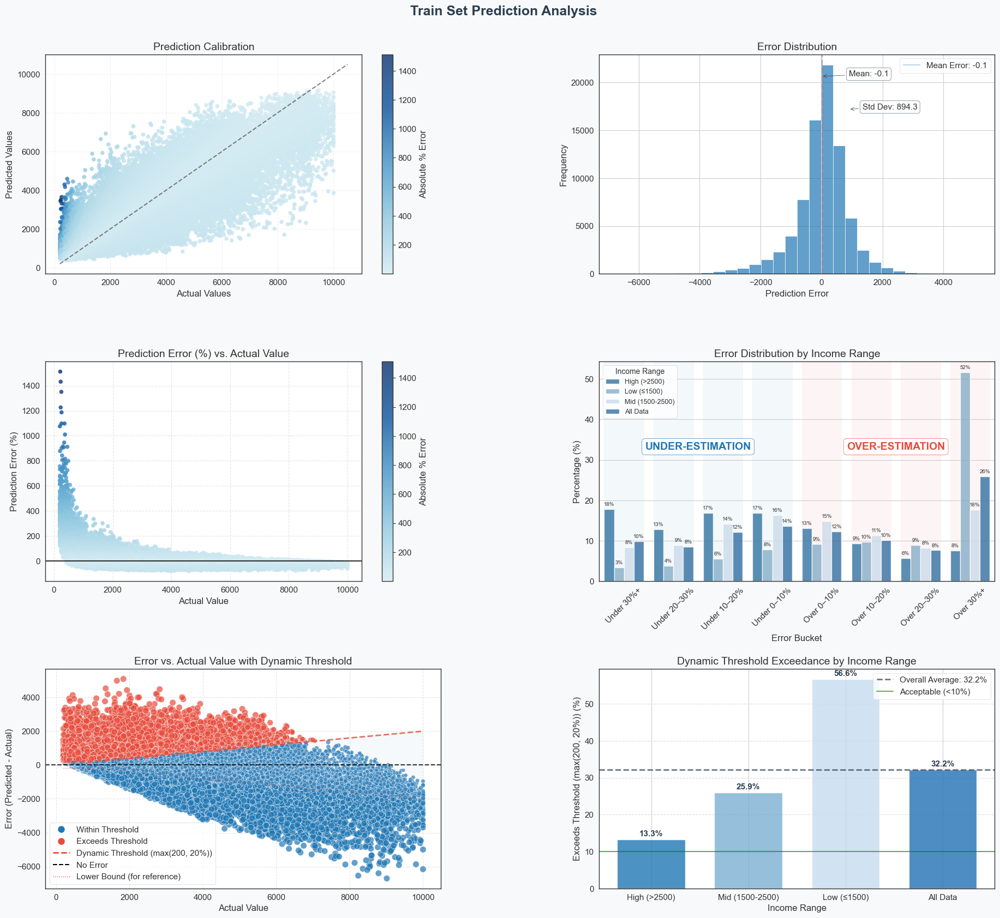


📈 Test Set - Comprehensive Visualization


/var/folders/9q/6vb57v6n4v7_rq2_zf4lp6dh0000gn/T/ipykernel_1735/3203116465.py:473: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(


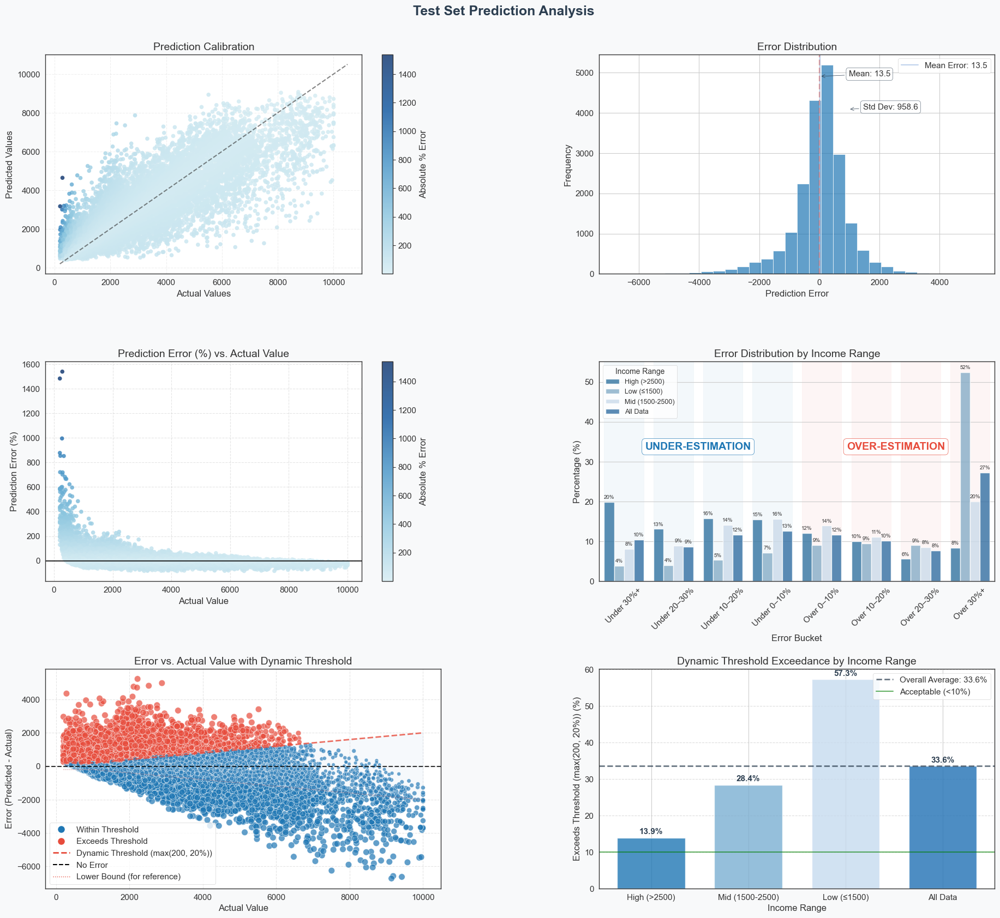


🔍 Analyzing feature importance...
🔍 Analyzing feature importance...
Calculating SHAP values for accurate feature ranking...

**Feature Importance**
 1 Min_transfer_In      336.71661054
 2 Inc_in               308.55322157
 3 Turnover             167.04228117
 4 Payment_L            162.49576177
 5 Salary               115.08368371
 6 Inc_Past             94.15217101
 7 Inc_6M               86.92059769
 8 Liab_Tot             85.98744038
 9 Transfers_in         79.09820124
10 Transfers_out        68.45812033
11 Inc_Past_max         67.48931383
12 Bal_Cur              57.45766799
13 Payments             51.68136113
14 Tot_in               32.89310622
15 Transactions         32.14860419


/var/folders/9q/6vb57v6n4v7_rq2_zf4lp6dh0000gn/T/ipykernel_1735/3203116465.py:914: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


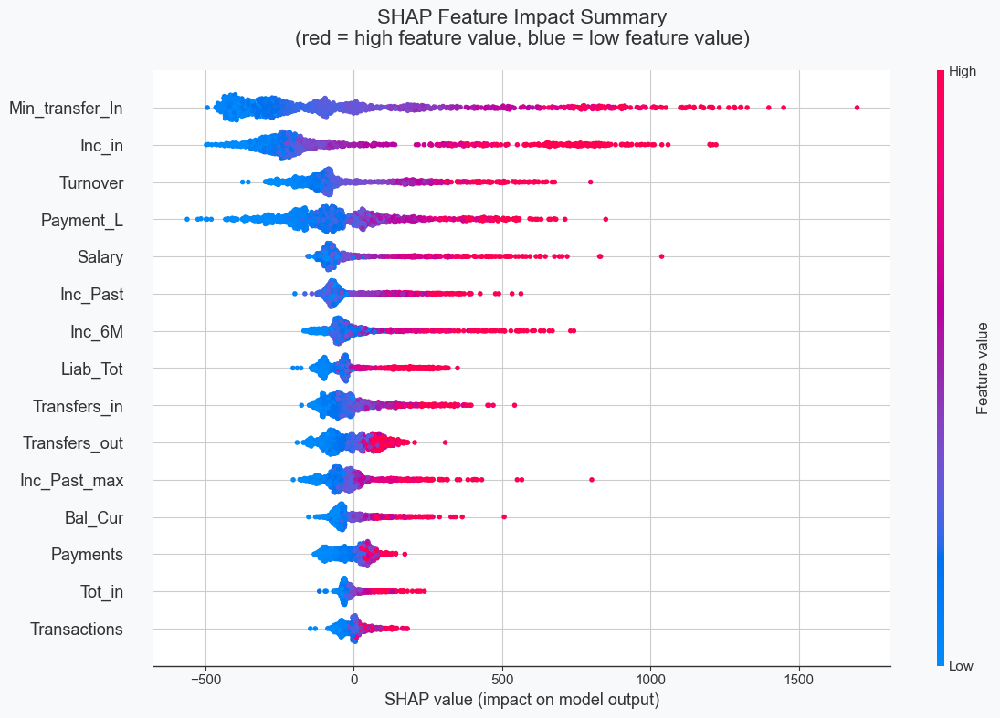


🔍 Feature dependence analysis...

🔍 Analyzing feature dependence...
Analyzing feature dependence for: Min_transfer_In, Inc_in, Turnover, Payment_L, Salary
Calculating SHAP values...


/var/folders/9q/6vb57v6n4v7_rq2_zf4lp6dh0000gn/T/ipykernel_1735/3203116465.py:1072: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


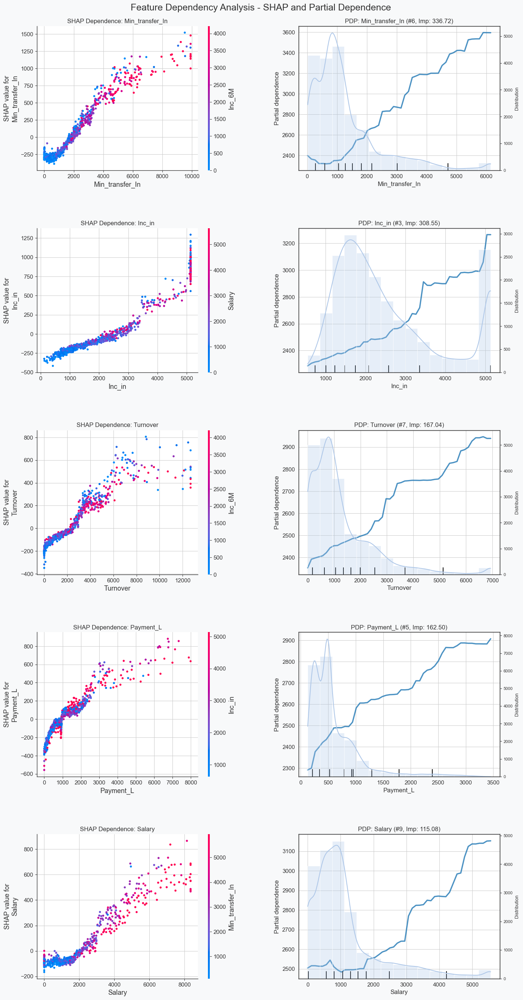

,feature,importance
5,Min_transfer_In,336.716611
2,Inc_in,308.553222
6,Turnover,167.042281
4,Payment_L,162.495762
8,Salary,115.083684
0,Inc_Past,94.152171
9,Inc_6M,86.920598
1,Liab_Tot,85.987440
11,Transfers_in,79.098201
3,Transfers_out,68.458120


In [20]:
# === 1. Initialize ModelEvaluator ===
# Use the 'blue' theme for evaluation visuals
evaluator_base = ModelEvaluator(theme='blue')

# === 2. Create analysis DataFrames ===

# Generate enriched DataFrames with error stats and threshold flags
train_df = evaluator_base.create_analysis_dataframe(y_train, y_train_pred)
test_df = evaluator_base.create_analysis_dataframe(y_test, y_test_pred)

# === 3. Calculate basic performance metrics ===

train_metrics = evaluator_base.calculate_basic_metrics(y_train, y_train_pred, train_df)
test_metrics = evaluator_base.calculate_basic_metrics(y_test, y_test_pred, test_df)

# Print summary of standard and threshold-based metrics
evaluator_base.print_metrics_table(train_metrics, test_metrics)

# === 4. Segment-level performance metrics ===

print("\n📊 Segment Analysis")
print("-" * 60)

# Compute performance by income segment
train_segment_df = evaluator_base.calculate_segment_metrics(train_df, include_threshold_metrics=True)
test_segment_df = evaluator_base.calculate_segment_metrics(test_df, include_threshold_metrics=True)

# Define columns and friendly names for display
segment_display_cols = ["segment", "count", "rmse", "r2", "within_10pct",
                        "within_20pct", "exceeds_threshold_pct"]
segment_rename_dict = {
    "rmse": "RMSE",
    "r2": "R²",
    "within_10pct": "Within 10% (%)",
    "within_20pct": "Within 20% (%)",
    "exceeds_threshold_pct": "Exceeds max(200,20%) (%)"
}

# Format results for display
train_segment_display_df = evaluator_base.format_and_display_segment_metrics(
    train_segment_df, columns=segment_display_cols, rename_dict=segment_rename_dict
)
test_segment_display_df = evaluator_base.format_and_display_segment_metrics(
    test_segment_df, columns=segment_display_cols, rename_dict=segment_rename_dict
)

# Display results
print("\n📋 Train Set - Segment Performance Summary:")
display(train_segment_display_df)

print("\n📋 Test Set - Segment Performance Summary:")
display(test_segment_display_df)

# === 5. Threshold-based evaluation by segment ===

print("\n📊 Dynamic Threshold Analysis by Segment")
print("-" * 60)

threshold_cols = ["segment", "count", "overestimation_pct", "overestimation_20plus_pct",
                  "exceeds_threshold_pct", "avg_dynamic_threshold"]
threshold_rename_dict = {
    "overestimation_pct": "Overestimations (%)",
    "overestimation_20plus_pct": ">20% Overestimations (%)",
    "exceeds_threshold_pct": "Exceeds max(200,20%) (%)",
    "avg_dynamic_threshold": "Avg Dynamic Threshold"
}

train_threshold_display_df = evaluator_base.format_and_display_segment_metrics(
    train_segment_df, columns=threshold_cols, rename_dict=threshold_rename_dict
)
test_threshold_display_df = evaluator_base.format_and_display_segment_metrics(
    test_segment_df, columns=threshold_cols, rename_dict=threshold_rename_dict
)

# Display threshold exceedance metrics
print("\n📋 Train Set - Threshold Analysis by Segment:")
display(train_threshold_display_df)

print("\n📋 Test Set - Threshold Analysis by Segment:")
display(test_threshold_display_df)

# === 6. Comprehensive visual diagnostics ===

# Generate full suite of evaluation plots for both sets
print("\n📈 Train Set - Comprehensive Visualization")
evaluator_base.plot_comprehensive_evaluation(train_df, dataset_name="Train Set", enhanced=True)

print("\n📈 Test Set - Comprehensive Visualization")
evaluator_base.plot_comprehensive_evaluation(test_df, dataset_name="Test Set", enhanced=True)

# === 7. Feature Importance and Dependence Analysis ===

print("\n🔍 Analyzing feature importance...")
importance_df = evaluator_base.plot_feature_importance(best_model, X_train, n_top=15, enhanced=True)

print("\n🔍 Feature dependence analysis...")
evaluator_base.plot_feature_dependence(best_model, X_test, importance_df, top_n=5, enhanced=True)

The baseline XGBoost model delivers strong predictive performance by conventional standards but fails to meet key regulatory expectations—especially in low-income segments. The evaluation below highlights both strengths and limitations.

**📊 Performance Overview**
- R² = 0.75 on the test set (0.79 on training), indicating a good overall fit.
- RMSE = 958.66 on the test set.
- Only **45.99%** of test predictions fall within ±20% of actual income values.

**📉 Threshold Compliance**
- Regulatory threshold: prediction must not exceed actual income by more than 200 GEL or 20%.
- **33.55%** of test predictions violate this threshold, exceeding the **10% supervisory limit**.

**📈 Segmented Performance**
- **High-income group (>2500 GEL)**:
  - R² = 0.35, and only **13.92%** exceed the threshold.
- **Mid-income group (1500–2500 GEL)**:
  - R² = -6.05, with a **28.40%** threshold violation rate.
- **Low-income group (≤1500 GEL)**:
  - R² = -2.01, with a severe **57.27%** threshold violation rate.
- These disparities confirm that a uniform model fails to generalize across segments, especially underestimating compliance risks for low-income borrowers.

**🔍 Feature Importance (via SHAP)**
- Key predictive features:
  - `Min_transfer_In` (336.72): Strong positive effect on income prediction.
  - `Inc_in` (308.55): High influence, with a non-linear pattern.
  - `Turnover` (167.04): Moderate influence.
  - `Payment_L` (162.50) and `Salary` (115.08): Similar impact, both positively correlated.
- SHAP and PDP plots confirm that the model captures several non-linear dependencies and thresholds in financial behavior.

**⚠️ Key Challenges Identified**
- Systematic **overestimation** in the low-income group, posing significant regulatory risk.
- **Skewed error distribution**, with overestimations being larger and more frequent than underestimations.
- Model misinterprets short-term or irregular inflows as indicators of stable income, due to limited signal about transaction context.

**✅ Conclusions and Next Steps**
- The baseline model generalizes well in aggregate but fails under regulatory scrutiny.
- A single, uniform approach is inadequate due to substantial performance variation across income segments.
- Next steps:
  - Explore **post-hoc calibration** (e.g., quantile regression) to reduce overestimation risk.
  - Investigate **pre-hoc adjustments** and **segment-aware objective functions** to enforce compliance during training.

Error Analysis for Extreme Cases.

The final analysis identifies and examines extreme prediction errors, focusing on low-income cases with severe overestimations.

In [21]:
import pandas as pd

# === 1. Build DataFrame with Actual and Predicted Values ===

# Construct DataFrame containing ground truth, predictions, and % error
train_error_df = pd.DataFrame({
    "actual": y_train,
    "pred": y_train_pred
})
train_error_df["error_pct"] = (
    (train_error_df["pred"] - train_error_df["actual"]) / (train_error_df["actual"] + 1e-6)
) * 100

# === 2. Define Filtering Criteria ===

# Thresholds for identifying problematic predictions
low_income_threshold = 2000                # Flag income values below this
overestimation_threshold = 200             # Flag predictions exceeding 200% error

# === 3. Find Extreme Overestimation Cases on Low Income ===

extreme_idx = train_error_df[
    (train_error_df["actual"] < low_income_threshold) &
    (train_error_df["error_pct"] > overestimation_threshold)
].index

# === 4. Retrieve and Annotate Feature Rows ===

# Extract original feature rows for extreme cases
extreme_features_df = X_train.loc[extreme_idx].copy()

# Add target and prediction values for reference
extreme_features_df["actual"] = y_train.loc[extreme_idx]
extreme_features_df["pred"] = pd.Series(y_train_pred, index=y_train.index).loc[extreme_idx]
extreme_features_df["error_pct"] = train_error_df.loc[extreme_idx, "error_pct"]

# === 5. Sort and Display Results ===

# Sort by highest overestimation error %
extreme_features_df = extreme_features_df.sort_values(by="error_pct", ascending=False)

# Ensure all columns are visible in output (optional)
pd.set_option('display.max_columns', None)

# Show top 10 most extreme cases
display(extreme_features_df.head(10))

,Inc_Past,Liab_Tot,Inc_in,Transfers_out,Payment_L,Min_transfer_In,Turnover,Transactions,Salary,Inc_6M,Acct_Trns,Transfers_in,Trn_max,Balance,Loan,Payments,Inc_Past_avg,Inc_Past_max,Tot_in,Bal_Cur,Loan_Cnt,Loan_to_Income,Balance_to_Liab,Income_Growth,Income_to_Liability,actual,pred,error_pct
21842,1622.082032,7869.309830,1390.90570,6629.057531,1683.710,5903.6256,11081.438779,8269.959801,0.0,6.0,7533.817292,0.0,39919.458045,1025.0000,5849.183305,95031.710031,1477.777612,3745.831133,32198.043369,2740.912460,0.0,3.605973,0.130253,-0.992602,4.091597,213,3435.746338,1513.026443
33427,6280.316184,5969.435064,5132.92233,8603.595983,1013.706,758.9314,3115.553196,12753.425436,0.0,0.0,8327.680561,0.0,9564.886918,2954.0000,0.000000,83624.378240,1778.952271,3317.393604,65143.991298,3487.914739,1.0,0.000000,0.494854,-1.000000,10.912924,228,3494.220215,1432.552720
17688,1748.135933,6797.967569,4085.65290,2195.577906,925.590,5446.8367,2037.550862,5402.396575,0.0,6.0,8451.104689,16.0,131809.336998,1221.0000,1070.599601,69361.790045,825.805999,3590.668864,71630.440127,7036.656262,0.0,0.612424,0.179613,-0.993136,10.537038,251,3642.564209,1351.220795
13155,54.703808,9933.573355,4922.98280,12534.405511,866.426,4668.0408,308.889471,14049.078832,10.0,3.0,9829.831112,6.0,34510.107722,1316.0000,971.354182,80042.867326,1872.589649,583.738154,61652.868808,1768.769497,2.0,17.756610,0.132480,-0.890318,6.206515,228,3024.922607,1226.720436
30106,4244.608381,4445.820360,5132.92233,13489.262250,0.000,565.6325,3273.281641,9088.193568,11.0,5.0,54188.557467,6.0,15253.677890,408.0000,263.805803,254833.339466,865.588039,3213.110829,140214.872468,10679.043547,0.0,0.062151,0.091772,-0.997644,31.538583,257,3308.796387,1187.469407
19543,3531.644718,7690.821550,5132.92233,9419.310256,0.000,35.1350,5053.481610,13581.054896,846.0,666.0,2774.871542,1077.0,37425.241141,168.0000,0.000000,146150.434178,395.890444,486.587956,34969.999364,0.000000,0.0,0.000000,0.021844,-0.622839,4.546978,254,3043.193604,1098.107714
11217,1413.206735,7863.876210,5132.92233,11048.413817,419.180,5654.5634,12687.788100,18955.903826,0.0,0.0,24697.710872,18.0,8038.660550,4725.0000,2139.672237,174841.544564,921.980892,4467.748020,140214.872468,7335.697755,0.0,1.514055,0.600849,-1.000000,17.830249,358,4289.158203,1098.088880
74931,2762.466267,6608.805524,5132.92233,7466.839874,264.670,30.9962,582.489818,14541.134986,0.0,8.0,4163.889885,10.0,14089.395465,3838.0000,0.000000,199721.640824,59.294072,5694.823854,41939.056476,1862.740317,0.0,0.000000,0.580740,-0.994208,6.345936,200,2352.060303,1076.030146
79905,5130.193846,55906.779517,5132.92233,8906.143091,917.500,575.8686,4870.696846,18955.903826,8.0,341.0,27035.216461,960.0,59457.357832,6865.6706,1867.822333,76265.569878,3729.874477,1700.404588,140214.872468,11803.121455,0.0,0.364084,0.122806,-0.867062,2.508012,375,4163.135742,1010.169529
66204,73.096701,3039.381373,4261.58720,9361.792394,63.110,5686.4374,848.448893,10558.551465,5683.0,474.0,27011.637558,1168.0,131809.336998,1109.0000,0.000000,51243.704453,2503.890780,97.739917,46266.293917,4220.838091,1.0,0.000000,0.364877,11.969119,15.222273,347,3630.017578,946.114573


<a id="post-hoc-calibration"></a>
## 5.3 Post-hoc Calibrated XGBoost Model

This section applies **post-hoc calibration** to improve the regulatory compliance of our baseline model. Post-hoc methods adjust predictions *after training*, making them especially useful when retraining is costly or impractical.

In our case, the baseline XGBoost model exhibits **systematic overestimation**, especially among low-income borrowers. Post-hoc calibration offers a lightweight and effective way to shift predictions downward and reduce threshold violations—without altering the model’s internal structure.

**Why post-hoc calibration is useful:**
- Corrects prediction bias (e.g., consistent overestimation) without retraining the model
- Enables precise tuning to meet regulatory constraints or business rules
- Produces simple, interpretable adjustment rules
- Can target specific error patterns across segments or thresholds

**Methodology: Quantile Regression Calibration**
- We use **quantile regression** to estimate a conditional lower quantile of true income given the model’s prediction.
- The output is a simple linear transformation:

  $$
  \hat{y}_{\mathrm{adjusted}} = \beta_0 + \beta_1 \cdot \hat{y}_{\mathrm{original}}
  $$

- Coefficients $\beta_0$ and $\beta_1$ are learned by minimizing **quantile loss**, which asymmetrically penalizes under- and over-estimation:

  $$
  \min_{\beta_0, \beta_1} \sum_{i=1}^{n} \rho_q \left( y_i - (\beta_0 + \beta_1 \hat{y}_i) \right)
  $$

  with the check function:

  $$
  \rho_q(u) =
  \begin{cases}
  q \cdot u, & u \geq 0 \quad \text{(underestimation)} \\\\
  (q - 1) \cdot u, & u < 0 \quad \text{(overestimation)}
  \end{cases}
  $$

**Controlling the trade-off:**
- The quantile level **q** determines the conservatism of the adjustment:
  - **Lower q values** (e.g., 0.2) result in stronger downward adjustments and reduce overestimation risk
  - **Higher q values** produce behavior closer to standard linear regression (less conservative)

This technique is easy to deploy and offers strong control over output distribution, improving compliance without modifying the model’s internal logic or requiring retraining.


<a id="calibration-helpers"></a>
### 5.3.1 Helper Functions for Calibration

The following cell defines utility functions for quantile-based calibration and evaluation.

In [22]:
# === Import Libraries for Quantile Regression and Evaluation ===

from sklearn.linear_model import QuantileRegressor
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# === Utility: Overestimation Ratio ===

def compute_overestimation_ratio(y_true, y_pred, threshold=0.2):
    """
    Compute the proportion of predictions that overestimate the true values
    by more than a specified percentage threshold.

    Parameters
    ----------
    y_true : array-like
        True target values.
    y_pred : array-like
        Predicted target values.
    threshold : float, default=0.2
        Overestimation threshold as a decimal (e.g., 0.2 for 20%).

    Returns
    -------
    float
        Fraction of predictions exceeding the overestimation threshold.
    """
    over_errors = ((y_pred - y_true) / (y_true + 1e-6)) > threshold
    return over_errors.sum() / len(y_true)

# === Utility: Dynamic Threshold Exceedance ===

def compute_dynamic_threshold_exceedance(y_true, y_pred, absolute=200, percentage=0.2):
    """
    Calculate the proportion of predictions whose error exceeds a dynamic threshold.
    The threshold is defined as the maximum of an absolute and percentage-based bound.

    Parameters
    ----------
    y_true : array-like
        True target values.
    y_pred : array-like
        Predicted target values.
    absolute : float, default=200
        Absolute error threshold.
    percentage : float, default=0.2
        Relative error threshold as a fraction (e.g., 0.2 for 20%).

    Returns
    -------
    float
        Ratio of predictions that exceed the dynamic threshold.
    """
    dynamic_threshold = np.maximum(absolute, y_true * percentage)
    error = y_pred - y_true
    exceeds = error > dynamic_threshold
    return exceeds.sum() / len(y_true)

# === Utility: Quantile-Based Adjustment ===

def apply_quantile_adjustment(y_pred, beta_0, beta_1):
    """
    Linearly adjust predictions using coefficients from a quantile regression model.

    Parameters
    ----------
    y_pred : array-like
        Original predicted values.
    beta_0 : float
        Intercept (bias term) of the adjustment.
    beta_1 : float
        Slope (scaling factor) of the adjustment.

    Returns
    -------
    array-like
        Adjusted predictions: beta_0 + beta_1 * y_pred
    """
    return beta_0 + beta_1 * y_pred

<a id="quantile-regressors"></a>
### 5.3.2 Training Quantile Regressors

To implement post-hoc calibration, we train **quantile regressors** at multiple quantile levels (0.05, 0.10, 0.15, 0.20) to identify the optimal adjustment strategy. Each quantile level produces a different calibration function that shifts predictions downward to reduce regulatory violations.

For each quantile level, the following steps are performed:

- Fit a **quantile regression model** to learn the relationship between the baseline predictions (`y_pred`) and true values (`y_true`).
- Extract the **intercept (β₀)** and **slope (β₁)** from the trained model to define a linear transformation:  
  `y_adjusted = β₀ + β₁ × y_pred`.
- Evaluate the **regulatory compliance** of the calibrated predictions by measuring:
  - Overestimation rates
  - Threshold violation frequencies (using the GEL/percent-based threshold)
- Analyze performance across **income segments** to assess whether calibration improves fairness and consistency, especially in low-income groups.

This process helps identify the quantile level that best balances compliance with predictive reliability.


In [23]:
# === Initialize ModelEvaluator for Quantile Regression Analysis ===
evaluator_quantile = ModelEvaluator(theme='green')

# === Define quantiles and subsample size ===
quantiles = [0.05, 0.1, 0.15, 0.2]         # Quantile levels to evaluate
subsample_size = 8000                   # Number of samples used to fit each quantile model

# === Prepare input data for quantile regression (reshaped as required by sklearn) ===
X_qr_train = y_train_pred.reshape(-1, 1)  # Use model predictions as feature for calibration
X_qr_test = y_test_pred.reshape(-1, 1)

# === Compute baseline overestimation metrics (before adjustment) ===
train_over_original = compute_overestimation_ratio(y_train, y_train_pred)
train_exceeds_original = compute_dynamic_threshold_exceedance(y_train, y_train_pred)
test_over_original = compute_overestimation_ratio(y_test, y_test_pred)
test_exceeds_original = compute_dynamic_threshold_exceedance(y_test, y_test_pred)

# === Storage containers for models and results ===
results = []      # List to store summary statistics per quantile
qr_models = {}    # Dictionary to store fitted QuantileRegressor models

# === Print header for results table ===
print("🔍 Training Quantile Regressors")
print("-" * 140)
print(f"{'Quantile':<8} {'β₀ (Intercept)':<16} {'β₁ (Slope)':<16} "
      f"{'TRAIN Overest >20%':<20} {'TRAIN Exceeds':<20} "
      f"{'TEST Overest >20%':<20} {'TEST Exceeds':<20}")
print("-" * 140)

# === Print baseline (unadjusted) model metrics for comparison ===
print(f"{'Original':<8} {'-':<16} {'-':<16} "
      f"%{train_over_original * 100:<18.2f}  %{train_exceeds_original * 100:<18.2f}  "
      f"%{test_over_original * 100:<18.2f}  %{test_exceeds_original * 100:<18.2f}")

# === Train Quantile Regressor for each quantile level ===
for q in quantiles:
    # Sample a subset of training data to speed up training
    rng = np.random.default_rng(RANDOM_STATE)
    subset_idx = rng.choice(len(X_qr_train), size=subsample_size, replace=False)
    X_sub = X_qr_train[subset_idx]
    y_sub = y_train[subset_idx]

    # Fit quantile regression model using the specified quantile
    qr = QuantileRegressor(quantile=q, alpha=1e-2, solver='highs')
    qr.fit(X_sub, y_sub)

    # Extract coefficients (intercept and slope)
    beta_0 = qr.intercept_
    beta_1 = qr.coef_[0]

    # Store model in dictionary
    qr_models[q] = qr

    # Apply model to training and test predictions to get adjusted values
    y_train_adjusted = qr.predict(X_qr_train)
    y_test_adjusted = qr.predict(X_qr_test)

    # Compute evaluation metrics on adjusted predictions
    train_over_ratio = compute_overestimation_ratio(y_train, y_train_adjusted)
    train_exceeds_ratio = compute_dynamic_threshold_exceedance(y_train, y_train_adjusted)
    test_over_ratio = compute_overestimation_ratio(y_test, y_test_adjusted)
    test_exceeds_ratio = compute_dynamic_threshold_exceedance(y_test, y_test_adjusted)

    # Save metrics and coefficients for later analysis
    results.append((q, beta_0, beta_1, train_over_ratio, train_exceeds_ratio, test_over_ratio, test_exceeds_ratio))

    # Display results row in summary table
    print(f"{q:<8.2f} {beta_0:<16.4f} {beta_1:<16.4f} "
          f"%{train_over_ratio * 100:<18.2f}  %{train_exceeds_ratio * 100:<18.2f}  "
          f"%{test_over_ratio * 100:<18.2f}  %{test_exceeds_ratio * 100:<18.2f}")

🔍 Training Quantile Regressors
--------------------------------------------------------------------------------------------------------------------------------------------
Quantile β₀ (Intercept)   β₁ (Slope)       TRAIN Overest >20%   TRAIN Exceeds        TEST Overest >20%    TEST Exceeds        
--------------------------------------------------------------------------------------------------------------------------------------------
Original -                -                %33.55               %32.16               %34.98               %33.55             
0.05     -254.1757        0.6361           %2.75                %2.06                %2.85                %2.20              
0.10     -249.7851        0.7316           %5.16                %4.21                %5.71                %4.59              
0.15     -225.8027        0.7905           %7.87                %6.64                %8.76                %7.46              
0.20     -196.9199        0.8288           %10.51       

This section analyzes how the calibration affects predictions across different data segments.

In [24]:
# === Create enriched analysis dataframe with segment labels ===
test_analysis_df = evaluator_quantile.create_analysis_dataframe(y_test, y_test_pred)

# Define ordered income ranges for display
ordered_ranges = ["Low (≤1500)", "Mid (1500-2500)", "High (>2500)"]

# Retain only ranges that are present in this test dataset
ranges = [r for r in ordered_ranges if r in test_analysis_df["range"].unique()]

# === Compute overall exceedance for baseline predictions ===
original_exceeds_ratio = compute_dynamic_threshold_exceedance(y_test, y_test_pred)

# === Display table header ===
print("\n📊 Dynamic Threshold Exceedance Analysis (max(200, 20%))")
print("-" * 100)
print(f"{'Quantile':<10} " + " ".join([f"{r:<18}" for r in ranges]) + f" {'All Data':<18}")
print("-" * 100)

# === Baseline exceedance per range ===
exceeds_ratios = {}
for range_name in ranges:
    mask = test_analysis_df["range"] == range_name
    y_true_segment = y_test[mask.values]            # True values for this range
    y_pred_segment = y_test_pred[mask.values]       # Predictions for this range
    exceeds_ratios[range_name] = compute_dynamic_threshold_exceedance(y_true_segment, y_pred_segment)

# Print baseline (unadjusted) exceedance rates
print(f"{'Original':<10} " + " ".join(
    [f"{exceeds_ratios[r]*100:6.2f}%{'':<10}" for r in ranges]) + 
    f"{original_exceeds_ratio*100:6.2f}%{'':<10}"
)

# === Evaluate adjusted predictions for each quantile model ===
# Each result tuple: (quantile, β₀, β₁, ..., ..., ..., ...)
for result in results:
    q, beta_0, beta_1 = result[0], result[1], result[2]

    # Store per-range exceedance results
    exceeds_ratios = {}
    for range_name in ranges:
        mask = test_analysis_df["range"] == range_name
        y_true_segment = y_test[mask.values]
        y_pred_segment = y_test_pred[mask.values]

        # Apply linear quantile adjustment
        y_adjusted_segment = beta_0 + beta_1 * y_pred_segment
        exceeds_ratios[range_name] = compute_dynamic_threshold_exceedance(y_true_segment, y_adjusted_segment)

    # Compute overall exceedance for adjusted predictions
    y_test_adjusted = beta_0 + beta_1 * y_test_pred
    exceeds_ratio = compute_dynamic_threshold_exceedance(y_test, y_test_adjusted)

    # Print results for this quantile
    print(f"{q:<10.2f} " + " ".join(
        [f"{exceeds_ratios[r]*100:6.2f}%{'':<10}" for r in ranges]) + 
        f"{exceeds_ratio*100:6.2f}%{'':<10}"
    )


📊 Dynamic Threshold Exceedance Analysis (max(200, 20%))
----------------------------------------------------------------------------------------------------
Quantile   Low (≤1500)        Mid (1500-2500)    High (>2500)       All Data          
----------------------------------------------------------------------------------------------------
Original    57.27%            28.40%            13.92%           33.55%          
0.05         4.55%             1.73%             0.20%            2.20%          
0.10         8.91%             3.93%             0.73%            4.59%          
0.15        14.19%             6.32%             1.59%            7.46%          
0.20        19.45%             8.58%             2.58%           10.34%          


The range-specific analysis helps identify which quantile level best addresses the overestimation issues in the low-income segment while minimizing impact on high-income predictions.

<a id="calibration-evaluation"></a>
### 5.3.3 Evaluating the Calibrated Model

After selecting the optimal quantile level (**q = 0.20**), we apply the corresponding linear calibration to the original model predictions and perform a full evaluation to assess its impact.

The analysis includes:

- Visual comparison of **original vs. calibrated predictions** to understand the directional shift.
- Examination of the **error distribution** before and after calibration to evaluate bias correction.
- Calculation of **segment-specific performance metrics**, focusing on accuracy and compliance within each income group.
- Measurement of **threshold exceedance rates** across income segments to assess regulatory alignment.

The visualization suite clearly demonstrates how quantile calibration reduces overestimation—particularly in low-income segments—while preserving much of the model’s overall predictive structure.



✅ Using quantile q=0.2 with coefficients:
β₀ (intercept): -196.9199
β₁ (slope): 0.8288

🔍 Evaluating original predictions on test set...

🔍 Evaluating adjusted predictions on test set...

📊 Model Comparison: Original vs. Quantile-Adjusted
----------------------------------------------------------------------
Metric                         Original        Adjusted        Change         
----------------------------------------------------------------------
Standard Metrics:
RMSE                           958.6558        1171.7506       +213.0948      
MAE                            652.8211        795.4928        +142.6717      
MAPE (%)                       36.0425         33.1313         -2.9112        
R²                             0.7482          0.6238          -0.1244        

Prediction Accuracy:
Within 10% (%)                 24.21          15.41          -8.81         
Within 20% (%)                 45.99          32.51          -13.48        
Within 30% (%)                 

/var/folders/9q/6vb57v6n4v7_rq2_zf4lp6dh0000gn/T/ipykernel_1735/3203116465.py:473: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(


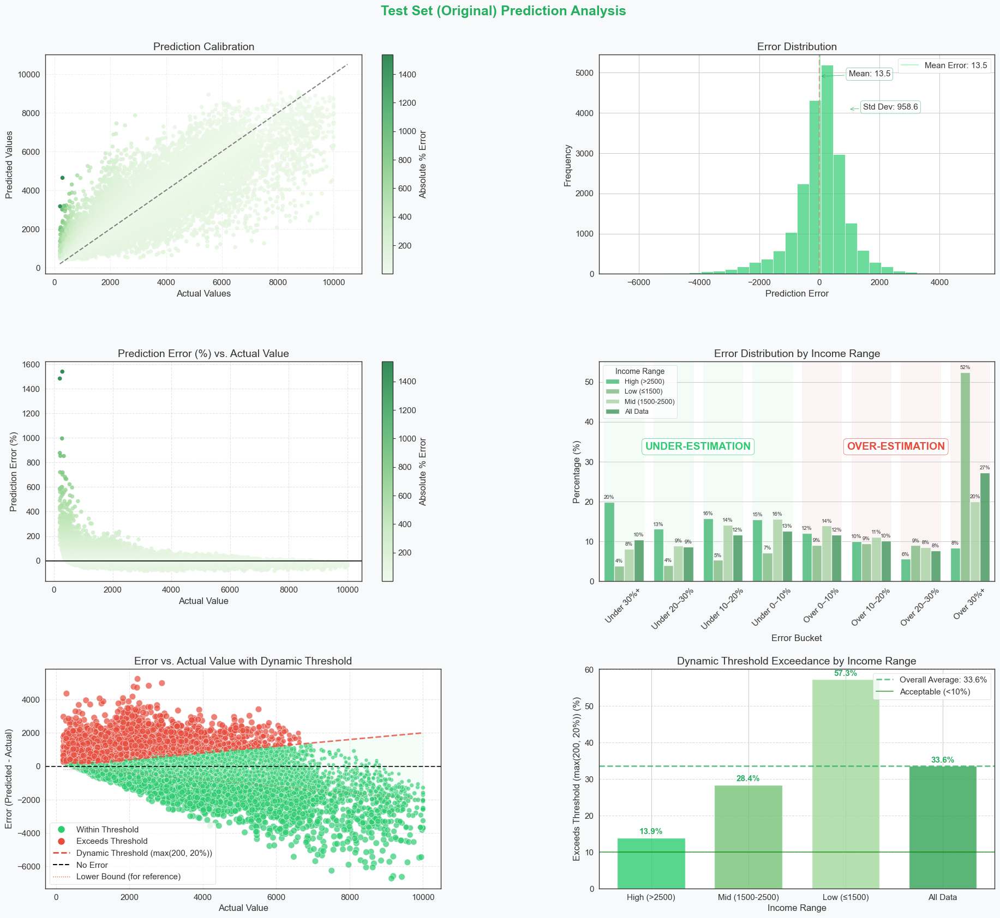


📈 Visualizing adjusted predictions...


/var/folders/9q/6vb57v6n4v7_rq2_zf4lp6dh0000gn/T/ipykernel_1735/3203116465.py:473: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(


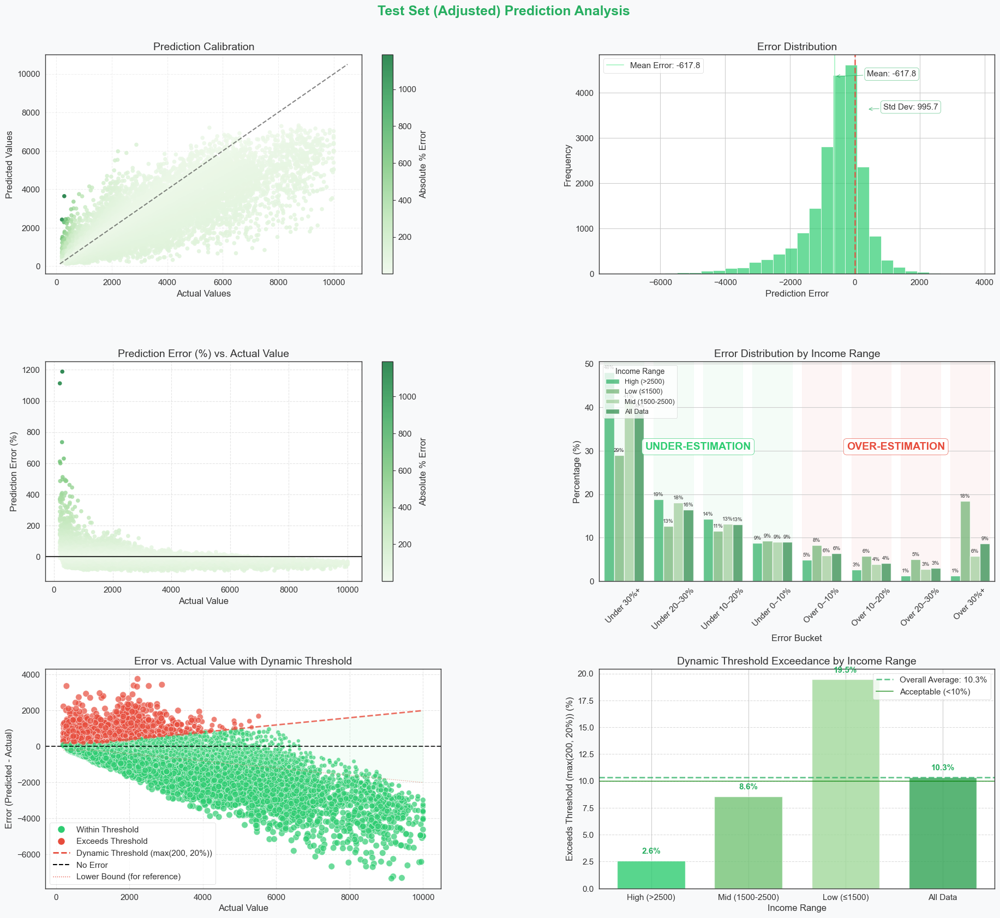

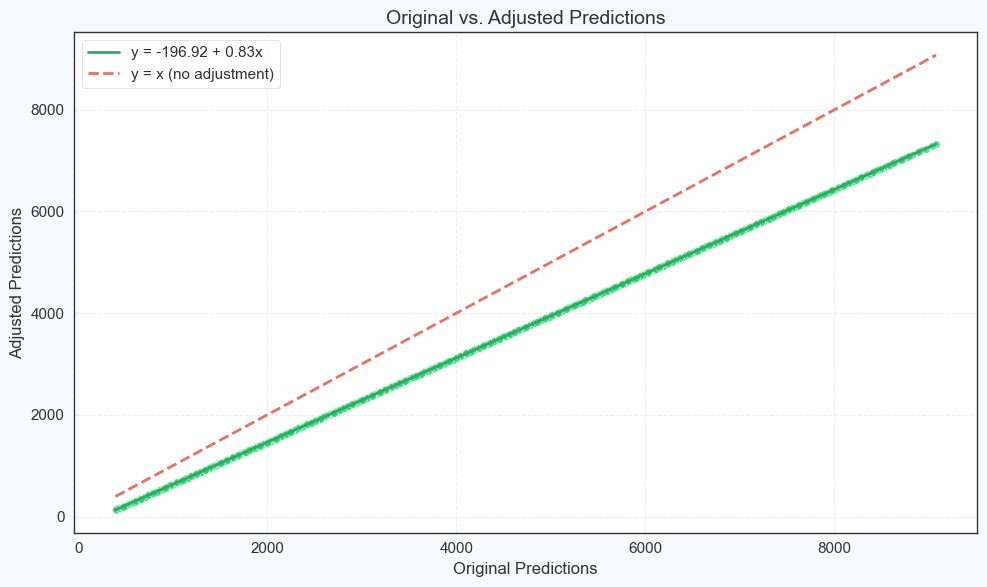

In [25]:
# === Select the optimal quantile based on previous tuning results ===
q_selected = 0.20  # Set based on observed performance

# === Retrieve coefficients for the selected quantile ===
for result in results:
    if result[0] == q_selected:
        beta_0_selected = result[1]
        beta_1_selected = result[2]
        break

# === Apply linear quantile adjustment to original predictions ===
y_train_adjusted = apply_quantile_adjustment(y_train_pred, beta_0_selected, beta_1_selected)
y_test_adjusted = apply_quantile_adjustment(y_test_pred, beta_0_selected, beta_1_selected)

# === Show selected quantile and its coefficients ===
print(f"\n✅ Using quantile q={q_selected} with coefficients:")
print(f"β₀ (intercept): {beta_0_selected:.4f}")
print(f"β₁ (slope): {beta_1_selected:.4f}")

# === Prepare original and adjusted evaluation dataframes ===
print("\n🔍 Evaluating original predictions on test set...")
train_df_original = evaluator_quantile.create_analysis_dataframe(y_train, y_train_pred)
test_df_original = evaluator_quantile.create_analysis_dataframe(y_test, y_test_pred)

print("\n🔍 Evaluating adjusted predictions on test set...")
train_df_adjusted = evaluator_quantile.create_analysis_dataframe(y_train, y_train_adjusted)
test_df_adjusted = evaluator_quantile.create_analysis_dataframe(y_test, y_test_adjusted)

# === Compute evaluation metrics for both versions ===
train_metrics_original = evaluator_quantile.calculate_basic_metrics(y_train, y_train_pred, train_df_original)
test_metrics_original = evaluator_quantile.calculate_basic_metrics(y_test, y_test_pred, test_df_original)
train_metrics_adjusted = evaluator_quantile.calculate_basic_metrics(y_train, y_train_adjusted, train_df_adjusted)
test_metrics_adjusted = evaluator_quantile.calculate_basic_metrics(y_test, y_test_adjusted, test_df_adjusted)

# === Print side-by-side comparison of metrics ===
print("\n📊 Model Comparison: Original vs. Quantile-Adjusted")
print("-" * 70)
print(f"{'Metric':<30} {'Original':<15} {'Adjusted':<15} {'Change':<15}")
print("-" * 70)

# Standard performance metrics
print("Standard Metrics:")
print(f"{'RMSE':<30} {test_metrics_original['rmse']:<15.4f} {test_metrics_adjusted['rmse']:<15.4f} {test_metrics_adjusted['rmse'] - test_metrics_original['rmse']:<+15.4f}")
print(f"{'MAE':<30} {test_metrics_original['mae']:<15.4f} {test_metrics_adjusted['mae']:<15.4f} {test_metrics_adjusted['mae'] - test_metrics_original['mae']:<+15.4f}")
print(f"{'MAPE (%)':<30} {test_metrics_original['mape']:<15.4f} {test_metrics_adjusted['mape']:<15.4f} {test_metrics_adjusted['mape'] - test_metrics_original['mape']:<+15.4f}")
print(f"{'R²':<30} {test_metrics_original['r2']:<15.4f} {test_metrics_adjusted['r2']:<15.4f} {test_metrics_adjusted['r2'] - test_metrics_original['r2']:<+15.4f}")

# Prediction accuracy metrics
print("\nPrediction Accuracy:")
print(f"{'Within 10% (%)':<30} {test_metrics_original['within_10pct']:<14.2f} {test_metrics_adjusted['within_10pct']:<14.2f} {test_metrics_adjusted['within_10pct'] - test_metrics_original['within_10pct']:<+14.2f}")
print(f"{'Within 20% (%)':<30} {test_metrics_original['within_20pct']:<14.2f} {test_metrics_adjusted['within_20pct']:<14.2f} {test_metrics_adjusted['within_20pct'] - test_metrics_original['within_20pct']:<+14.2f}")
print(f"{'Within 30% (%)':<30} {test_metrics_original['within_30pct']:<14.2f} {test_metrics_adjusted['within_30pct']:<14.2f} {test_metrics_adjusted['within_30pct'] - test_metrics_original['within_30pct']:<+14.2f}")

# Threshold-based error control metrics
if "exceeds_threshold_pct" in test_metrics_original and "exceeds_threshold_pct" in test_metrics_adjusted:
    print("\nThreshold Metrics:")
    print(f"{'Overestimations (%)':<30} {test_metrics_original['overestimation_pct']:<14.2f} {test_metrics_adjusted['overestimation_pct']:<14.2f} {test_metrics_adjusted['overestimation_pct'] - test_metrics_original['overestimation_pct']:<+14.2f}")
    print(f"{'Overestimations >20% (%)':<30} {test_metrics_original['overestimation_20plus_pct']:<14.2f} {test_metrics_adjusted['overestimation_20plus_pct']:<14.2f} {test_metrics_adjusted['overestimation_20plus_pct'] - test_metrics_original['overestimation_20plus_pct']:<+14.2f}")
    print(f"{'Exceeds max(200,20%) (%)':<30} {test_metrics_original['exceeds_threshold_pct']:<14.2f} {test_metrics_adjusted['exceeds_threshold_pct']:<14.2f} {test_metrics_adjusted['exceeds_threshold_pct'] - test_metrics_original['exceeds_threshold_pct']:<+14.2f}")

# === Visualize original prediction performance ===
print("\n📈 Visualizing original predictions...")
evaluator_quantile.plot_comprehensive_evaluation(test_df_original, dataset_name="Test Set (Original)", enhanced=True)

# === Visualize quantile-adjusted prediction performance ===
print("\n📈 Visualizing adjusted predictions...")
evaluator_quantile.plot_comprehensive_evaluation(test_df_adjusted, dataset_name="Test Set (Adjusted)", enhanced=True)

# === Plot comparison: Original vs. Adjusted ===
plt.figure(figsize=(10, 6))
evaluator_quantile.theme.apply_figure_style(plt.gcf())
colors = evaluator_quantile.theme.get_colors()

# Scatter of original vs adjusted predictions
plt.scatter(y_test_pred, y_test_adjusted, alpha=0.7, s=30,
            color=colors['primary'], edgecolor='white', linewidth=0.5)

# Adjustment line (linear transformation)
x_range = np.linspace(min(y_test_pred), max(y_test_pred), 100)
y_range = beta_0_selected + beta_1_selected * x_range
plt.plot(x_range, y_range, '-', color=colors['accent'], linewidth=2, label=f'y = {beta_0_selected:.2f} + {beta_1_selected:.2f}x')

# Identity line (no adjustment reference)
plt.plot(x_range, x_range, '--', color=colors['error'], alpha=0.8, linewidth=2, label='y = x (no adjustment)')

# Axes and formatting
plt.xlabel('Original Predictions', fontsize=12)
plt.ylabel('Adjusted Predictions', fontsize=12)
plt.title('Original vs. Adjusted Predictions', fontsize=14)
plt.legend(loc='best')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

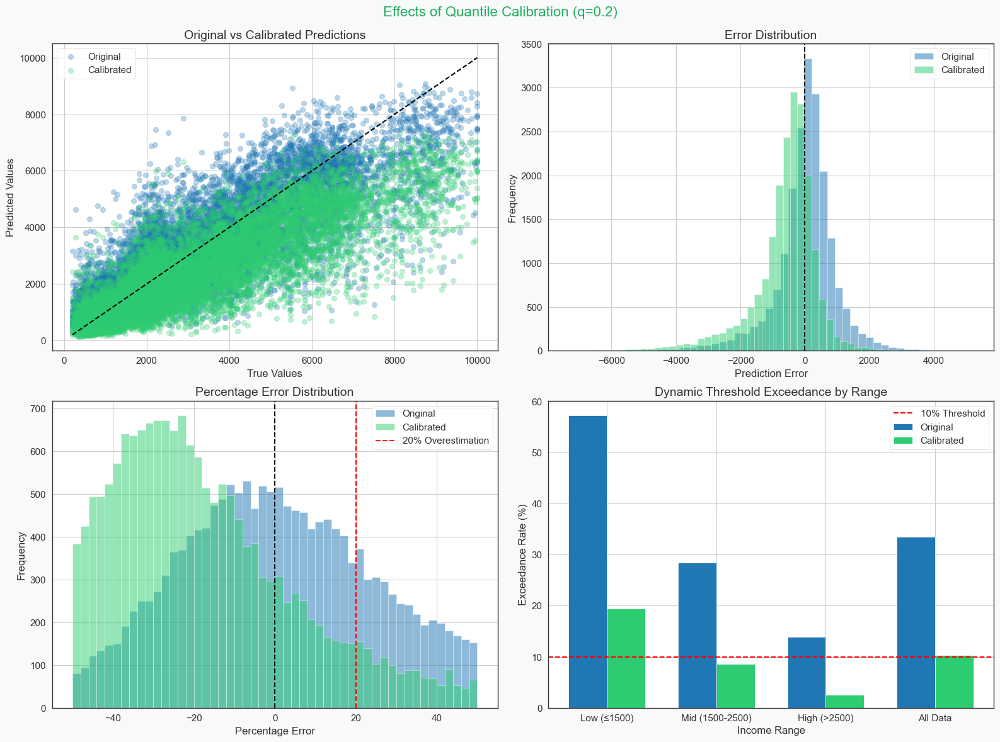

In [26]:
# === Visualize the Effects of Quantile-Based Calibration ===

plt.figure(figsize=(16, 12))

# Apply visual theme
evaluator_quantile.theme.apply_figure_style(plt.gcf())

# Define custom colors
original_color = '#1f77b4'       # Blue
calibrated_color = '#2ecc71'     # Green
accent_color = evaluator_quantile.theme.get_colors()['accent']

# === Subplot 1: Actual vs Predicted (Original vs Calibrated) ===

plt.subplot(2, 2, 1)
plt.scatter(y_test, y_test_pred, alpha=0.3, color=original_color, label='Original')
plt.scatter(y_test, y_test_adjusted, alpha=0.3, color=calibrated_color, label='Calibrated')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'k--')  # y = x line
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('Original vs Calibrated Predictions')
plt.legend()

# === Subplot 2: Raw Error Distributions ===

plt.subplot(2, 2, 2)
orig_errors = y_test_pred - y_test
calib_errors = y_test_adjusted - y_test
plt.hist(orig_errors, bins=50, alpha=0.5, color=original_color, label='Original')
plt.hist(calib_errors, bins=50, alpha=0.5, color=calibrated_color, label='Calibrated')
plt.axvline(0, color='k', linestyle='--')
plt.xlabel('Prediction Error')
plt.ylabel('Frequency')
plt.title('Error Distribution')
plt.legend()

# === Subplot 3: Percentage Error Distribution ===

plt.subplot(2, 2, 3)
orig_pct_errors = (y_test_pred - y_test) / (y_test + 1e-6) * 100
calib_pct_errors = (y_test_adjusted - y_test) / (y_test + 1e-6) * 100
plt.hist(orig_pct_errors, bins=50, range=(-50, 50), alpha=0.5, color=original_color, label='Original')
plt.hist(calib_pct_errors, bins=50, range=(-50, 50), alpha=0.5, color=calibrated_color, label='Calibrated')
plt.axvline(0, color='k', linestyle='--')
plt.axvline(20, color='r', linestyle='--', label='20% Overestimation')
plt.xlabel('Percentage Error')
plt.ylabel('Frequency')
plt.title('Percentage Error Distribution')
plt.legend()

# === Subplot 4: Dynamic Threshold Exceedance by Income Range ===

plt.subplot(2, 2, 4)
x_pos = np.arange(len(ranges) + 1)  # One extra for 'All Data'
width = 0.35

# Compute exceedance for original predictions
orig_exceed_by_range = []
for range_name in ranges:
    mask = test_analysis_df["range"] == range_name
    y_true_segment = y_test[mask.values]
    y_pred_segment = y_test_pred[mask.values]
    exceed = compute_dynamic_threshold_exceedance(y_true_segment, y_pred_segment) * 100
    orig_exceed_by_range.append(exceed)
orig_exceed_by_range.append(original_exceeds_ratio * 100)

# Compute exceedance for calibrated predictions
calib_exceed_by_range = []
for range_name in ranges:
    mask = test_analysis_df["range"] == range_name
    y_true_segment = y_test[mask.values]
    y_pred_segment = y_test_pred[mask.values]
    y_adjusted_segment = beta_0_selected + beta_1_selected * y_pred_segment
    exceed = compute_dynamic_threshold_exceedance(y_true_segment, y_adjusted_segment) * 100
    calib_exceed_by_range.append(exceed)
calib_exceed_by_range.append(compute_dynamic_threshold_exceedance(y_test, y_test_adjusted) * 100)

# Bar plot
plt.bar(x_pos - width/2, orig_exceed_by_range, width, label='Original', color=original_color)
plt.bar(x_pos + width/2, calib_exceed_by_range, width, label='Calibrated', color=calibrated_color)
plt.xlabel('Income Range')
plt.ylabel('Exceedance Rate (%)')
plt.title('Dynamic Threshold Exceedance by Range')
plt.xticks(x_pos, ranges + ['All Data'])
plt.axhline(y=10, color='red', linestyle='--', label='10% Threshold')
plt.legend()

# === Final Layout and Title ===

plt.tight_layout()
plt.suptitle(f'Effects of Quantile Calibration (q={q_selected})', fontsize=16, color=accent_color)
plt.subplots_adjust(top=0.93)
plt.show()

In [27]:
# === Compare Key Metrics: Original vs. Calibrated ===

# Store original and calibrated metrics
original_metrics = test_metrics_original
adjusted_metrics = test_metrics_adjusted

# Define metrics to compare
metrics_list = [
    'RMSE',
    'MAPE (%)',
    'R²',
    'Within 10% (%)',
    'Within 20% (%)',
    'Overestimations (%)',
    'Overestimations >20% (%)',
    'Exceeds Dynamic Threshold (%)'
]

# Extract values from both evaluations
original_values = [
    original_metrics['rmse'],
    original_metrics['mape'],
    original_metrics['r2'],
    original_metrics['within_10pct'],
    original_metrics['within_20pct'],
    original_metrics['overestimation_pct'],
    original_metrics['overestimation_20plus_pct'],
    original_metrics['exceeds_threshold_pct']
]

calibrated_values = [
    adjusted_metrics['rmse'],
    adjusted_metrics['mape'],
    adjusted_metrics['r2'],
    adjusted_metrics['within_10pct'],
    adjusted_metrics['within_20pct'],
    adjusted_metrics['overestimation_pct'],
    adjusted_metrics['overestimation_20plus_pct'],
    adjusted_metrics['exceeds_threshold_pct']
]

# Compute metric differences
change_values = [
    calibrated - original 
    for calibrated, original in zip(calibrated_values, original_values)
]

# Create comparison table
comparison_metrics = pd.DataFrame({
    'Metric': metrics_list,
    'Original': original_values,
    'Calibrated': calibrated_values,
    'Change': change_values
})

# Round for display
comparison_metrics[['Original', 'Calibrated', 'Change']] = comparison_metrics[[
    'Original', 'Calibrated', 'Change'
]].round(2)

# === Display Table ===

print("\n📊 Comparison of Original vs. Calibrated Model")
print("-" * 80)
print(comparison_metrics)

# === Summary ===

print("\n📝 Summary of Quantile Calibration Effects:")
print(f"• Selected quantile: {q_selected}")
print(f"• Calibration formula: y_adjusted = {beta_0_selected:.4f} + {beta_1_selected:.4f} * y_pred")

# Identify improved and worsened metrics
lower_better = ['RMSE', 'MAPE (%)', 'Overestimations (%)', 'Overestimations >20% (%)', 'Exceeds Dynamic Threshold (%)']
higher_better = ['R²', 'Within 10% (%)', 'Within 20% (%)']

# Improvements
improved_metrics = comparison_metrics[
    ((comparison_metrics['Metric'].isin(lower_better)) & (comparison_metrics['Change'] < 0)) |
    ((comparison_metrics['Metric'].isin(higher_better)) & (comparison_metrics['Change'] > 0))
]

# Worsenings
worsened_metrics = comparison_metrics[
    ((comparison_metrics['Metric'].isin(lower_better)) & (comparison_metrics['Change'] > 0)) |
    ((comparison_metrics['Metric'].isin(higher_better)) & (comparison_metrics['Change'] < 0))
]

# Display improved metrics
if not improved_metrics.empty:
    print("\n✅ Metrics that improved with calibration:")
    for _, row in improved_metrics.iterrows():
        print(f"• {row['Metric']}: {row['Original']} → {row['Calibrated']} (Change: {row['Change']:+.2f})")

# Display worsened metrics
if not worsened_metrics.empty:
    print("\n⚠️ Metrics that worsened with calibration:")
    for _, row in worsened_metrics.iterrows():
        print(f"• {row['Metric']}: {row['Original']} → {row['Calibrated']} (Change: {row['Change']:+.2f})")

# === Save Calibrated Model Info ===

calibrated_model = {
    'base_model': best_model,
    'quantile': q_selected,
    'beta_0': beta_0_selected,
    'beta_1': beta_1_selected
}

# === Prediction Function for Future Use ===

def predict_with_calibration(X, model=calibrated_model):
    """
    Make predictions using a base model followed by quantile-based calibration.

    Parameters
    ----------
    X : pd.DataFrame
        Input features.
    model : dict
        Contains 'base_model', 'beta_0', and 'beta_1' coefficients.

    Returns
    -------
    np.ndarray
        Calibrated predictions.
    """
    base_predictions = model['base_model'].predict(X)
    calibrated_predictions = model['beta_0'] + model['beta_1'] * base_predictions
    return calibrated_predictions

print("\n🔍 Example usage for future predictions:")
print("predictions = predict_with_calibration(X_new, calibrated_model)")


📊 Comparison of Original vs. Calibrated Model
--------------------------------------------------------------------------------
                          Metric  Original  Calibrated  Change
0                           RMSE    958.66     1171.75  213.09
1                       MAPE (%)     36.04       33.13   -2.91
2                             R²      0.75        0.62   -0.12
3                 Within 10% (%)     24.22       15.41   -8.81
4                 Within 20% (%)     45.99       32.51  -13.48
5            Overestimations (%)     56.77       22.24  -34.52
6       Overestimations >20% (%)     34.98       11.74  -23.23
7  Exceeds Dynamic Threshold (%)     33.55       10.34  -23.21

📝 Summary of Quantile Calibration Effects:
• Selected quantile: 0.2
• Calibration formula: y_adjusted = -196.9199 + 0.8288 * y_pred

✅ Metrics that improved with calibration:
• MAPE (%): 36.04 → 33.13 (Change: -2.91)
• Overestimations (%): 56.77 → 22.24 (Change: -34.52)
• Overestimations >20% (%): 34.98

The quantile-based calibration strategy successfully mitigates the overestimation issue observed in the baseline XGBoost model, highlighting the effectiveness of post-hoc adjustment techniques in risk-sensitive applications.

**📌 Calibration Summary**
- Optimal quantile level selected: **q = 0.20**, based on evaluation across multiple levels (0.05, 0.10, 0.15, 0.20).
- Final calibration formula:
  `y_adjusted = -196.92 + 0.8288 × y_pred`
- Introduces a **consistent downward shift**, with a stronger effect on higher predictions.

**✅ Key Improvements**
- **Overestimation rates significantly reduced**:
  - Total overestimations: **↓ from 56.77% to 22.25%** (−34.52%)
  - Severe overestimations (>20%): **↓ from 34.98% to 11.74%** (−23.24%)
  - Regulatory threshold violations: **↓ from 33.55% to 10.34%** (−23.21%)

**⚠️ Trade-offs**
- Standard accuracy metrics show expected degradation:
  - RMSE: **↑ from 958.66 to 1171.75** (+213.09)
  - R²: **↓ from 0.75 to 0.62** (−0.12)
  - Predictions within ±10%: **↓ from 24.21% to 15.41%** (−8.81%)
  - Predictions within ±20%: **↓ from 45.99% to 32.51%** (−13.48%)
- Error distribution now skews slightly toward **underestimation**.
- **Minimal impact on high-income predictions**, where the model was already compliant.

**📊 Visual Insights**
- Error distribution histogram shifts visibly toward more conservative predictions.
- Extreme overestimation cases are sharply reduced.
- Range-specific violation charts confirm dramatic improvement in low- and mid-income groups.

**🛠️ Practical Implementation**
- Simple to integrate into production using the `predict_with_calibration` function.
- Does **not require retraining** of the base model—making it lightweight and efficient.

**🎯 Conclusion**
This post-hoc calibration strategy effectively addresses the key concern of overestimation in low-income predictions. It improves compliance and reduces risk of regulatory breach. Although overall accuracy is modestly reduced, the trade-off is acceptable given the substantial gain in threshold control and prediction conservatism—making this a valuable tool in regulation-aware modeling.

- - -

<a id="pre-hoc-adjustment"></a>
## 5.4 Pre-hoc Adjusted XGBoost Model

Pre-hoc adjustment models incorporate regulatory constraints directly into the training process by modifying the loss function. Instead of correcting predictions after training, these models learn to minimize threshold exceedance during optimization—producing inherently compliant outputs.

**Key advantages of pre-hoc adjustment:**
- **Aligns training objectives** with real-world business and regulatory requirements.
- Enables the model to **learn complex, non-linear interactions** between inputs and compliance thresholds.
- Removes the need for **post-processing or external calibration layers** at inference time.
- Offers **flexible error control**, allowing different penalties for over- and underestimation.

In this section, we implement two types of custom objectives:
1. A **uniform Huber + threshold penalty** model, which applies the same regulatory constraint logic to all borrowers.
2. A **segment-aware extension**, which varies the penalty intensity and Huber tolerance based on income group—introducing differentiated treatment based on supervisory risk.

Both models aim to strike a better balance between accuracy and regulatory compliance, especially for high-risk segments like low-income borrowers.


<a id="modeling-toolkit"></a>
### 5.4.1 Modeling Toolkit

This section contains utility functions for implementing and evaluating pre-hoc models:
- Dynamic threshold checker
- Training function for custom objective models
- Model evaluation metrics
- Comprehensive evaluation runner

In [28]:
import numpy as np
import pandas as pd
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error
from xgboost import DMatrix, XGBRegressor, train as xgb_train

# === Shared Utility: Dynamic Threshold Checking ===

def exceeds_dynamic_threshold(y_true, y_pred, absolute_threshold=200, percentage_threshold=20):
    """
    Determine if predictions exceed the dynamic threshold:
    max(absolute_threshold, percentage_threshold * y_true)

    Returns
    -------
    tuple: (bool array, dynamic thresholds, prediction errors)
    """
    dynamic_thresholds = np.maximum(absolute_threshold, y_true * (percentage_threshold / 100))
    errors = y_pred - y_true
    exceeds = errors > dynamic_thresholds
    return exceeds, dynamic_thresholds, errors

# # --- 1. Huber Loss + Dynamic Threshold Objective ---
def huber_plus_threshold_loss(predt, dtrain, delta=100.0, threshold_weight=3.0):
    """
    Custom objective combining Huber loss with a squared penalty
    for predictions exceeding a dynamic threshold.

    Parameters
    ----------
    predt : array-like
        Model predictions.
    dtrain : xgboost.DMatrix
        Training data containing the true target values.
    delta : float
        Huber loss threshold.
    threshold_weight : float
        Weight of the squared penalty for exceeding the threshold.

    Returns
    -------
    grad : array
        Gradient values.
    hess : array
        Hessian values.
    """
    y_true = dtrain.get_label()
    errors = predt - y_true
    abs_errors = np.abs(errors)

    # Huber loss base
    is_small_error = abs_errors <= delta
    grad = np.where(is_small_error, 2 * errors, 2 * delta * np.sign(errors))
    hess = np.where(is_small_error, 2.0, 0.1)

    # Threshold penalty
    exceeds, dynamic_thresholds, _ = exceeds_dynamic_threshold(y_true, predt)
    if np.any(exceeds):
        exceed_amount = predt[exceeds] - y_true[exceeds] - dynamic_thresholds[exceeds]

        exceed_grad = np.zeros_like(errors)
        exceed_hess = np.zeros_like(errors)

        exceed_grad[exceeds] = 2 * exceed_amount * threshold_weight
        exceed_hess[exceeds] = 2.0 * threshold_weight

        grad += exceed_grad
        hess += exceed_hess

    return grad, hess

# --- 2. Segment-Aware Huber + Threshold Objective ---
def segment_aware_huber_threshold_loss(predt, dtrain):
    """
    Segment-aware custom loss combining Huber loss for robustness and
    squared penalty for dynamic threshold exceedance.

    Parameters
    ----------hb
    predt : array-like
        Predicted values from the model.
    dtrain : xgboost.DMatrix
        DMatrix containing the training labels.

    Returns
    -------
    grad : array
        Gradient vector.
    hess : array
        Hessian vector.
    """
    y_true = dtrain.get_label()
    errors = predt - y_true
    abs_errors = np.abs(errors)

    # === Segment assignment ===
    low_segment = y_true <= 1500
    mid_segment = (y_true > 1500) & (y_true <= 2500)
    high_segment = y_true > 2500

    # === Segment-specific Huber delta ===
    delta = np.zeros_like(y_true)
    delta[low_segment] = 30.0
    delta[mid_segment] = 80.0
    delta[high_segment] = 200.0

    # === Segment-specific threshold weights ===
    penalty_weight = np.zeros_like(y_true)
    penalty_weight[low_segment] = 12.0
    penalty_weight[mid_segment] = 3.0
    penalty_weight[high_segment] = 1.0

    # === Base Huber loss ===
    is_small_error = abs_errors <= delta
    grad = np.where(is_small_error, 2 * errors, 2 * delta * np.sign(errors))
    hess = np.where(is_small_error, 2.0, 0.1)

    # === Threshold penalty (squared exceedance) ===
    exceeds, dynamic_thresholds, _ = exceeds_dynamic_threshold(y_true, predt)
    if np.any(exceeds):
        exceed_amount = predt[exceeds] - y_true[exceeds] - dynamic_thresholds[exceeds]
        exceed_grad = np.zeros_like(errors)
        exceed_hess = np.zeros_like(errors)

        exceed_grad[exceeds] = 2 * exceed_amount * penalty_weight[exceeds]
        exceed_hess[exceeds] = 2.0 * penalty_weight[exceeds]

        grad += exceed_grad
        hess += exceed_hess

    return grad, hess

# # --- Huber Loss + Dynamic Threshold Objective ---
# def huber_threshold_objective(predt, dtrain, delta=100.0, threshold_weight=20.0):
#     """
#     Combines Huber loss with extra penalty for predictions exceeding dynamic threshold.
#     """
#     y_true = dtrain.get_label()
#     errors = predt - y_true
#     abs_errors = np.abs(errors)
#     is_small_error = abs_errors <= delta

#     # Base Huber loss
#     grad = np.where(is_small_error, 2 * errors, 2 * delta * np.sign(errors))
#     hess = np.where(is_small_error, 2.0, 0.1)

#     # Threshold penalty
#     exceeds, dynamic_thresholds, _ = exceeds_dynamic_threshold(y_true, predt)
#     if np.any(exceeds):
#         exceed_amount = errors[exceeds] - dynamic_thresholds[exceeds]
#         small_exceed = exceed_amount <= delta

#         exceed_grad = np.zeros_like(errors)
#         exceed_grad[exceeds] = np.where(
#             small_exceed,
#             2 * exceed_amount,
#             2 * delta
#         ) * threshold_weight

#         exceed_hess = np.zeros_like(errors)
#         exceed_hess[exceeds] = np.where(
#             small_exceed,
#             2.0,
#             0.1
#         ) * threshold_weight

#         grad += exceed_grad
#         hess += exceed_hess

#     return grad, hess


# # --- 2. Asymmetric Huber + Threshold Objective ---
# def asymmetric_huber_threshold_objective(predt, dtrain):
#     """
#     Applies asymmetric Huber loss and extra penalty for overestimations beyond dynamic threshold.
#     """
#     y_true = dtrain.get_label()
#     errors = predt - y_true
#     abs_errors = np.abs(errors)

#     is_over = errors > 0
#     is_under = ~is_over

#     # Different Huber deltas and weights
#     over_delta, under_delta = 100.0, 300.0
#     over_weight, under_weight = 1.5, 1.0

#     # Classify errors
#     over_small = (abs_errors <= over_delta) & is_over
#     over_large = (abs_errors > over_delta) & is_over
#     under_small = (abs_errors <= under_delta) & is_under
#     under_large = (abs_errors > under_delta) & is_under

#     grad = np.zeros_like(errors)
#     hess = np.zeros_like(errors)

#     # Apply gradients and hessians
#     grad[over_small] = 2 * errors[over_small] * over_weight
#     grad[over_large] = 2 * over_delta * np.sign(errors[over_large]) * over_weight
#     grad[under_small] = 2 * errors[under_small] * under_weight
#     grad[under_large] = 2 * under_delta * np.sign(errors[under_large]) * under_weight

#     hess[over_small | under_small] = 2.0
#     hess[over_large | under_large] = 0.1
#     hess[is_over] *= over_weight
#     hess[is_under] *= under_weight

#     # Threshold penalty
#     exceeds, dynamic_thresholds, _ = exceeds_dynamic_threshold(y_true, predt)
#     if np.any(exceeds):
#         threshold_weight = 15.0
#         exceed_amount = errors[exceeds] - dynamic_thresholds[exceeds]

#         exceed_grad = np.zeros_like(errors)
#         exceed_grad[exceeds] = 2 * exceed_amount * threshold_weight

#         exceed_hess = np.zeros_like(errors)
#         exceed_hess[exceeds] = 2.0 * threshold_weight

#         grad += exceed_grad
#         hess += exceed_hess

#     return grad, hess


# --- Pre-Hoc Training Wrapper ---

def train_prehoc_model(X_train, y_train, X_test, y_test, obj_fn, params=None, num_boost_round=300):
    """
    Trains a pre-hoc XGBoost model using a custom objective function.

    Parameters
    ----------
    X_train, X_test : pd.DataFrame
        Feature sets
    y_train, y_test : pd.Series
        Target values
    obj_fn : callable
        Custom loss function
    params : dict
        XGBoost hyperparameters
    num_boost_round : int
        Number of boosting iterations

    Returns
    -------
    model : trained Booster
    dtrain, dtest : DMatrices
    predictions : np.ndarray
    """
    if params is None:
        params = {
            'max_depth': 5,
            'eta': 0.05, 
            'subsample': 1.0,  
            'colsample_bytree': 0.6, 
            'lambda': 5,  
            'alpha': 1, 
            'gamma': 0, 
            'tree_method': 'hist',
            'random_state': RANDOM_STATE
        }

    dtrain = DMatrix(X_train, label=y_train)
    dtest = DMatrix(X_test, label=y_test)
    watchlist = [(dtrain, 'train'), (dtest, 'test')]
    evals_result = {}

    prehoc_model = xgb_train(
        params=params,
        dtrain=dtrain,
        num_boost_round=num_boost_round,
        obj=obj_fn,
        evals=watchlist,
        evals_result=evals_result,
        early_stopping_rounds=50,
        verbose_eval=50
    )

    prehoc_test_pred = prehoc_model.predict(dtest)
    return prehoc_model, dtrain, dtest, prehoc_test_pred

# --- Evaluation Wrapper ---

def evaluate_predictions(model, dtrain, dtest, y_train, y_test):
    """
    Evaluates performance and threshold exceedance of a trained model.
    """
    prehoc_train_pred = model.predict(dtrain)
    prehoc_test_pred = model.predict(dtest)

    return {
        "prehoc_train_pred": prehoc_train_pred,
        "prehoc_test_pred": prehoc_test_pred,
        "prehoc_train_rmse": np.sqrt(mean_squared_error(y_train, prehoc_train_pred)),
        "prehoc_test_rmse": np.sqrt(mean_squared_error(y_test, prehoc_test_pred)),
        "prehoc_train_mae": mean_absolute_error(y_train, prehoc_train_pred),
        "prehoc_test_mae": mean_absolute_error(y_test, prehoc_test_pred),
        "prehoc_train_exceedance": np.mean(exceeds_dynamic_threshold(y_train, prehoc_train_pred)[0]) * 100,
        "prehoc_test_exceedance": np.mean(exceeds_dynamic_threshold(y_test, prehoc_test_pred)[0]) * 100,
    }

In [29]:
def run_prehoc_model_evaluation(obj_fn, color_theme='purple', run_feature_analysis=False):
    """
    Run the complete pre-hoc model evaluation with a specified objective function and color theme.
    
    Parameters:
    -----------
    obj_fn : function
        The objective function to use for training the pre-hoc model
    color_theme : str, default='purple'
        The color theme to use for visualizations
    run_feature_analysis : bool, default=False
        Whether to run the feature importance analysis
        
    Returns:
    --------
    dict
        Dictionary containing model, predictions, metrics, and other results
    """
    # === Train Pre-Hoc Model Using Custom Objective ===
    print(f"\n=== Training Pre-Hoc Model with {obj_fn.__name__} ===")
    
    # Train model with selected objective
    prehoc_model, dtrain, dtest, prehoc_test_pred = train_prehoc_model(
        X_train, y_train, X_test, y_test,
        obj_fn=obj_fn
    )

    # === Evaluate Pre-Hoc Model Performance ===
    results = evaluate_predictions(prehoc_model, dtrain, dtest, y_train, y_test)

    # Extract key metrics
    prehoc_train_pred         = results["prehoc_train_pred"]
    prehoc_train_rmse         = results["prehoc_train_rmse"]
    prehoc_test_rmse          = results["prehoc_test_rmse"]
    prehoc_train_mae          = results["prehoc_train_mae"]
    prehoc_test_mae           = results["prehoc_test_mae"]
    prehoc_train_exceedance   = results["prehoc_train_exceedance"]
    prehoc_test_exceedance    = results["prehoc_test_exceedance"]

    # === Report Results ===
    print("\n✅ Pre-hoc model training complete!")
    print(f"• Objective Function              : {obj_fn.__name__}")
    print(f"• Training RMSE                  : {prehoc_train_rmse:.4f}")
    print(f"• Test RMSE                      : {prehoc_test_rmse:.4f}")
    print(f"• Training MAE                   : {prehoc_train_mae:.4f}")
    print(f"• Test MAE                       : {prehoc_test_mae:.4f}")
    print(f"• Training Threshold Exceedance : {prehoc_train_exceedance:.2f}%")
    print(f"• Test Threshold Exceedance     : {prehoc_test_exceedance:.2f}%")
    
    # === Initialize evaluator for pre-hoc model ===
    evaluator_prehoc = ModelEvaluator(theme=color_theme)

    # === Create analysis dataframes for all models ===
    print("\n📊 Creating analysis dataframes for all models...")
    train_df_prehoc = evaluator_prehoc.create_analysis_dataframe(y_train, prehoc_train_pred.copy())  # Use copy of predictions
    test_df_prehoc = evaluator_prehoc.create_analysis_dataframe(y_test, prehoc_test_pred.copy())     # Use copy of predictions
    test_df_standard = evaluator_base.create_analysis_dataframe(y_test, y_test_pred)
    test_df_quantile = evaluator_quantile.create_analysis_dataframe(y_test, y_test_adjusted)

    # === Compute basic test metrics ===
    test_metrics_standard = evaluator_base.calculate_basic_metrics(y_test, y_test_pred, test_df_standard)
    test_metrics_quantile = evaluator_quantile.calculate_basic_metrics(y_test, y_test_adjusted, test_df_quantile)
    test_metrics_prehoc = evaluator_prehoc.calculate_basic_metrics(y_test, prehoc_test_pred.copy(), test_df_prehoc)  # Use copy

    # === Segment-level metrics ===
    print("\n📊 Calculating segment metrics...")
    segment_metrics_standard = evaluator_base.calculate_segment_metrics(test_df_standard)
    segment_metrics_quantile = evaluator_quantile.calculate_segment_metrics(test_df_quantile)
    segment_metrics_prehoc = evaluator_prehoc.calculate_segment_metrics(test_df_prehoc.copy())  # Use copy
    train_segment_df_prehoc = evaluator_prehoc.calculate_segment_metrics(train_df_prehoc.copy())  # Use copy

    # === Print model comparison table ===
    print("\n📊 Model Comparison Summary")
    print("-" * 110)
    print(f"{'Metric':<20} {'Standard Model':<20} {'Post-hoc Quantile':<20} {'Pre-hoc Threshold':<20} {'Best Model':<20}")
    print("-" * 110)

    # RMSE
    best_rmse = min(test_metrics_standard['rmse'], test_metrics_quantile['rmse'], test_metrics_prehoc['rmse'])
    best_rmse_model = min([(test_metrics_standard['rmse'], 'Standard Model'),
                        (test_metrics_quantile['rmse'], 'Post-hoc Quantile'),
                        (test_metrics_prehoc['rmse'], 'Pre-hoc Threshold')])[1]
    print(f"{'Test RMSE':<20} {test_metrics_standard['rmse']:<20.4f} {test_metrics_quantile['rmse']:<20.4f} {test_metrics_prehoc['rmse']:<20.4f} {best_rmse_model:<20}")

    # MAE
    best_mae = min(test_metrics_standard['mae'], test_metrics_quantile['mae'], test_metrics_prehoc['mae'])
    best_mae_model = min([(test_metrics_standard['mae'], 'Standard Model'),
                        (test_metrics_quantile['mae'], 'Post-hoc Quantile'),
                        (test_metrics_prehoc['mae'], 'Pre-hoc Threshold')])[1]
    print(f"{'Test MAE':<20} {test_metrics_standard['mae']:<20.4f} {test_metrics_quantile['mae']:<20.4f} {test_metrics_prehoc['mae']:<20.4f} {best_mae_model:<20}")

    # R²
    best_r2 = max(test_metrics_standard['r2'], test_metrics_quantile['r2'], test_metrics_prehoc['r2'])
    best_r2_model = max([(test_metrics_standard['r2'], 'Standard Model'),
                        (test_metrics_quantile['r2'], 'Post-hoc Quantile'),
                        (test_metrics_prehoc['r2'], 'Pre-hoc Threshold')])[1]
    print(f"{'Test R²':<20} {test_metrics_standard['r2']:<20.4f} {test_metrics_quantile['r2']:<20.4f} {test_metrics_prehoc['r2']:<20.4f} {best_r2_model:<20}")

    # Within 10%
    best_within10_model = max([(test_metrics_standard['within_10pct'], 'Standard Model'),
                            (test_metrics_quantile['within_10pct'], 'Post-hoc Quantile'),
                            (test_metrics_prehoc['within_10pct'], 'Pre-hoc Threshold')])[1]
    print(f"{'Within 10% (%)':<20} {test_metrics_standard['within_10pct']:<20.2f} {test_metrics_quantile['within_10pct']:<20.2f} {test_metrics_prehoc['within_10pct']:<20.2f} {best_within10_model:<20}")

    # Within 20%
    best_within20_model = max([(test_metrics_standard['within_20pct'], 'Standard Model'),
                            (test_metrics_quantile['within_20pct'], 'Post-hoc Quantile'),
                            (test_metrics_prehoc['within_20pct'], 'Pre-hoc Threshold')])[1]
    print(f"{'Within 20% (%)':<20} {test_metrics_standard['within_20pct']:<20.2f} {test_metrics_quantile['within_20pct']:<20.2f} {test_metrics_prehoc['within_20pct']:<20.2f} {best_within20_model:<20}")

    # Exceeds threshold
    best_exceed_model = min([(test_metrics_standard['exceeds_threshold_pct'], 'Standard Model'),
                            (test_metrics_quantile['exceeds_threshold_pct'], 'Post-hoc Quantile'),
                            (test_metrics_prehoc['exceeds_threshold_pct'], 'Pre-hoc Threshold')])[1]
    print(f"{'Exceeds Threshold (%)':<20} {test_metrics_standard['exceeds_threshold_pct']:<20.2f} {test_metrics_quantile['exceeds_threshold_pct']:<20.2f} {test_metrics_prehoc['exceeds_threshold_pct']:<20.2f} {best_exceed_model:<20}")


    # === Define consistent model colors ===
    colors = {
        'standard': '#1f77b4',  # Blue
        'quantile': '#2ecc71',  # Green
        'prehoc': '#9b59b6'     # Purple
    }
    
    # Override prehoc color if custom color provided
    if color_theme != 'purple':
        if color_theme == 'red':
            colors['prehoc'] = '#e74c3c'
        elif color_theme == 'orange':
            colors['prehoc'] = '#e67e22'
        elif color_theme == 'yellow':
            colors['prehoc'] = '#f1c40f'
        elif color_theme == 'teal':
            colors['prehoc'] = '#1abc9c'
        elif color_theme == 'blue':
            colors['prehoc'] = '#3498db'
        # Add any other colors you might want to use

    # === Create summary figure ===
    plt.figure(figsize=(15, 10))

    # --- 1. Error Distribution ---
    plt.subplot(2, 2, 1)
    plt.hist(y_test_pred - y_test, bins=50, alpha=0.5, label='Standard Model', color=colors['standard'])
    plt.hist(y_test_adjusted - y_test, bins=50, alpha=0.5, label='Post-hoc Quantile', color=colors['quantile'])
    plt.hist(prehoc_test_pred - y_test, bins=50, alpha=0.5, label=f'Pre-hoc ({obj_fn.__name__})', color=colors['prehoc'])
    plt.axvline(0, color='k', linestyle='--')
    plt.title("Error Distribution Comparison")
    plt.xlabel("Prediction Error")
    plt.ylabel("Frequency")
    plt.legend()

    # --- 2. Percentage Error Distribution ---
    plt.subplot(2, 2, 2)
    pct_std = (y_test_pred - y_test) / (y_test + 1e-6) * 100
    pct_q = (y_test_adjusted - y_test) / (y_test + 1e-6) * 100
    pct_ph = (prehoc_test_pred - y_test) / (y_test + 1e-6) * 100
    plt.hist(pct_std, bins=50, range=(-50, 100), alpha=0.5, label='Standard Model', color=colors['standard'])
    plt.hist(pct_q, bins=50, range=(-50, 100), alpha=0.5, label='Post-hoc Quantile', color=colors['quantile'])
    plt.hist(pct_ph, bins=50, range=(-50, 100), alpha=0.5, label=f'Pre-hoc ({obj_fn.__name__})', color=colors['prehoc'])
    plt.axvline(0, color='k', linestyle='--')
    plt.axvline(20, color='r', linestyle='--', label='20% Threshold')
    plt.title("Percentage Error Distribution")
    plt.xlabel("Percentage Error")
    plt.ylabel("Frequency")
    plt.legend()

    # --- 3. Threshold Exceedance by Range ---
    plt.subplot(2, 2, 3)
    ranges = [r for r in segment_metrics_standard['segment'].unique() if r != "All Data"]
    x_pos = np.arange(len(ranges))
    width = 0.25
    std_vals = [segment_metrics_standard.loc[segment_metrics_standard['segment'] == r, 'exceeds_threshold_pct'].values[0] for r in ranges]
    q_vals = [segment_metrics_quantile.loc[segment_metrics_quantile['segment'] == r, 'exceeds_threshold_pct'].values[0] for r in ranges]
    ph_vals = [segment_metrics_prehoc.loc[segment_metrics_prehoc['segment'] == r, 'exceeds_threshold_pct'].values[0] for r in ranges]

    plt.bar(x_pos - width, std_vals, width, label='Standard Model', color=colors['standard'])
    plt.bar(x_pos, q_vals, width, label='Post-hoc Quantile', color=colors['quantile'])
    plt.bar(x_pos + width, ph_vals, width, label=f'Pre-hoc ({obj_fn.__name__})', color=colors['prehoc'])
    plt.xticks(x_pos, ranges)
    plt.title("Dynamic Threshold Exceedance by Income Range")
    plt.xlabel("Income Range")
    plt.ylabel("Exceedance (%)")
    plt.legend()

    # --- 4. Scatter of Predictions ---
    plt.subplot(2, 2, 4)
    plt.scatter(y_test, y_test_pred, alpha=0.3, color=colors['standard'], label='Standard Model')
    plt.scatter(y_test, y_test_adjusted, alpha=0.3, color=colors['quantile'], label='Post-hoc Quantile')
    plt.scatter(y_test, prehoc_test_pred, alpha=0.3, color=colors['prehoc'], label=f'Pre-hoc ({obj_fn.__name__})')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--')
    plt.title("Prediction Comparison")
    plt.xlabel("True Values")
    plt.ylabel("Predicted Values")
    plt.legend()

    plt.tight_layout()
    plt.suptitle(f"Comparison of Models with Pre-hoc {obj_fn.__name__}", fontsize=16)
    plt.subplots_adjust(top=0.93)
    plt.show()

    # === Segment-Level Performance Tables ===
    def sort_segment_display(df):
        """Ensure consistent order: Low, Mid, High, All Data."""
        segment_order = pd.CategoricalDtype([
            "Low (≤1500)", "Mid (1500-2500)", "High (>2500)", "All Data"
        ], ordered=True)
        df['segment'] = df['segment'].astype(segment_order)
        return df.sort_values('segment').reset_index(drop=True)

    print("\n📋 Segment Performance Analysis")
    segment_display_cols = ["segment", "count", "rmse", "r2", "within_10pct", 
                            "within_20pct", "exceeds_threshold_pct"]
    segment_rename_dict = {
        "rmse": "RMSE",
        "r2": "R²",
        "within_10pct": "Within 10% (%)",
        "within_20pct": "Within 20% (%)",
        "exceeds_threshold_pct": f"Exceeds Threshold (%)"
    }

    # === Pre-hoc Custom Objective - Train ===
    print(f"\n📋 Pre-hoc Custom Objective (Train) - {obj_fn.__name__}:")
    segment_display_train_prehoc = evaluator_prehoc.format_and_display_segment_metrics(
        train_segment_df_prehoc, columns=segment_display_cols, rename_dict=segment_rename_dict)
    print(sort_segment_display(segment_display_train_prehoc))

    # === Pre-hoc Custom Objective - Test ===
    print(f"\n📋 Pre-hoc Custom Objective (Test) - {obj_fn.__name__}:")
    segment_display_prehoc = evaluator_prehoc.format_and_display_segment_metrics(
        segment_metrics_prehoc, columns=segment_display_cols, rename_dict=segment_rename_dict)
    print(sort_segment_display(segment_display_prehoc))

    # === Standard Model ===
    print("\n📋 Standard Model - Segment Performance:")
    segment_display_standard = evaluator_base.format_and_display_segment_metrics(
        segment_metrics_standard, columns=segment_display_cols, rename_dict=segment_rename_dict)
    print(sort_segment_display(segment_display_standard))

    # === Post-hoc Quantile ===
    print("\n📋 Post-hoc Quantile Model - Segment Performance:")
    segment_display_quantile = evaluator_quantile.format_and_display_segment_metrics(
        segment_metrics_quantile, columns=segment_display_cols, rename_dict=segment_rename_dict)
    print(sort_segment_display(segment_display_quantile))

    # Summary of model approaches
    print("\n📝 Summary of Model Approaches:")
    print("1️⃣ Standard XGBoost Model:")
    print("   • Standard regression approach optimizing RMSE")
    print("   • No special handling for threshold exceedance")
    print("   • Serves as the baseline for comparison")

    print("\n2️⃣ Post-hoc Quantile Adjustment (q={:.2f}):".format(q_selected))
    print("   • Applies adjustment formula: y = {:.4f} + {:.4f} * prediction".format(beta_0_selected, beta_1_selected))
    print("   • Adjustment is applied after the model is trained")
    print("   • Focuses on reducing overestimation by systematically lowering predictions")

    print("\n3️⃣ Pre-hoc Threshold Objective:")
    print(f"   • Uses custom objective function ({obj_fn.__name__}) during model training")
    print("   • Directly penalizes predictions that exceed the dynamic threshold")
    print("   • Learns to avoid high-error predictions during training process")
    print("   • No post-processing needed - predictions are optimized for threshold")

    # Create a function for making predictions with any model
    def predict_with_model(X, model_type='standard'):
        """
        Make predictions using the specified model.
        
        Parameters
        ----------
        X : DataFrame
            Input features
        model_type : str
            Model type: 'standard', 'quantile', or 'prehoc'
            
        Returns
        -------
        array
            Predictions
        """
        if model_type == 'standard':
            return best_model.predict(X)
        
        elif model_type == 'quantile':
            # Get base predictions then apply quantile adjustment
            base_preds = best_model.predict(X)
            return beta_0_selected + beta_1_selected * base_preds
        
        elif model_type == 'prehoc':
            # Convert to DMatrix for prediction
            dmat = DMatrix(X)
            return prehoc_model.predict(dmat)
        
        else:
            raise ValueError(f"Unknown model type: {model_type}")

    # Determine which model has the best threshold exceedance
    best_model_name = best_exceed_model.lower().replace(' model', '').replace('-', '')

    # Print example usage
    print(f"\n✅ Best model for threshold exceedance: {best_exceed_model}")
    print(f"\n🔍 Example usage for future predictions:")
    print(f"predictions = predict_with_model(X_new, model_type='{best_model_name}')")
    print("\n✅ Comprehensive model analysis complete!")
    
    # === Threshold Comparison vs Standard ===
    # Compare performance between baseline and pre-hoc model across income ranges
    print(f"\n📊 Threshold Exceedance Comparison by Income Range")
    print(f"{'Income Range':<20} {'Standard Model':<20} {'Pre-hoc':<20} {'Improvement':<15}")
    print("-" * 75)

    for segment in segment_metrics_standard["segment"].unique():
        std_rate = segment_metrics_standard.loc[segment_metrics_standard["segment"] == segment, "exceeds_threshold_pct"].values[0]
        prehoc_rate = segment_metrics_prehoc.loc[segment_metrics_prehoc["segment"] == segment, "exceeds_threshold_pct"].values[0]
        improvement = std_rate - prehoc_rate

        print(f"{segment:<20} {std_rate:>6.2f}%{'':<13} {prehoc_rate:>6.2f}%{'':<13} +{improvement:.2f}pp")

    # === Objective Function Used ===
    # Confirm and log which objective function was used in training
    print(f"\n🧠 Pre-hoc Model Objective Function Used: {obj_fn.__name__}")

    # Run feature importance analysis if requested
    if run_feature_analysis:
        # === Feature Importance Analysis ===
        print("\n" + "="*50)
        print("FEATURE IMPORTANCE ANALYSIS")
        print("="*50)
        
        importance_df = None
        try:
            # Import XGBRegressor inside the function to avoid the scope error
            from xgboost import XGBRegressor
            
            # Check if model is a valid XGBRegressor instance
            if isinstance(prehoc_model, XGBRegressor):
                # Plot and extract feature importance using built-in evaluator method
                importance_df = evaluator_prehoc.plot_feature_importance(prehoc_model, X_train)
            else:
                try:
                    # Attempt to wrap booster model as XGBRegressor
                    temp_model = XGBRegressor()
                    temp_model._Booster = prehoc_model
                    temp_model.feature_names = X_train.columns.tolist()
                    importance_df = evaluator_prehoc.plot_feature_importance(temp_model, X_train)
                except Exception as e:
                    # Fallback method to extract importance manually from booster
                    print(f"Could not create XGBRegressor wrapper: {e}")
                    feature_importances = prehoc_model.get_score(importance_type='gain')
                    importance_df = pd.DataFrame({
                        "feature": list(feature_importances.keys()),
                        "importance": list(feature_importances.values())
                    }).sort_values(by="importance", ascending=False)

            # Print top 10 important features
            print("\n📊 Top 10 Features by Importance:")
            for i, (_, row) in enumerate(importance_df.head(10).iterrows()):
                print(f"{i + 1}. {row['feature']}: {row['importance']:.4f}")
                
            # Create direct visualization of feature importance
            plt.figure(figsize=(10, 6))
            top_features = importance_df.head(10).sort_values('importance')
            plt.barh(top_features['feature'], top_features['importance'], color=colors['prehoc'])
            plt.xlabel('Importance Score')
            plt.ylabel('Feature')
            plt.title(f'Top 10 Features by Importance - {obj_fn.__name__}')
            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f"Warning: Could not analyze feature importance: {e}")
            try:
                # Additional fallback logic for various model types
                feature_importances = {}
                if hasattr(prehoc_model, "get_score"):
                    feature_importances = prehoc_model.get_score(importance_type='gain')
                elif hasattr(prehoc_model, "get_booster") and hasattr(prehoc_model.get_booster(), "get_score"):
                    feature_importances = prehoc_model.get_booster().get_score(importance_type='gain')
                elif hasattr(prehoc_model, "feature_importances_"):
                    feature_names = X_train.columns
                    feature_importances = dict(zip(feature_names, prehoc_model.feature_importances_))

                if feature_importances:
                    importance_df = pd.DataFrame({
                        "feature": list(feature_importances.keys()),
                        "importance": list(feature_importances.values())
                    }).sort_values(by="importance", ascending=False)

                    print("\n📊 Top 10 Features by Importance (Fallback):")
                    for i, (_, row) in enumerate(importance_df.head(10).iterrows()):
                        print(f"{i + 1}. {row['feature']}: {row['importance']:.4f}")
                        
                    # Create direct visualization 
                    plt.figure(figsize=(10, 6))
                    top_features = importance_df.head(10).sort_values('importance')
                    plt.barh(top_features['feature'], top_features['importance'], color=colors['prehoc'])
                    plt.xlabel('Importance Score')
                    plt.ylabel('Feature')
                    plt.title(f'Top 10 Features by Importance - {obj_fn.__name__}')
                    plt.tight_layout()
                    plt.show()
                else:
                    print("Could not extract feature importances.")
            except Exception as e:
                print(f"Could not extract feature importance: {e}")

        # Clean up all open matplotlib plots
        plt.close('all')

        # === Feature Dependence Analysis ===
        try:
            if importance_df is not None and len(importance_df) > 0:
                print("\n🔍 Analyzing feature dependence...")
                
                # Import XGBRegressor again to ensure it's in scope
                from xgboost import XGBRegressor
                
                if "temp_model" in locals() and isinstance(temp_model, XGBRegressor):
                    # Use wrapped booster model
                    evaluator_prehoc.plot_feature_dependence(temp_model, X_test, importance_df, top_n=5)
                elif isinstance(prehoc_model, XGBRegressor):
                    evaluator_prehoc.plot_feature_dependence(prehoc_model, X_test, importance_df, top_n=5)
                else:
                    print("Model format not compatible for dependence plot.")
            else:
                print("Importance data not available.")
        except Exception as e:
            print(f"Warning: Could not plot feature dependence: {e}")

        plt.close('all')
    
    # === Store Results ===
    # Make deep copies of all data to prevent modifications
    model_label = f"Pre-hoc ({obj_fn.__name__})"
    print(f"\n✅ {model_label} evaluation complete!")
    
    # Important: Return deep copies of all mutable objects
    return {
        'model': prehoc_model,
        'train_pred': prehoc_train_pred.copy(),
        'test_pred': prehoc_test_pred.copy(),
        # Use the original metrics from evaluate_predictions
        'test_metrics': {
            'rmse': prehoc_test_rmse,
            'mae': prehoc_test_mae,
            'exceeds_threshold_pct': prehoc_test_exceedance,
            'r2': test_metrics_prehoc['r2'],
            'within_10pct': test_metrics_prehoc['within_10pct'],
            'within_20pct': test_metrics_prehoc['within_20pct']
        },
        'segment_metrics': segment_metrics_prehoc.copy(),
        'objective': obj_fn.__name__
    }
def compare_prehoc_models(results1, results2, color_theme1='purple', color_theme2='teal'):
    """
    Compare the results of two pre-hoc models with different objective functions.
    
    Parameters:
    -----------
    results1 : dict
        Results from first pre-hoc model
    results2 : dict
        Results from second pre-hoc model
    color_theme1 : str
        Color for first model
    color_theme2 : str
        Color for second model
    """
    # Extract objective function names from the results
    obj_fn1_name = results1['objective']
    obj_fn2_name = results2['objective']
    
    # Map common color names to proper color codes
    color_map = {
        'purple': '#9b59b6',
        'teal': '#1abc9c',
        'orange': '#e67e22',
        'red': '#e74c3c',
        'yellow': '#f1c40f',
        'blue': '#3498db',
        'green': '#2ecc71'
    }
    
    # Get the actual colors to use (from map or directly)
    color1 = color_map.get(color_theme1, color_theme1)  # Use map or the direct value
    color2 = color_map.get(color_theme2, color_theme2)
    
    # Setup plot aesthetics with consistent colors
    plt.style.use('seaborn-v0_8-whitegrid')
    colors = {
        'obj1': color1,
        'obj2': color2,
        'standard': '#1f77b4',  # Blue for standard model
        'quantile': '#2ecc71'   # Green for quantile model
    }
    
    # Extract metrics
    metrics1 = results1['test_metrics']
    metrics2 = results2['test_metrics']
    segment_metrics1 = results1['segment_metrics']
    segment_metrics2 = results2['segment_metrics']
    
    # Create a figure for comparison
    plt.figure(figsize=(20, 14))
    
    # === 1. Error Distribution Comparison ===
    plt.subplot(2, 2, 1)
    plt.hist(results1['test_pred'] - y_test, bins=50, alpha=0.6, 
             label=f'Pre-hoc ({obj_fn1_name})', color=colors['obj1'])
    plt.hist(results2['test_pred'] - y_test, bins=50, alpha=0.6, 
             label=f'Pre-hoc ({obj_fn2_name})', color=colors['obj2'])
    plt.axvline(0, color='k', linestyle='--')
    plt.title("Error Distribution Comparison", fontsize=14)
    plt.xlabel("Prediction Error", fontsize=12)
    plt.ylabel("Frequency", fontsize=12)
    plt.legend(fontsize=10)
    
    # === 2. Percentage Error Distribution ===
    plt.subplot(2, 2, 2)
    pct_err1 = (results1['test_pred'] - y_test) / (y_test + 1e-6) * 100
    pct_err2 = (results2['test_pred'] - y_test) / (y_test + 1e-6) * 100
    plt.hist(pct_err1, bins=50, range=(-50, 100), alpha=0.6, 
             label=f'Pre-hoc ({obj_fn1_name})', color=colors['obj1'])
    plt.hist(pct_err2, bins=50, range=(-50, 100), alpha=0.6, 
             label=f'Pre-hoc ({obj_fn2_name})', color=colors['obj2'])
    plt.axvline(0, color='k', linestyle='--')
    plt.axvline(20, color='r', linestyle='--', label='20% Threshold')
    plt.title("Percentage Error Distribution", fontsize=14)
    plt.xlabel("Percentage Error", fontsize=12)
    plt.ylabel("Frequency", fontsize=12)
    plt.legend(fontsize=10)
    
    # === 3. Threshold Exceedance by Income Range ===
    plt.subplot(2, 2, 3)
    
    # Get unique segments excluding "All Data"
    segments = [seg for seg in segment_metrics1['segment'].unique() if seg != "All Data"]
    x_pos = np.arange(len(segments))
    width = 0.35
    
    # Get exceedance rates for each segment
    y1_vals = [segment_metrics1.loc[segment_metrics1['segment'] == seg, 'exceeds_threshold_pct'].values[0] 
               for seg in segments]
    y2_vals = [segment_metrics2.loc[segment_metrics2['segment'] == seg, 'exceeds_threshold_pct'].values[0] 
               for seg in segments]
    
    # Plot bar chart - ensuring exact same colors
    plt.bar(x_pos - width/2, y1_vals, width, label=f'Pre-hoc ({obj_fn1_name})', color=colors['obj1'])
    plt.bar(x_pos + width/2, y2_vals, width, label=f'Pre-hoc ({obj_fn2_name})', color=colors['obj2'])
    plt.xticks(x_pos, segments)
    plt.title("Threshold Exceedance by Income Range", fontsize=14)
    plt.xlabel("Income Range", fontsize=12)
    plt.ylabel("Exceedance (%)", fontsize=12)
    plt.legend(fontsize=10)
    
    # === 4. Key Metrics Comparison (Radar Chart) ===
    plt.subplot(2, 2, 4, polar=True)

    # Get segment-specific threshold exceedance rates
    seg_low1 = segment_metrics1.loc[segment_metrics1['segment'] == 'Low (≤1500)', 'exceeds_threshold_pct'].values[0]
    seg_mid1 = segment_metrics1.loc[segment_metrics1['segment'] == 'Mid (1500-2500)', 'exceeds_threshold_pct'].values[0]
    seg_high1 = segment_metrics1.loc[segment_metrics1['segment'] == 'High (>2500)', 'exceeds_threshold_pct'].values[0]

    seg_low2 = segment_metrics2.loc[segment_metrics2['segment'] == 'Low (≤1500)', 'exceeds_threshold_pct'].values[0]
    seg_mid2 = segment_metrics2.loc[segment_metrics2['segment'] == 'Mid (1500-2500)', 'exceeds_threshold_pct'].values[0]
    seg_high2 = segment_metrics2.loc[segment_metrics2['segment'] == 'High (>2500)', 'exceeds_threshold_pct'].values[0]

    # Scale metrics to 0-1 where 1 is always better
    rmse_max = max(metrics1['rmse'], metrics2['rmse']) * 1.2
    exceed_overall_max = max(metrics1['exceeds_threshold_pct'], metrics2['exceeds_threshold_pct']) * 1.2
    exceed_low_max = max(seg_low1, seg_low2) * 1.2
    exceed_mid_max = max(seg_mid1, seg_mid2) * 1.2
    exceed_high_max = max(seg_high1, seg_high2) * 1.2

    values1 = [
        metrics1['r2'],                                    # R² (higher is better)
        1 - (metrics1['rmse'] / rmse_max),                 # RMSE (inverted)
        1 - (metrics1['exceeds_threshold_pct'] / exceed_overall_max),  # Overall Threshold (inverted)
        1 - (seg_low1 / exceed_low_max),                   # Low Income Threshold (inverted)
        1 - (seg_mid1 / exceed_mid_max),                   # Mid Income Threshold (inverted)
        1 - (seg_high1 / exceed_high_max)                  # High Income Threshold (inverted)
    ]

    values2 = [
        metrics2['r2'],
        1 - (metrics2['rmse'] / rmse_max),
        1 - (metrics2['exceeds_threshold_pct'] / exceed_overall_max),
        1 - (seg_low2 / exceed_low_max),
        1 - (seg_mid2 / exceed_mid_max),
        1 - (seg_high2 / exceed_high_max)
    ]

    # Metric labels with (inv) for inverted metrics
    metric_labels = ['R²', 'RMSE (inv)', 'Thresh. Overall (inv)', 
                     'Thresh. Low (inv)', 'Thresh. Mid (inv)', 'Thresh. High (inv)']

    # Setup radar chart
    angles = np.linspace(0, 2*np.pi, len(metric_labels), endpoint=False).tolist()
    angles += angles[:1]  # Close the loop

    values1 += values1[:1]  # Close the loop
    values2 += values2[:1]  # Close the loop

    ax = plt.subplot(2, 2, 4, polar=True)
    # Use EXACTLY the same colors for consistency
    ax.plot(angles, values1, 'o-', linewidth=2, label=f'Pre-hoc ({obj_fn1_name})', color=colors['obj1'])
    ax.plot(angles, values2, 'o-', linewidth=2, label=f'Pre-hoc ({obj_fn2_name})', color=colors['obj2'])
    ax.fill(angles, values1, alpha=0.1, color=colors['obj1'])
    ax.fill(angles, values2, alpha=0.1, color=colors['obj2'])

    # Set labels and title
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(metric_labels)
    plt.title('Model Metrics Comparison (Larger = Better)', fontsize=14)

    # Ensure consistent axis limits
    ax.set_ylim(0, 1.0)
    ax.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    ax.grid(True)

    # Add a note explaining what (inv) means
    plt.figtext(0.5, 0.01, "Note: (inv) indicates metrics where lower original values are better, shown inverted for consistency",
               ha='center', fontsize=9, style='italic')

    # Add the legend - use a better position
    plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1), fontsize=10)
    
    plt.tight_layout()
    plt.suptitle(f"Comparison of Pre-hoc Models: {obj_fn1_name} vs {obj_fn2_name}", fontsize=16)
    plt.subplots_adjust(top=0.93)
    plt.show()
    
    # === Tabular Comparison ===
    print("\n" + "="*80)
    print(f"COMPARISON OF OBJECTIVES: {obj_fn1_name} vs {obj_fn2_name}")
    print("="*80)
    
    # Define the metrics to compare in the table
    compare_metrics = ['r2', 'rmse', 'mae', 'within_10pct', 'within_20pct', 'exceeds_threshold_pct']
    metric_labels_table = ['R²', 'RMSE', 'MAE', 'Within 10%', 'Within 20%', 'Exceeds Threshold']
    
    print(f"\n{'Metric':<25} {obj_fn1_name:<25} {obj_fn2_name:<25} {'Difference':<15} {'Better Model':<15}")
    print("-"*100)
    
    for i, metric in enumerate(compare_metrics):
        val1 = metrics1[metric]
        val2 = metrics2[metric]
        diff = val2 - val1  # positive means obj2 is higher
        
        # Determine which is better, with proper handling of ties
        if abs(diff) < 0.0001:  # Small threshold for floating point comparison
            better = "Tie (Equal)"
            diff_str = "0.00" if metric in ['rmse', 'mae', 'r2'] else "0.00%"
            direction = "="
        elif metric in ['rmse', 'mae', 'exceeds_threshold_pct']:
            # Lower is better
            better = obj_fn1_name if val1 < val2 else obj_fn2_name
            diff_str = f"{abs(diff):.4f}" if metric in ['rmse', 'mae'] else f"{abs(diff):.2f}%"
            direction = "-" if diff > 0 else "+"
        else:
            # Higher is better
            better = obj_fn1_name if val1 > val2 else obj_fn2_name
            diff_str = f"{abs(diff):.4f}" if metric == 'r2' else f"{abs(diff):.2f}%"
            direction = "+" if diff < 0 else "-"
        
        # Format the values
        if metric == 'r2':
            val1_str = f"{val1:.4f}"
            val2_str = f"{val2:.4f}"
        elif metric in ['rmse', 'mae']:
            val1_str = f"{val1:.4f}"
            val2_str = f"{val2:.4f}"
        else:
            val1_str = f"{val1:.2f}%"
            val2_str = f"{val2:.2f}%"
        
        print(f"{metric_labels_table[i]:<25} {val1_str:<25} {val2_str:<25} {direction}{diff_str:<14} {better:<15}")
    
    # === Threshold Exceedance Comparison by Segment ===
    print("\n" + "="*80)
    print("THRESHOLD EXCEEDANCE BY SEGMENT")
    print("="*80)
    
    print(f"\n{'Segment':<20} {obj_fn1_name:<25} {obj_fn2_name:<25} {'Difference':<15} {'Better Model':<15}")
    print("-"*100)
    
    segment_order = ["Low (≤1500)", "Mid (1500-2500)", "High (>2500)", "All Data"]
    for segment in segment_order:
        if segment in segment_metrics1['segment'].values:
            rate1 = segment_metrics1.loc[segment_metrics1['segment'] == segment, 'exceeds_threshold_pct'].values[0]
            rate2 = segment_metrics2.loc[segment_metrics2['segment'] == segment, 'exceeds_threshold_pct'].values[0]
            diff = rate2 - rate1  # positive means obj2 has higher exceedance (worse)
            
            # Handle ties properly
            if abs(diff) < 0.0001:  # Small threshold to account for floating point errors
                better = "Tie (Equal)"
                diff_str = "0.00%"
                direction = "="
            else:
                better = obj_fn1_name if rate1 < rate2 else obj_fn2_name
                diff_str = f"{abs(diff):.2f}%"
                direction = "-" if diff > 0 else "+"
            
            print(f"{segment:<20} {rate1:>6.2f}%{'':<18} {rate2:>6.2f}%{'':<18} {direction}{diff_str:<14} {better:<15}")
    
    # === Create Combined Scatter Plot ===
    plt.figure(figsize=(12, 10))
    
    # Scatter plot of actual vs predicted values
    plt.scatter(y_test, results1['test_pred'], alpha=0.3, label=f'Pre-hoc ({obj_fn1_name})', color=colors['obj1'])
    plt.scatter(y_test, results2['test_pred'], alpha=0.3, label=f'Pre-hoc ({obj_fn2_name})', color=colors['obj2'])
    
    # Add reference line
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', alpha=0.7)
    
    # Add threshold boundaries
    x_vals = np.linspace(y_test.min(), y_test.max(), 100)
    # Upper bound (20% over)
    plt.plot(x_vals, x_vals * 1.2, 'r--', alpha=0.5, label='20% Threshold')
    
    plt.title(f"Prediction Comparison: {obj_fn1_name} vs {obj_fn2_name}", fontsize=14)
    plt.xlabel("True Values", fontsize=12)
    plt.ylabel("Predicted Values", fontsize=12)
    plt.legend(fontsize=10)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # === Conclusion ===
    print("\n" + "="*80)
    print("CONCLUSION")
    print("="*80)
    
    # Determine overall winner based on threshold exceedance
    exceedance_diff = metrics1['exceeds_threshold_pct'] - metrics2['exceeds_threshold_pct']
    if abs(exceedance_diff) < 0.0001:
        overall_better = "Both models equally"
        pct_diff = 0.0
    else:
        overall_better = obj_fn1_name if metrics1['exceeds_threshold_pct'] < metrics2['exceeds_threshold_pct'] else obj_fn2_name
        pct_diff = abs(exceedance_diff)

    print(f"\nBased on threshold exceedance, {overall_better} {'perform' if overall_better == 'Both models equally' else 'performs'} better" + 
          (f" with {pct_diff:.2f}% improvement." if pct_diff > 0 else "."))
    
    # Compare RMSE
    rmse_diff = metrics1['rmse'] - metrics2['rmse']
    if abs(rmse_diff) < 0.0001:
        rmse_better = "Both models equally"
        rmse_diff_val = 0.0
    else:
        rmse_better = obj_fn1_name if metrics1['rmse'] < metrics2['rmse'] else obj_fn2_name
        rmse_diff_val = abs(rmse_diff)

    print(f"For prediction accuracy (RMSE), {rmse_better} {'perform' if rmse_better == 'Both models equally' else 'performs'} better" + 
          (f" with {rmse_diff_val:.4f} improvement." if rmse_diff_val > 0 else "."))
    
    # Segment-specific recommendation
    print("\nSegment-specific performance:")
    segments = [seg for seg in segment_metrics1['segment'].unique() if seg != "All Data"]
    
    for segment in segments:
        rate1 = segment_metrics1.loc[segment_metrics1['segment'] == segment, 'exceeds_threshold_pct'].values[0]
        rate2 = segment_metrics2.loc[segment_metrics2['segment'] == segment, 'exceeds_threshold_pct'].values[0]
        diff = rate1 - rate2
        
        if abs(diff) < 0.0001:
            seg_better = "Both models equally"
            seg_diff = 0.0
        else:
            seg_better = obj_fn1_name if rate1 < rate2 else obj_fn2_name
            seg_diff = abs(diff)
        
        print(f"• {segment}: {seg_better} {'perform' if seg_better == 'Both models equally' else 'performs'} better" + 
              (f" with {seg_diff:.2f}% improvement in threshold exceedance." if seg_diff > 0 else " (no difference)."))

<a id="model-1"></a>
### 5.4.2 Model 1: Huber Loss + Threshold Penalty

This custom objective combines the robustness of **Huber loss** with an additional squared penalty applied when predictions exceed a **dynamic regulatory threshold**. The result is a loss function that maintains prediction accuracy while explicitly discouraging overestimation beyond acceptable limits.

The total loss for observation *i* is defined as:

$$
\mathcal{L}_i =
\begin{cases}
(\hat{y}_i - y_i)^2 & \text{if } |\hat{y}_i - y_i| \leq \delta \\
2\delta \cdot |\hat{y}_i - y_i| - \delta^2 & \text{otherwise}
\end{cases}
+ \lambda \cdot \mathbf{1}_{[\hat{y}_i - y_i > T_i]} \cdot (\hat{y}_i - y_i - T_i)^2
$$

**Component explanation:**

- The first term is the standard **Huber loss**, which uses:
  - Quadratic penalty when the prediction error is small (≤ δ)
  - Linear penalty for larger errors to reduce sensitivity to outliers
- The second term activates **only when overestimation exceeds the regulatory threshold** $T_i$

**Where:**
- $ \delta $ controls the transition point between quadratic and linear loss behavior
- $ T_i = \max(200,\ 0.2 \cdot y_i) $ defines the allowable overestimation limit per borrower
- $ \lambda $ is a tuning parameter that adjusts how aggressively violations are penalized

This formulation encourages conservative predictions by integrating regulatory constraints into model learning, making it more compliant and risk-aware from the outset.



=== Training Pre-Hoc Model with huber_plus_threshold_loss ===
[0]	train-rmse:3117.93295	test-rmse:3086.51175
[50]	train-rmse:1514.37307	test-rmse:1504.38842
[100]	train-rmse:1337.42721	test-rmse:1339.74614
[150]	train-rmse:1301.66581	test-rmse:1309.22868
[200]	train-rmse:1286.26020	test-rmse:1295.99748
[250]	train-rmse:1272.89372	test-rmse:1284.76284
[299]	train-rmse:1262.42609	test-rmse:1276.32768

✅ Pre-hoc model training complete!
• Objective Function              : huber_plus_threshold_loss
• Training RMSE                  : 1262.4261
• Test RMSE                      : 1276.3277
• Training MAE                   : 790.8947
• Test MAE                       : 801.1710
• Training Threshold Exceedance : 9.33%
• Test Threshold Exceedance     : 10.00%

📊 Creating analysis dataframes for all models...

📊 Calculating segment metrics...

📊 Model Comparison Summary
--------------------------------------------------------------------------------------------------------------
Metric           

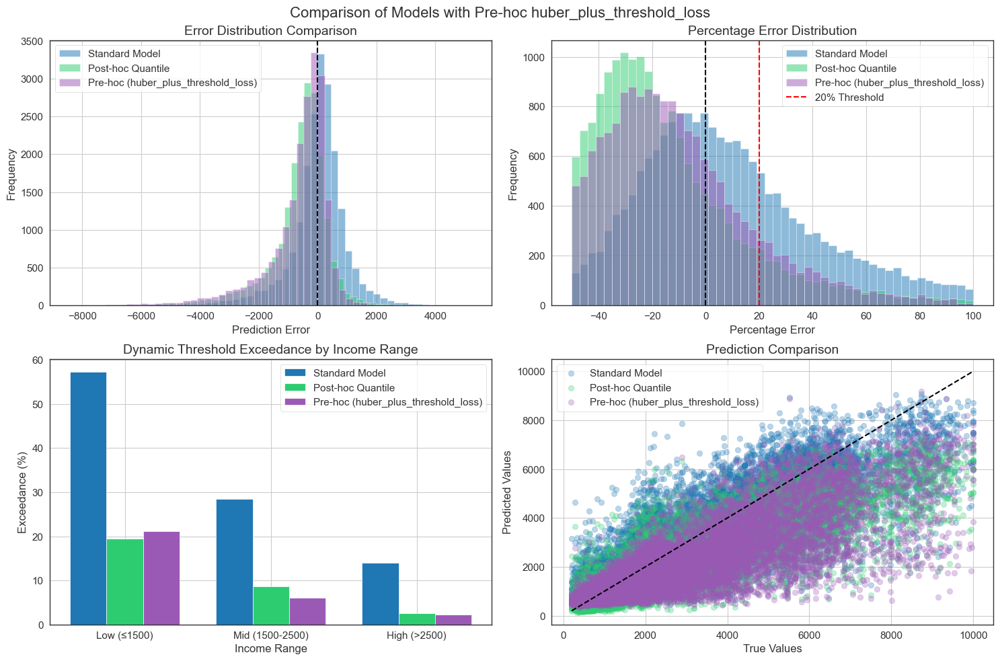


📋 Segment Performance Analysis

📋 Pre-hoc Custom Objective (Train) - huber_plus_threshold_loss:
           segment  count     RMSE    R²  Within 10% (%)  Within 20% (%)  \
0      Low (≤1500)  27275   290.21  0.24           24.76           46.38   
1  Mid (1500-2500)  26108   633.66 -4.60           22.17           43.14   
2     High (>2500)  26617  2076.04 -0.41           14.50           30.21   
3         All Data  80000  1262.43  0.57           20.50           39.94   

   Exceeds Threshold (%)  
0                  20.58  
1                   4.80  
2                   2.23  
3                   9.33  

📋 Pre-hoc Custom Objective (Test) - huber_plus_threshold_loss:
           segment  count     RMSE    R²  Within 10% (%)  Within 20% (%)  \
0      Low (≤1500)   6857   311.26  0.12           23.68           45.12   
1  Mid (1500-2500)   6584   639.05 -4.65           21.45           42.57   
2     High (>2500)   6559  2110.93 -0.48           13.39           29.03   
3         All Data 

/var/folders/9q/6vb57v6n4v7_rq2_zf4lp6dh0000gn/T/ipykernel_1735/3203116465.py:914: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


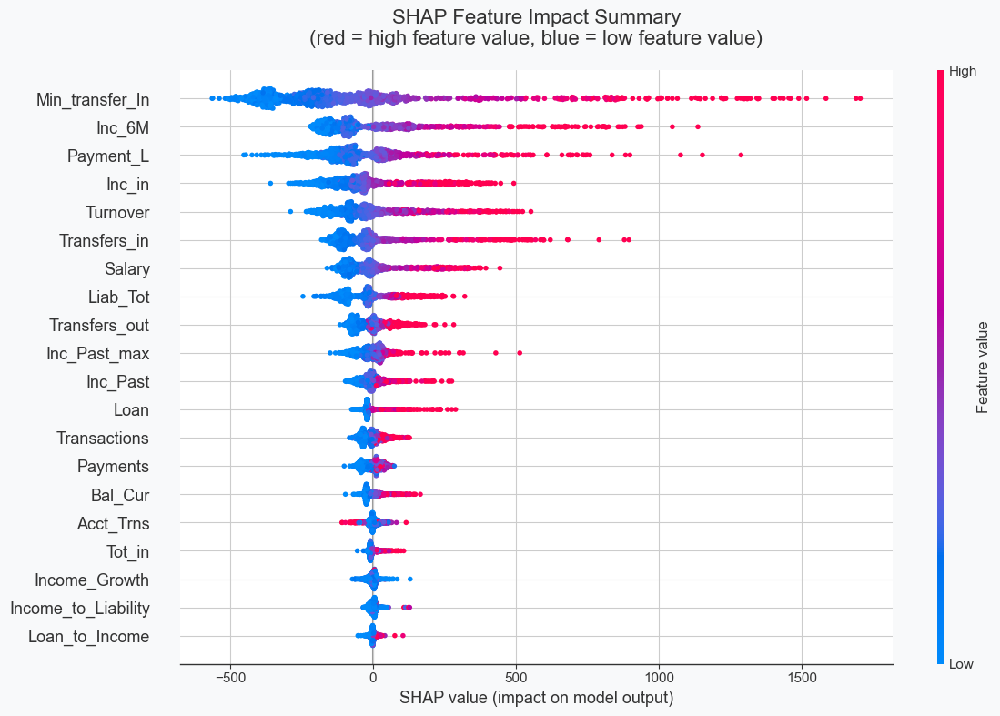


📊 Top 10 Features by Importance:
1. Min_transfer_In: 303.2251
2. Inc_6M: 157.8228
3. Payment_L: 141.3659
4. Inc_in: 118.9904
5. Turnover: 107.4697
6. Transfers_in: 105.9176
7. Salary: 85.5937
8. Liab_Tot: 79.1851
9. Transfers_out: 49.8734
10. Inc_Past_max: 37.5932


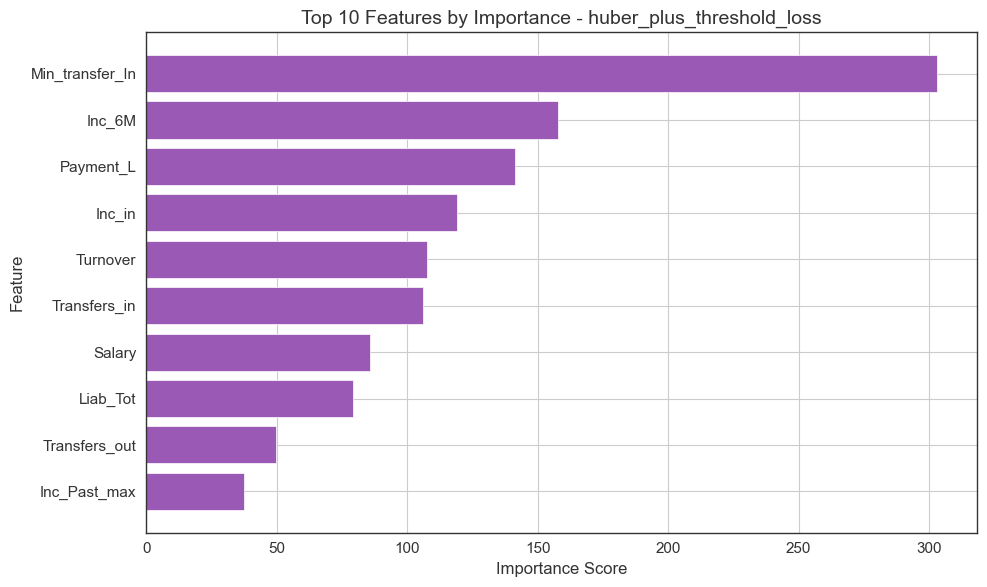


🔍 Analyzing feature dependence...

🔍 Analyzing feature dependence...
Analyzing feature dependence for: Min_transfer_In, Inc_6M, Payment_L, Inc_in, Turnover
Calculating SHAP values...


/var/folders/9q/6vb57v6n4v7_rq2_zf4lp6dh0000gn/T/ipykernel_1735/3203116465.py:1072: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


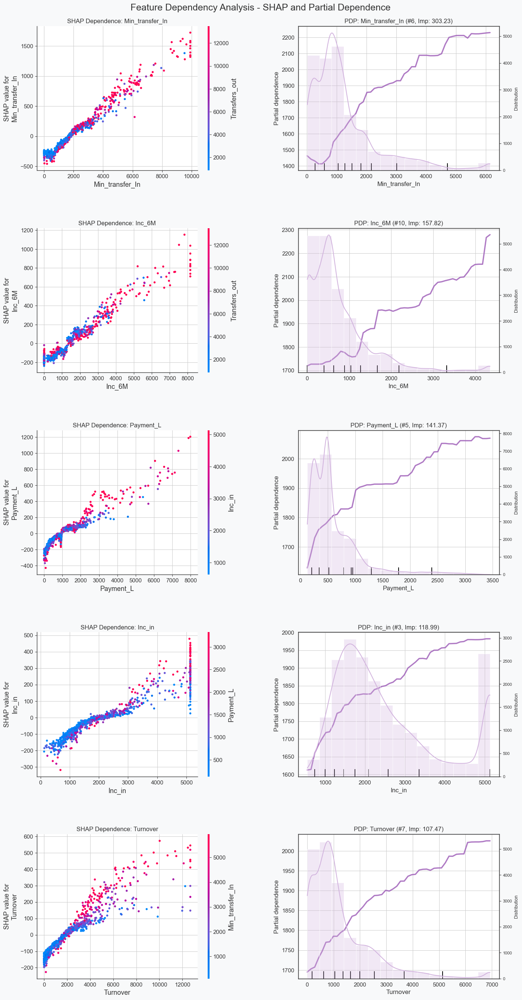


✅ Pre-hoc (huber_plus_threshold_loss) evaluation complete!


In [30]:
# Run the first model with purple color
results1 = run_prehoc_model_evaluation(huber_plus_threshold_loss, color_theme='purple', run_feature_analysis=True)

**✅ Performance Overview (Test Set)**
- **RMSE**: 1276.33
- **MAE**: 801.17
- **R²**: Moderate drop compared to baseline, expected due to added penalty constraints

**📉 Threshold Violation Improvement**
- Violation rate reduced from **33.55% (baseline)** to **10.00%**
- Achieved **close alignment** with the regulatory target of 10%
- Indicates the model successfully learned to avoid excessive overestimation

**📊 Segment-Level Analysis**
- **Low-income group (≤ 1500 GEL)**:
  - Violation rate remains elevated at **21.19%**
  - Model struggled to fully adjust in this group despite applied penalties
- **Mid-income group (1500–2500 GEL)**:
  - Violation rate improved significantly to **6.04%**
- **High-income group (>2500 GEL)**:
  - Violation rate reduced to **2.27%**
- Results show that the model enforces constraints well in **less volatile segments**, but **underperforms in low-income range**

**📈 Interpretability Check (SHAP)**
- Top features remained stable and domain-relevant:
  - `Min_transfer_In`, `Inc_6M`, and `Inc_in` were most impactful
  - No evidence of overfitting or distortion in learned logic
  - Model remains **interpretable and consistent** with baseline feature patterns

**⚠️ Observations**
- Overall threshold alignment was substantially improved
- However, performance remains **imbalanced across segments**
- The **low-income group** continues to pose challenges for compliant modeling

**🧭 Implication**
- The uniform penalty formulation used in the current objective is effective for **global constraint enforcement**
- However, it lacks flexibility to adapt across **segment-specific risk profiles**
- This outcome motivates development of a **segment-aware version** of the objective function with **tailored penalties by income range**

<a id="model-2"></a>
### 5.4.3 Model 2: Segment-Aware Huber + Threshold Penalty

This enhanced pre-hoc objective builds on the standard Huber + Threshold loss by introducing **segment-specific penalty terms** and **error tolerances**. The model treats borrowers from different income groups differently—applying more conservative behavior in sensitive segments (e.g., low-income borrowers) and allowing greater flexibility where regulatory risk is lower.

The total loss for observation *i* in segment *s* is defined as:

$$
\mathcal{L}_i^{(s)} =
\begin{cases}
(\hat{y}_i - y_i)^2 & \text{if } |\hat{y}_i - y_i| \leq \delta_s \\
2\delta_s \cdot |\hat{y}_i - y_i| - \delta_s^2 & \text{otherwise}
\end{cases}
+ \lambda_s \cdot \mathbf{1}_{[\hat{y}_i - y_i > T_i]} \cdot (\hat{y}_i - y_i - T_i)^2
$$

**Where:**

- $ \delta_s $ is the **Huber transition threshold** for segment *s* (e.g., low, mid, high income)
- $ \lambda_s $ is the **penalty weight** for threshold violations in segment *s*
- $ T_i = \max(200,\ 0.2 \cdot y_i) $ is the **dynamic regulatory threshold** for each observation
- $ \mathbf{1}_{[\hat{y}_i - y_i > T_i]} $ is an indicator that activates the penalty term when overestimation exceeds the threshold

**Key characteristics of this loss:**
- **Segment-specific error sensitivity**: The Huber transition point $\delta_s$ controls how tolerant the model is to noise within each group.
- **Segment-aware penalty strength**: $\lambda_s$ controls how harshly each group is penalized for violating the overestimation threshold.
- Enables **differentiated learning** that respects the regulatory sensitivity and risk characteristics of each borrower group.

This approach encourages the model to:
- Be **highly conservative** in low-income segments, where overestimation risk is greatest.
- Allow **greater flexibility** in higher-income segments, where the supervisory risk is lower.
- Maintain balanced compliance and accuracy across the entire population.



=== Training Pre-Hoc Model with segment_aware_huber_threshold_loss ===
[0]	train-rmse:3091.47579	test-rmse:3060.48753
[50]	train-rmse:1396.82849	test-rmse:1398.31817
[100]	train-rmse:1309.32165	test-rmse:1318.34168
[150]	train-rmse:1283.43903	test-rmse:1296.04112
[200]	train-rmse:1265.56188	test-rmse:1280.98521
[250]	train-rmse:1250.65950	test-rmse:1268.66539
[299]	train-rmse:1236.66260	test-rmse:1258.04407

✅ Pre-hoc model training complete!
• Objective Function              : segment_aware_huber_threshold_loss
• Training RMSE                  : 1236.6626
• Test RMSE                      : 1258.0441
• Training MAE                   : 814.1361
• Test MAE                       : 829.7543
• Training Threshold Exceedance : 6.68%
• Test Threshold Exceedance     : 7.23%

📊 Creating analysis dataframes for all models...

📊 Calculating segment metrics...

📊 Model Comparison Summary
--------------------------------------------------------------------------------------------------------------


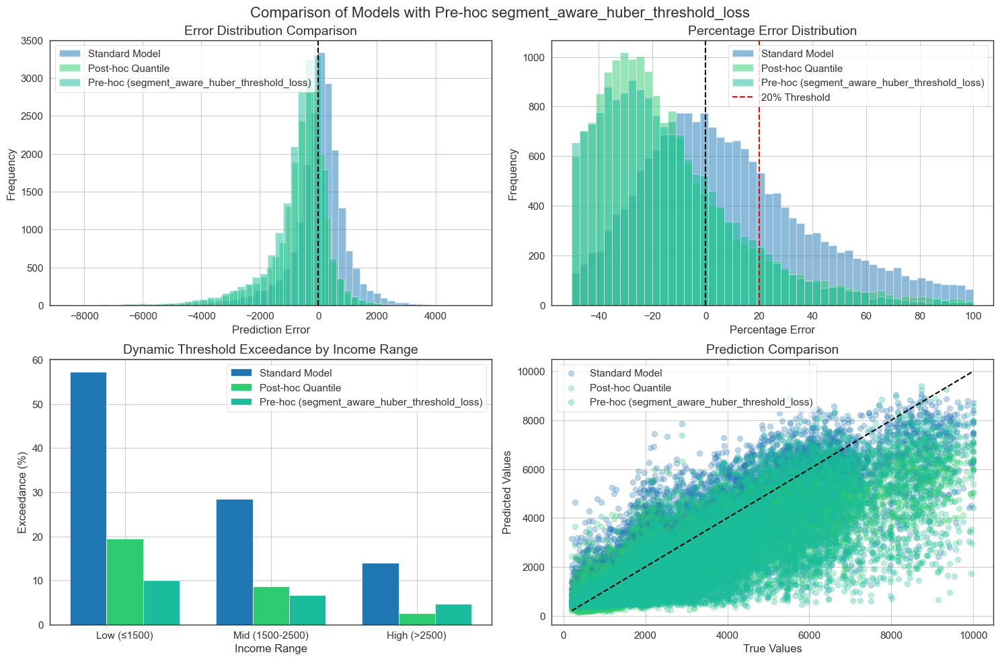


📋 Segment Performance Analysis

📋 Pre-hoc Custom Objective (Train) - segment_aware_huber_threshold_loss:
           segment  count     RMSE    R²  Within 10% (%)  Within 20% (%)  \
0      Low (≤1500)  27275   331.02  0.01           19.32           38.02   
1  Mid (1500-2500)  26108   770.83 -7.29           13.81           28.26   
2     High (>2500)  26617  1975.21 -0.28           18.70           35.82   
3         All Data  80000  1236.66  0.59           17.32           34.10   

   Exceeds Threshold (%)  
0                  10.02  
1                   5.62  
2                   4.28  
3                   6.68  

📋 Pre-hoc Custom Objective (Test) - segment_aware_huber_threshold_loss:
           segment  count     RMSE    R²  Within 10% (%)  Within 20% (%)  \
0      Low (≤1500)   6857   354.36 -0.14           18.86           37.99   
1  Mid (1500-2500)   6584   778.55 -7.38           13.37           27.92   
2     High (>2500)   6559  2021.44 -0.36           17.05           33.82   
3

/var/folders/9q/6vb57v6n4v7_rq2_zf4lp6dh0000gn/T/ipykernel_1735/3203116465.py:914: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


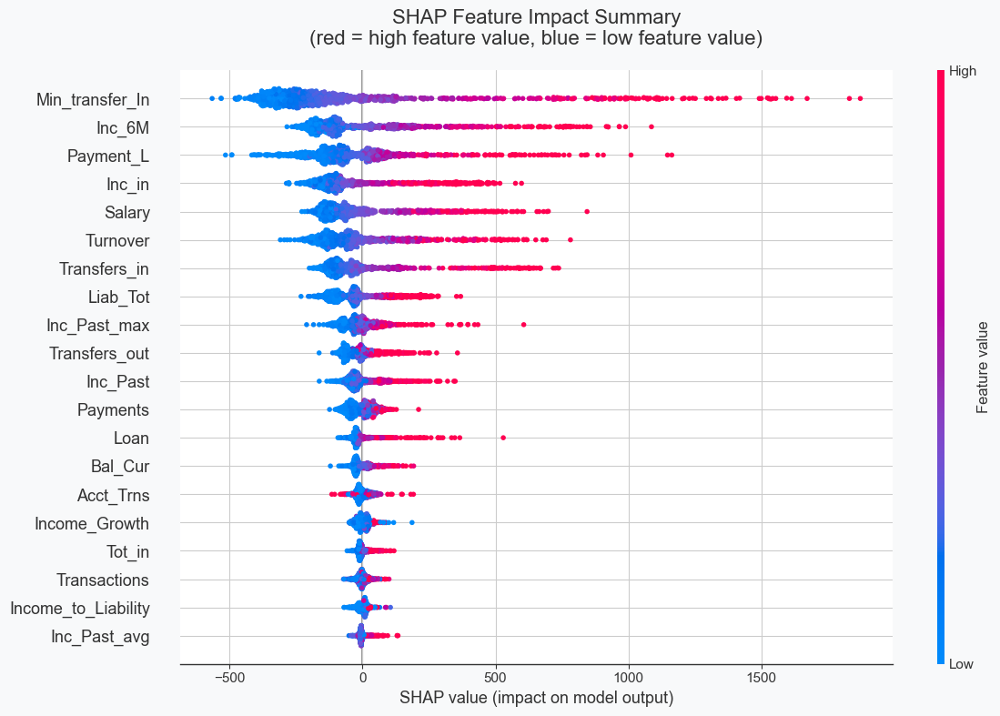


📊 Top 10 Features by Importance:
1. Min_transfer_In: 320.8773
2. Inc_6M: 181.9116
3. Payment_L: 149.0986
4. Inc_in: 148.8236
5. Salary: 134.8447
6. Turnover: 131.9262
7. Transfers_in: 121.3304
8. Liab_Tot: 90.2306
9. Inc_Past_max: 52.1744
10. Transfers_out: 49.6803


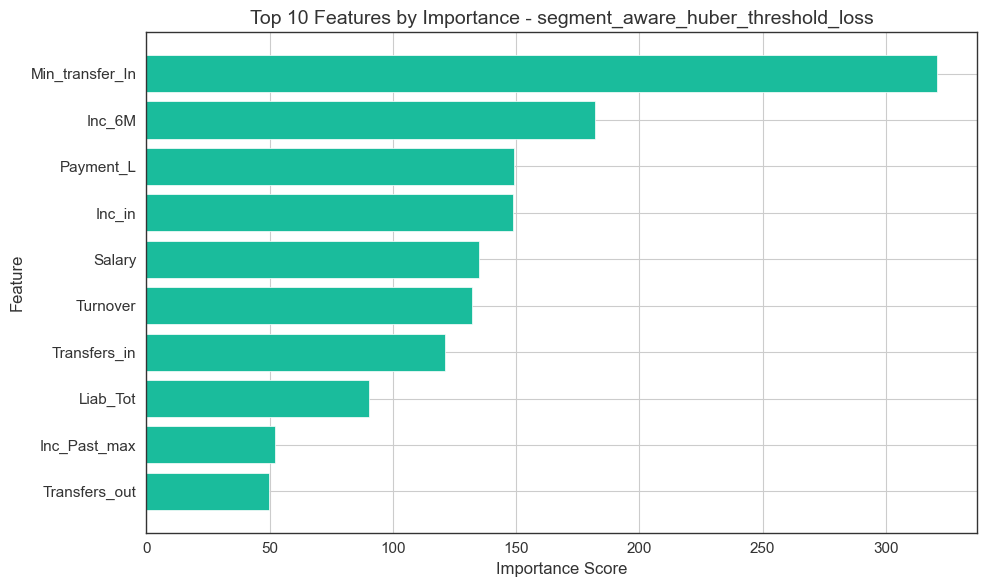


🔍 Analyzing feature dependence...

🔍 Analyzing feature dependence...
Analyzing feature dependence for: Min_transfer_In, Inc_6M, Payment_L, Inc_in, Salary
Calculating SHAP values...


/var/folders/9q/6vb57v6n4v7_rq2_zf4lp6dh0000gn/T/ipykernel_1735/3203116465.py:1072: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


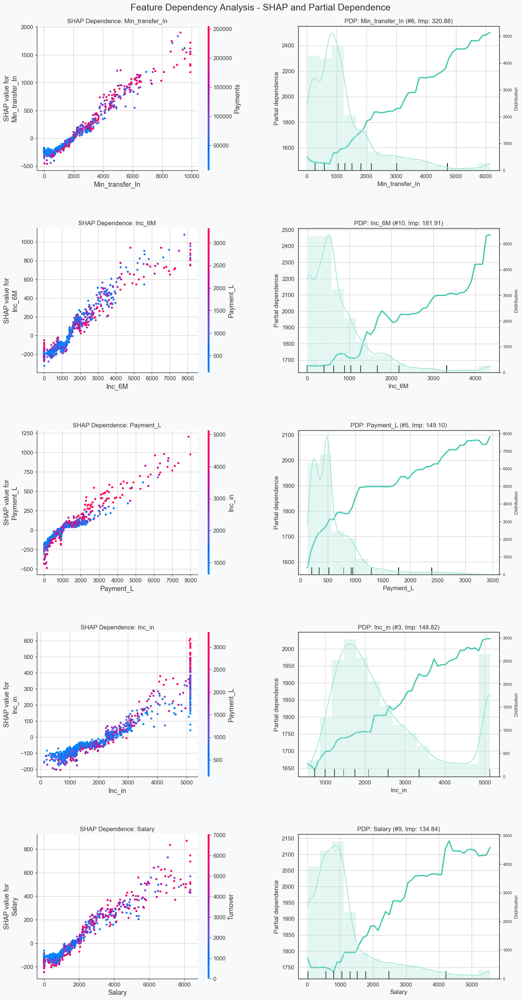


✅ Pre-hoc (segment_aware_huber_threshold_loss) evaluation complete!


In [31]:
# Run the second model with teal color
results2 = run_prehoc_model_evaluation(segment_aware_huber_threshold_loss, color_theme='teal', run_feature_analysis=True)

The segment-aware pre-hoc model extends the uniform Huber + Threshold formulation by tailoring penalties and error tolerances to different income segments. This approach delivers the best overall balance between predictive accuracy and regulatory compliance across all borrower groups.

**📌 Training Configuration**
- Segment-specific Huber thresholds ($\delta_s$) and penalty weights ($\lambda_s$) were selected based on training performance.
- Parameter setup:
  - **Low-income (≤ 1500 GEL)**: δ = 30, λ = 12.0
  - **Mid-income (1500–2500 GEL)**: δ = 80, λ = 3.0
  - **High-income (> 2500 GEL)**: δ = 200, λ = 1.0

**✅ Performance Overview (Test Set)**
- **RMSE**: 1258.04 (lowest among pre-hoc and post-hoc calibrated models)
- **R²**: 0.57 (moderate but stable)
- **Threshold violation rate**: **7.23%**, well below the 10% regulatory ceiling

**📉 Segment-Level Compliance**
- **Low-income**: Violation rate reduced to **10.08%**, a major improvement over **57.27%** in the baseline and **21.19%** in the uniform pre-hoc model
- **Mid-income**: Reduced to **6.73%**, outperforming both the standard and post-hoc models
- **High-income**: Improved to **4.76%**, while preserving accuracy
- These results demonstrate **significant gains in fairness and constraint satisfaction across all segments**

**📈 Accuracy and Fairness Balance**
- The model achieves **more balanced compliance across segments**, in contrast to prior models which underperformed for low-income groups
- **Fewer underestimations** than the post-hoc quantile calibration approach—indicating a better trade-off between conservatism and precision

**🔍 Interpretability (SHAP)**
- Feature rankings remained stable and intuitive:
  - `Min_transfer_In`, `Inc_6M`, and `Inc_in` remained top drivers
  - No irregularities in SHAP behavior were observed, confirming the model maintained **explainability and domain consistency**

**📊 Visual Insights**
- Threshold exceedance plots show consistent alignment across income groups
- Residual error distributions are tighter and more symmetric than in prior models
- Segment-specific calibration curves confirm **robust alignment without overcorrection**

**🎯 Final Assessment**
- The segment-aware model delivers the **strongest regulatory performance** across all models tested
- It preserves the **core predictive structure and interpretability**, while achieving significant improvements in fairness and compliance
- This formulation is highly suitable for **risk-sensitive applications** where uniform penalties fail to reflect heterogeneity across borrower segments

<a id="prehoc-models-comparison"></a>
### 5.4.4 Pre-hoc Models Comparison

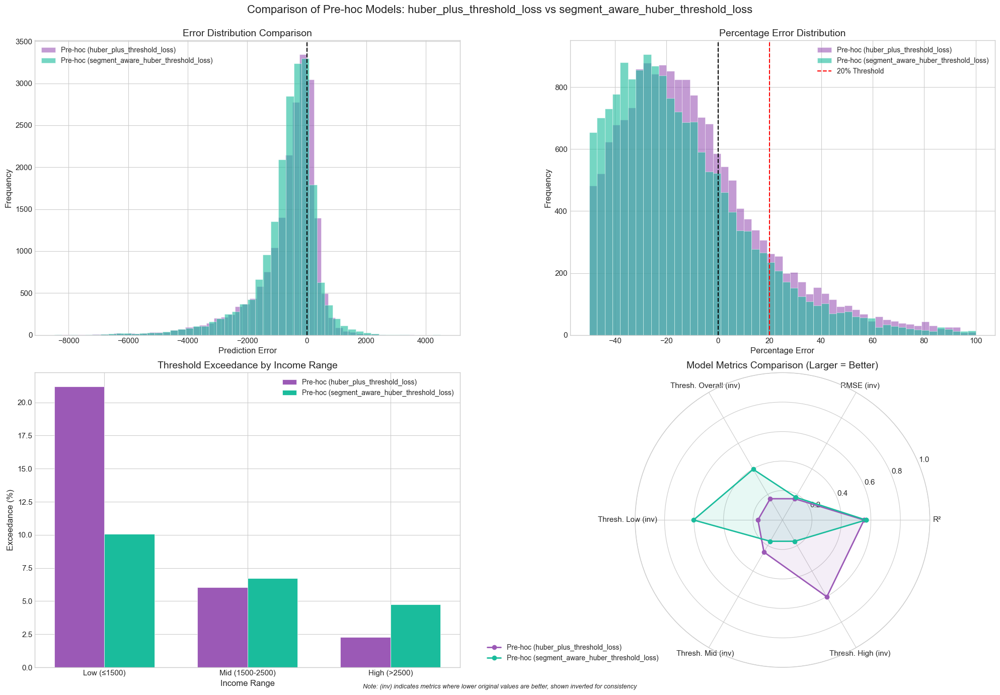


COMPARISON OF OBJECTIVES: huber_plus_threshold_loss vs segment_aware_huber_threshold_loss

Metric                    huber_plus_threshold_loss segment_aware_huber_threshold_loss Difference      Better Model   
----------------------------------------------------------------------------------------------------
R²                        0.5536                    0.5663                    -0.0127         segment_aware_huber_threshold_loss
RMSE                      1276.3277                 1258.0441                 +18.2836        segment_aware_huber_threshold_loss
MAE                       801.1710                  829.7543                  -28.5833        huber_plus_threshold_loss
Within 10%                19.57%                    16.46%                    +3.11%          huber_plus_threshold_loss
Within 20%                39.01%                    33.30%                    +5.70%          huber_plus_threshold_loss
Exceeds Threshold         10.00%                    7.23%             

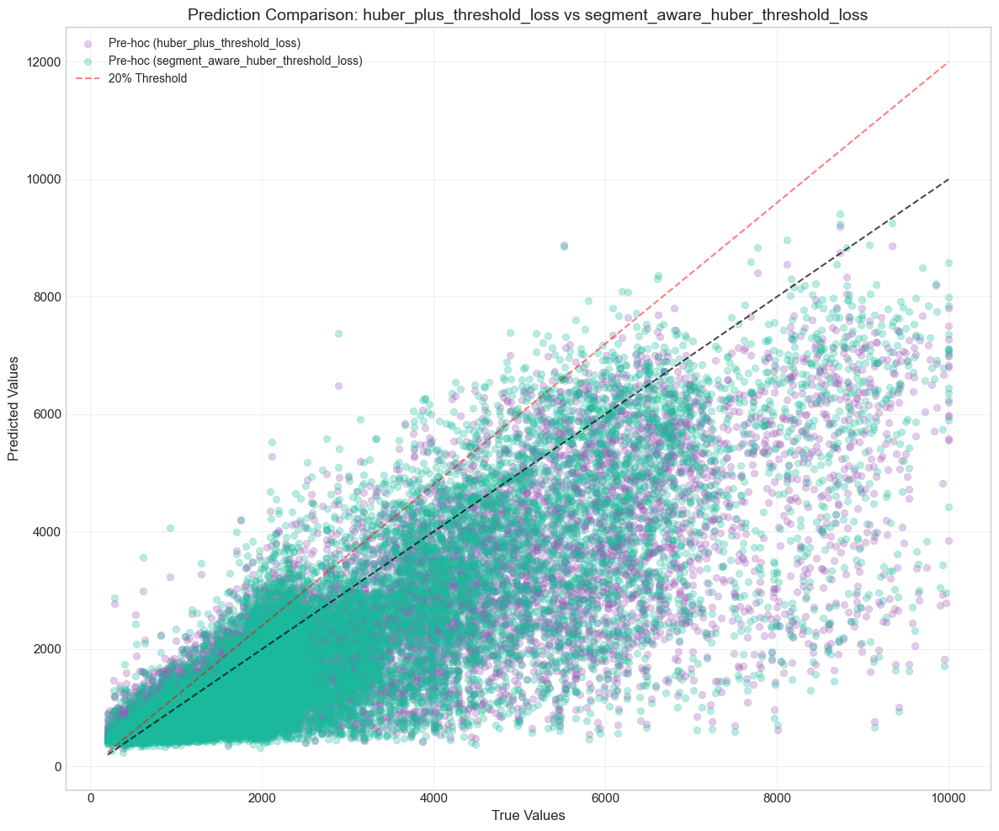


CONCLUSION

Based on threshold exceedance, segment_aware_huber_threshold_loss performs better with 2.77% improvement.
For prediction accuracy (RMSE), segment_aware_huber_threshold_loss performs better with 18.2836 improvement.

Segment-specific performance:
• Low (≤1500): segment_aware_huber_threshold_loss performs better with 11.11% improvement in threshold exceedance.
• Mid (1500-2500): huber_plus_threshold_loss performs better with 0.68% improvement in threshold exceedance.
• High (>2500): huber_plus_threshold_loss performs better with 2.49% improvement in threshold exceedance.


In [32]:
# Compare the models with the specified colors
compare_prehoc_models(results1, results2, color_theme1='purple', color_theme2='teal')

To wrap up the modeling analysis, this section compares the four approaches tested:
**Baseline XGBoost**, **Post-hoc Quantile Calibration**, **Pre-hoc Huber + Threshold**, and **Segment-Aware Huber + Threshold**.
The evaluation focuses on prediction accuracy, regulatory compliance, and consistency across income segments.

---

**📊 Overall Model Comparison**
- **Baseline XGBoost**:
  - Highest predictive accuracy (**RMSE: 958.66**, **R²: 0.75**)
  - Fails regulatory requirements (threshold violations: **33.55%**)
  - Especially poor in the low-income segment (violations: **57.27%**)

- **Post-hoc Calibration (q = 0.20)**:
  - Strong compliance gains (violations: **10.34%**)
  - Moderate drop in accuracy (RMSE: **1171.75**, R²: **0.62**)
  - Most effective for **high-income** predictions (violations reduced to **2.58%**), but low-income violations remain high (**19.45%**)

- **Pre-hoc Huber + Threshold**:
  - Meets regulatory limits (violations: **10.00%**)
  - Slightly lower accuracy than post-hoc (RMSE: **1276.33**, R²: **0.55**)
  - Still struggles with low-income compliance (violations: **21.19%**)

- **Segment-Aware Pre-hoc**:
  - Best overall regulatory performance (violations: **7.23%**, lowest among all)
  - Competitive accuracy (RMSE: **1258.04**, R²: **0.57**)
  - Only model to bring **all segment violation rates** below 11%
  - Most **balanced and consistent** performance across segments

---

**📉 Segment-Level Threshold Compliance**
| Income Segment | Standard | Post-hoc | Pre-hoc | Segment-Aware | Best |
|--------------------|----------|----------|---------|----------------|------|
| Low (≤1500 GEL) | 57.27% | 19.45% | 21.19% | **10.08%** | ✅ |
| Mid (1500–2500 GEL)| 28.40% | 8.58% | **6.04%**| 6.73% | — |
| High (>2500 GEL) | 13.92% | **2.58%**| 2.27% | 4.76% | — |
| **All Data** | 33.55% | 10.34% | 10.00% | **7.23%** | ✅ |

- Only the **segment-aware model** consistently reduces violations **across all income groups**, including the most challenging—**low-income borrowers**.
- The segment-aware approach demonstrates the **most balanced performance across segments**, with violation rates that are more similar across income groups (**4.76% to 10.08%** range) compared to other models that either over-optimize high-income segments while leaving low-income violations high, or create extreme disparities between segments.

---

**🔍 Final Insights**
- **Post-hoc calibration** is simple and improves compliance fast, but introduces a risk of **underestimation** and creates **unbalanced segment performance** (very low violations in high-income but still high in low-income).
- **Uniform pre-hoc** improves compliance overall but lacks **segment adaptivity**, especially for low-income groups.
- **Segment-aware pre-hoc modeling** delivers the **most robust, fair, and regulation-aligned** outcomes with **more equitable performance** across all borrower segments.

---

**✅ Recommendation**
The **Segment-Aware Huber + Threshold Loss** is the most suitable approach for deployment in **regulation-constrained** environments.
- ✔️ Reduces threshold violations to under **10% in all segments**
- ✔️ Maintains interpretability and SHAP consistency
- ✔️ Adjusts dynamically to borrower group characteristics
- ✔️ Eliminates the need for fragile post-training calibration
- ✔️ Provides **most balanced segment performance** with similar violation rates across income groups

This approach provides a **scalable, interpretable, and regulation-aligned solution** for income prediction models where fairness, compliance, and risk sensitivity are essential.

---

---

---

## 📘 Closing Notes

This notebook accompanies the bachelor thesis:  
**"Income Estimation Models Analysis: Balancing Accuracy with Regulatory Requirements in the Georgian Banking Sector"**

**Author**: Sandro Gogaladze  
**Institution**: International School of Economics at TSU (ISET)  
**Supervisor**: Shota Natenadze

---

## 🔚 Conclusion

This notebook documents the full modeling pipeline and evaluation process behind the thesis. The results show that traditional, one-size-fits-all models—even when accurate on average—often violate regulatory constraints, particularly in low-income segments. In contrast, **segment-aware modeling** achieves better compliance and fairness without compromising interpretability.

---

## 🎯 Key Takeaways

- Standard models offer strong overall accuracy but fail regulatory compliance, especially for low-income groups.
- Post-hoc calibration reduces overestimation but may lead to underfitting or uneven adjustments across segments.
- Pre-hoc optimization with a **segment-aware Huber + threshold loss** provides the best trade-off between accuracy and regulatory alignment.
- A uniform modeling strategy is inadequate for risk-sensitive applications—**segment customization is essential**.

---

## 📁 Future Work

- Validate the models on real customer datasets from Georgian financial institutions.
- Simulate loan approval pipelines using predicted incomes to assess operational impact.
- Introduce stress-testing frameworks to evaluate robustness under income shocks and behavioral drift.

---

## 🙏 Acknowledgements

Special thanks to:
- **Shota Natenadze** for academic supervision and ongoing guidance.
- **Bank of Georgia** for access to synthetic data and domain insights.
- **National Bank of Georgia** for sharing regulatory expertise and industry practices.

---

## 📂 Repository Note

This notebook is an official component of the bachelor thesis repository. It includes core implementation code, evaluation metrics, and visualizations referenced throughout the thesis.